In [1]:
# Importing all the Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler
import keras.backend as K
from keras.losses import mean_squared_error
import tensorflow as tf

In [26]:
# Importing The Dataset
df = pd.read_csv('bodyfat.csv')
df.head()

,Density,BodyFat,Age,Weight,Height,Neck,Chest,Abdomen,Hip,Thigh,Knee,Ankle,Biceps,Forearm,Wrist
0,1.0708,12.3,23,154.25,67.75,36.2,93.1,85.2,94.5,59.0,37.3,21.9,32.0,27.4,17.1
1,1.0853,6.1,22,173.25,72.25,38.5,93.6,83.0,98.7,58.7,37.3,23.4,30.5,28.9,18.2
2,1.0414,25.3,22,154.00,66.25,34.0,95.8,87.9,99.2,59.6,38.9,24.0,28.8,25.2,16.6
3,1.0751,10.4,26,184.75,72.25,37.4,101.8,86.4,101.2,60.1,37.3,22.8,32.4,29.4,18.2
4,1.0340,28.7,24,184.25,71.25,34.4,97.3,100.0,101.9,63.2,42.2,24.0,32.2,27.7,17.7


In [27]:
# Scaling and Splitting dataset into 70% train, 15% validation and 15% test
Y = df['BodyFat']
X = df.drop('BodyFat', axis = 1)
scaler = StandardScaler()
X = scaler.fit_transform(X)
Y = np.array(Y)
X_train, X_val_test, Y_train, Y_val_test = train_test_split(X,Y, train_size = 0.7) # Splitting into 2 parts with 70-30 split
X_val, X_test, Y_val, Y_test = train_test_split(X_val_test ,Y_val_test , test_size = 0.5, random_state = 10) # Splitting the 30% into 2 more equal parts(15-15)

In [8]:
# Creating the models and printing the LOSS and RMSE values
models = {}
models['Layer'] = []
models['Activation'] = []
models['Regulariser'] = []
models['Epochs'] = []
models['Lr'] = []
models['History'] = []
models['Performance'] = []
for Layer in range(1,4):
  for Activation in ['relu' , 'sigmoid']:
    for reg in [None, 'l1', 'l2']:
      for Lr in [1, 0.3, 0.1, 0.01,0.03,0.001,0.0001,0.00001]:
        for Epoch in [10,20,30,40]:          
          model = tf.keras.Sequential()
# First Model Having Only 1 Hidden Layer                    
          if Layer == 1:
            model.add(tf.keras.layers.InputLayer(input_shape = (14, ), name = 'InputLayer'))
            model.add( tf.keras.layers.Dense(128, activation = Activation, input_dim = 14, kernel_regularizer = reg, name = 'HiddenLayer'))
            model.add( tf.keras.layers.Normalization(name = 'norm_1')) # Normalization
            model.add( tf.keras.layers.Dense(1, activation = 'linear', name = 'OutputLayer'))
# Second Model With 2 Hidden Layers
          if Layer == 2:
            model.add(tf.keras.layers.InputLayer(input_shape = (14,), name = 'Input Layer'))
            model.add( tf.keras.layers.Dense(128, activation = Activation, kernel_regularizer = reg, name = 'HiddenLayer1'))
            model.add( tf.keras.layers.Normalization(name = 'norm_1')) # Normalization
            model.add( tf.keras.layers.Dense(64, activation = Activation, kernel_regularizer = reg, name = 'HiddenLayer2'))
            model.add( tf.keras.layers.Normalization(name = 'norm_2')) # Normalization
            model.add( tf.keras.layers.Dense(1, activation = 'linear', name = 'OutputLayer'))
# Third Model with 3 Hidden Layers
          if Layer == 3:
            model.add(tf.keras.layers.InputLayer(input_shape = (14,), name = 'Input Layer'))
            model.add( tf.keras.layers.Dense(128, activation = Activation, kernel_regularizer = reg, name = 'HiddenLayer1'))
            model.add( tf.keras.layers.Normalization(name = 'norm_1'))  # Normalization
            model.add( tf.keras.layers.Dense(64, activation = Activation, kernel_regularizer = reg, name = 'HiddenLayer2'))
            model.add( tf.keras.layers.Normalization(name = 'norm_2')) # Normalization
            model.add( tf.keras.layers.Dense(32, activation = Activation, kernel_regularizer = reg, name = 'HiddenLayer3'))
            model.add( tf.keras.layers.Normalization(name = 'norm_3')) # Normalization
            model.add( tf.keras.layers.Dense(1, activation = 'linear', name = 'OutputLayer'))      
# Printing Details of the model along with Loss and RMSE and Compiling the Models
          print(f""" Layer: {Layer}, Activation: {Activation}, Reg:  {reg}, Learning Rate: {Lr}, Epochs: {Epoch}""")
          opt = tf.keras.optimizers.Adam(learning_rate = Lr )
          model.compile(optimizer = opt,
                        metrics = [tf.keras.metrics.RootMeanSquaredError()],
                        loss = tf.keras.losses.MeanSquaredError())
# Saving the values in history
          history = model.fit(x = X_train, y= Y_train, 
                              epochs = Epoch,
                              validation_data = (X_val, Y_val),
                              verbose = 0)
          performance = model.evaluate(x = X_test, y= Y_test)
# Appending all the values          
          models['Layer'].append(Layer)
          models['Activation'].append(Activation)
          models['Regulariser'].append(reg)
          models['Epochs'].append(Epoch)
          models['Lr'].append(Lr)
          models['History'].append(history)
          models['Performance'].append(performance)


 Layer: 1, Activation: relu, Reg:  None, Learning Rate: 1, Epochs: 10
2/2 [==============================] - 0s 7ms/step - loss: 3583.9514 - root_mean_squared_error: 59.8661
 Layer: 1, Activation: relu, Reg:  None, Learning Rate: 1, Epochs: 20
2/2 [==============================] - 0s 7ms/step - loss: 134.0956 - root_mean_squared_error: 11.5800
 Layer: 1, Activation: relu, Reg:  None, Learning Rate: 1, Epochs: 30
2/2 [==============================] - 0s 7ms/step - loss: 64.7579 - root_mean_squared_error: 8.0472
 Layer: 1, Activation: relu, Reg:  None, Learning Rate: 1, Epochs: 40
2/2 [==============================] - 0s 7ms/step - loss: 36.0336 - root_mean_squared_error: 6.0028
 Layer: 1, Activation: relu, Reg:  None, Learning Rate: 0.3, Epochs: 10
2/2 [==============================] - 0s 4ms/step - loss: 30.6151 - root_mean_squared_error: 5.5331
 Layer: 1, Activation: relu, Reg:  None, Learning Rate: 0.3, Epochs: 20
2/2 [==============================] - 0s 8ms/step - loss: 6.4886 

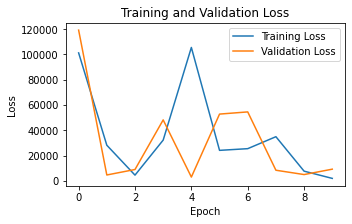

	Layers: 1
        Activation: relu
        Regularisation: None
        Epochs: 10
        Learning Rate: 1
        Test Loss: 3583.951416015625
        Test RMSE: 59.866111755371094





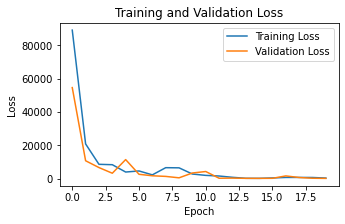

	Layers: 1
        Activation: relu
        Regularisation: None
        Epochs: 20
        Learning Rate: 1
        Test Loss: 134.09559631347656
        Test RMSE: 11.579965591430664





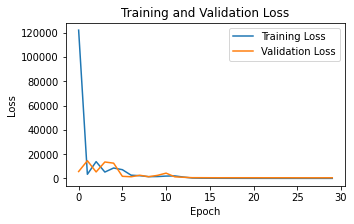

	Layers: 1
        Activation: relu
        Regularisation: None
        Epochs: 30
        Learning Rate: 1
        Test Loss: 64.75786590576172
        Test RMSE: 8.047226905822754





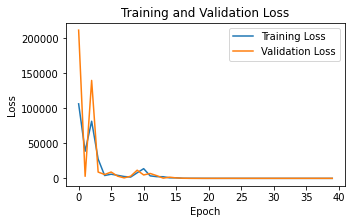

	Layers: 1
        Activation: relu
        Regularisation: None
        Epochs: 40
        Learning Rate: 1
        Test Loss: 36.03358840942383
        Test RMSE: 6.002798557281494





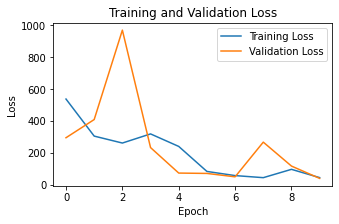

	Layers: 1
        Activation: relu
        Regularisation: None
        Epochs: 10
        Learning Rate: 0.3
        Test Loss: 30.6151065826416
        Test RMSE: 5.533092021942139





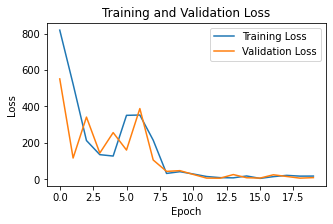

	Layers: 1
        Activation: relu
        Regularisation: None
        Epochs: 20
        Learning Rate: 0.3
        Test Loss: 6.488620758056641
        Test RMSE: 2.5472772121429443





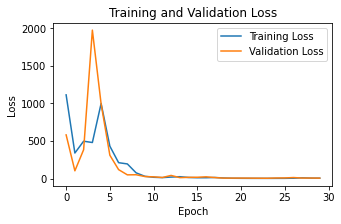

	Layers: 1
        Activation: relu
        Regularisation: None
        Epochs: 30
        Learning Rate: 0.3
        Test Loss: 5.646758079528809
        Test RMSE: 2.376290798187256





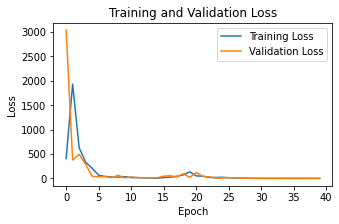

	Layers: 1
        Activation: relu
        Regularisation: None
        Epochs: 40
        Learning Rate: 0.3
        Test Loss: 1.2235288619995117
        Test RMSE: 1.1061323881149292





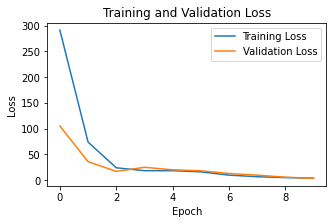

	Layers: 1
        Activation: relu
        Regularisation: None
        Epochs: 10
        Learning Rate: 0.1
        Test Loss: 3.947014570236206
        Test RMSE: 1.986709475517273





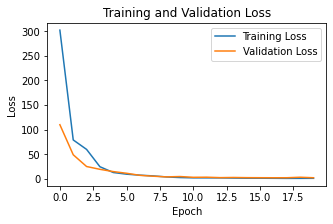

	Layers: 1
        Activation: relu
        Regularisation: None
        Epochs: 20
        Learning Rate: 0.1
        Test Loss: 1.4314427375793457
        Test RMSE: 1.1964291334152222





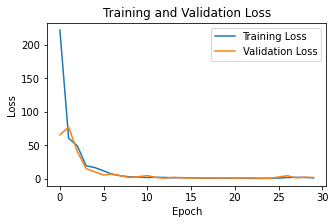

	Layers: 1
        Activation: relu
        Regularisation: None
        Epochs: 30
        Learning Rate: 0.1
        Test Loss: 1.1745259761810303
        Test RMSE: 1.0837554931640625





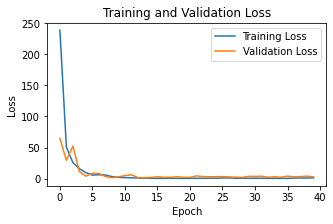

	Layers: 1
        Activation: relu
        Regularisation: None
        Epochs: 40
        Learning Rate: 0.1
        Test Loss: 2.040123701095581
        Test RMSE: 1.4283289909362793





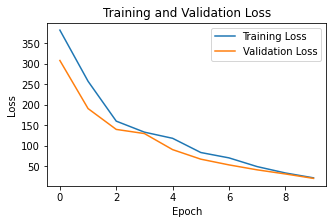

	Layers: 1
        Activation: relu
        Regularisation: None
        Epochs: 10
        Learning Rate: 0.01
        Test Loss: 23.08367347717285
        Test RMSE: 4.804547309875488





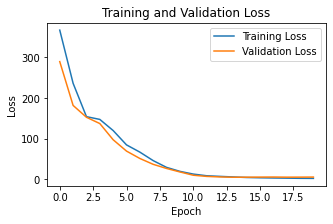

	Layers: 1
        Activation: relu
        Regularisation: None
        Epochs: 20
        Learning Rate: 0.01
        Test Loss: 3.5195581912994385
        Test RMSE: 1.8760485649108887





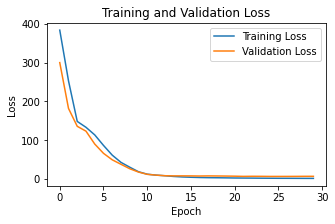

	Layers: 1
        Activation: relu
        Regularisation: None
        Epochs: 30
        Learning Rate: 0.01
        Test Loss: 2.8205695152282715
        Test RMSE: 1.6794551610946655





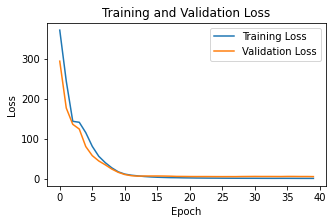

	Layers: 1
        Activation: relu
        Regularisation: None
        Epochs: 40
        Learning Rate: 0.01
        Test Loss: 2.1135358810424805
        Test RMSE: 1.4538004398345947





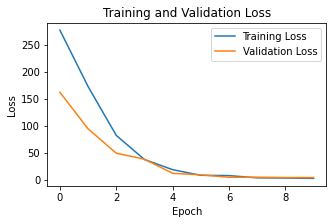

	Layers: 1
        Activation: relu
        Regularisation: None
        Epochs: 10
        Learning Rate: 0.03
        Test Loss: 2.9694461822509766
        Test RMSE: 1.7232080698013306





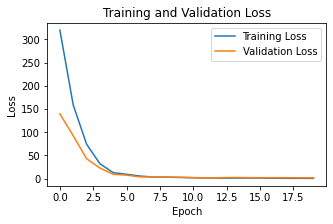

	Layers: 1
        Activation: relu
        Regularisation: None
        Epochs: 20
        Learning Rate: 0.03
        Test Loss: 1.6816046237945557
        Test RMSE: 1.296766996383667





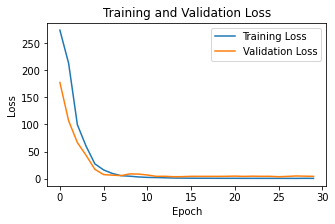

	Layers: 1
        Activation: relu
        Regularisation: None
        Epochs: 30
        Learning Rate: 0.03
        Test Loss: 1.3219478130340576
        Test RMSE: 1.1497598886489868





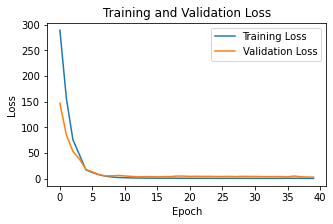

	Layers: 1
        Activation: relu
        Regularisation: None
        Epochs: 40
        Learning Rate: 0.03
        Test Loss: 1.4571925401687622
        Test RMSE: 1.2071423530578613





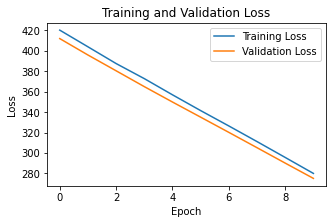

	Layers: 1
        Activation: relu
        Regularisation: None
        Epochs: 10
        Learning Rate: 0.001
        Test Loss: 309.3329772949219
        Test RMSE: 17.58786392211914





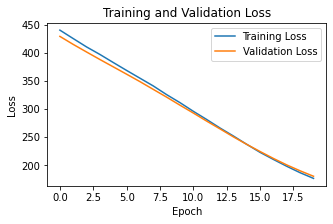

	Layers: 1
        Activation: relu
        Regularisation: None
        Epochs: 20
        Learning Rate: 0.001
        Test Loss: 204.1693572998047
        Test RMSE: 14.28878402709961





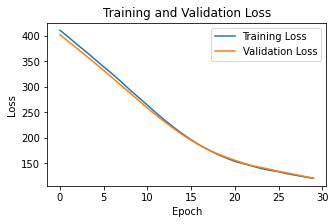

	Layers: 1
        Activation: relu
        Regularisation: None
        Epochs: 30
        Learning Rate: 0.001
        Test Loss: 137.63186645507812
        Test RMSE: 11.731660842895508





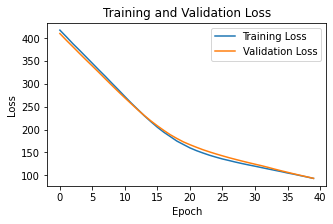

	Layers: 1
        Activation: relu
        Regularisation: None
        Epochs: 40
        Learning Rate: 0.001
        Test Loss: 108.26338958740234
        Test RMSE: 10.404969215393066





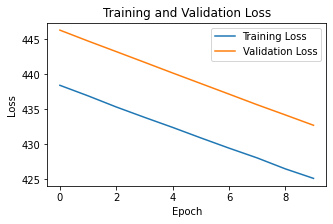

	Layers: 1
        Activation: relu
        Regularisation: None
        Epochs: 10
        Learning Rate: 0.0001
        Test Loss: 454.31414794921875
        Test RMSE: 21.314645767211914





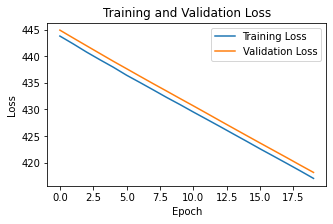

	Layers: 1
        Activation: relu
        Regularisation: None
        Epochs: 20
        Learning Rate: 0.0001
        Test Loss: 445.9422302246094
        Test RMSE: 21.11734390258789





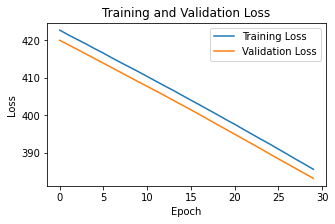

	Layers: 1
        Activation: relu
        Regularisation: None
        Epochs: 30
        Learning Rate: 0.0001
        Test Loss: 415.67608642578125
        Test RMSE: 20.38813591003418





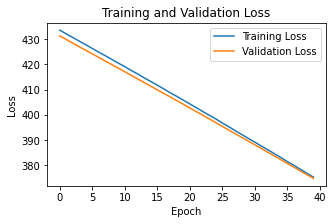

	Layers: 1
        Activation: relu
        Regularisation: None
        Epochs: 40
        Learning Rate: 0.0001
        Test Loss: 403.7093505859375
        Test RMSE: 20.092519760131836





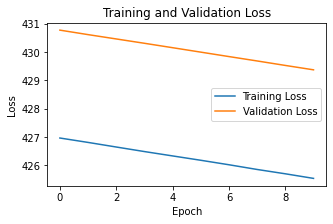

	Layers: 1
        Activation: relu
        Regularisation: None
        Epochs: 10
        Learning Rate: 1e-05
        Test Loss: 452.9389343261719
        Test RMSE: 21.28236198425293





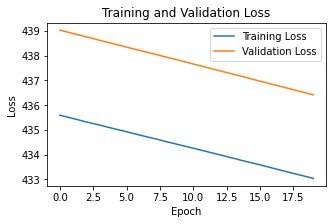

	Layers: 1
        Activation: relu
        Regularisation: None
        Epochs: 20
        Learning Rate: 1e-05
        Test Loss: 460.7276916503906
        Test RMSE: 21.464569091796875





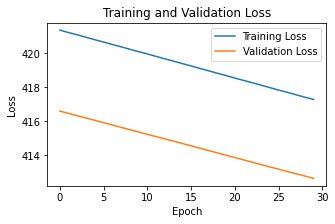

	Layers: 1
        Activation: relu
        Regularisation: None
        Epochs: 30
        Learning Rate: 1e-05
        Test Loss: 443.1048583984375
        Test RMSE: 21.05005645751953





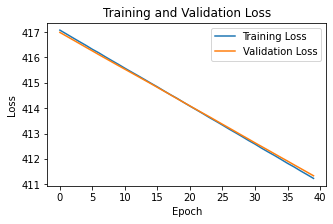

	Layers: 1
        Activation: relu
        Regularisation: None
        Epochs: 40
        Learning Rate: 1e-05
        Test Loss: 440.84637451171875
        Test RMSE: 20.996341705322266





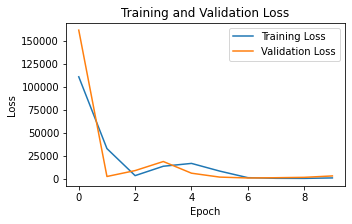

	Layers: 1
        Activation: relu
        Regularisation: l1
        Epochs: 10
        Learning Rate: 1
        Test Loss: 1106.070556640625
        Test RMSE: 32.94622802734375





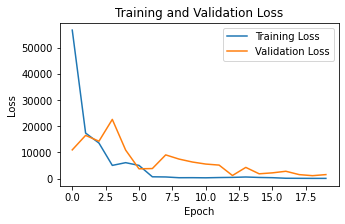

	Layers: 1
        Activation: relu
        Regularisation: l1
        Epochs: 20
        Learning Rate: 1
        Test Loss: 74.49819946289062
        Test RMSE: 7.232966423034668





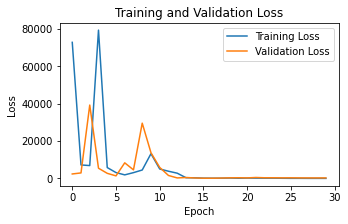

	Layers: 1
        Activation: relu
        Regularisation: l1
        Epochs: 30
        Learning Rate: 1
        Test Loss: 41.42182540893555
        Test RMSE: 4.591618061065674





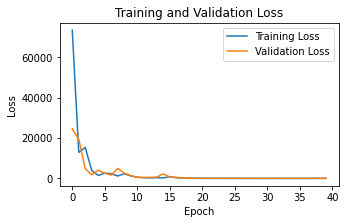

	Layers: 1
        Activation: relu
        Regularisation: l1
        Epochs: 40
        Learning Rate: 1
        Test Loss: 56.07570266723633
        Test RMSE: 6.072416305541992





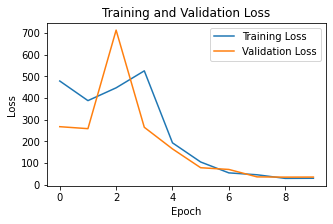

	Layers: 1
        Activation: relu
        Regularisation: l1
        Epochs: 10
        Learning Rate: 0.3
        Test Loss: 25.033395767211914
        Test RMSE: 3.9251091480255127





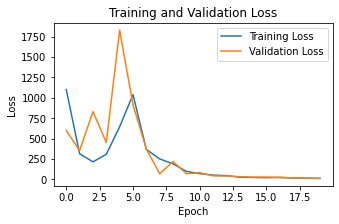

	Layers: 1
        Activation: relu
        Regularisation: l1
        Epochs: 20
        Learning Rate: 0.3
        Test Loss: 11.50119400024414
        Test RMSE: 2.128185510635376





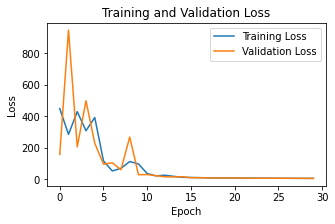

	Layers: 1
        Activation: relu
        Regularisation: l1
        Epochs: 30
        Learning Rate: 0.3
        Test Loss: 4.873104095458984
        Test RMSE: 0.9813826680183411





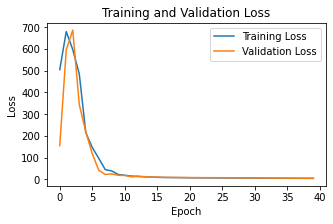

	Layers: 1
        Activation: relu
        Regularisation: l1
        Epochs: 40
        Learning Rate: 0.3
        Test Loss: 4.805913925170898
        Test RMSE: 1.089857578277588





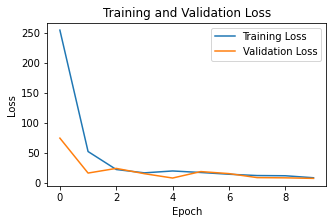

	Layers: 1
        Activation: relu
        Regularisation: l1
        Epochs: 10
        Learning Rate: 0.1
        Test Loss: 8.151152610778809
        Test RMSE: 2.090468406677246





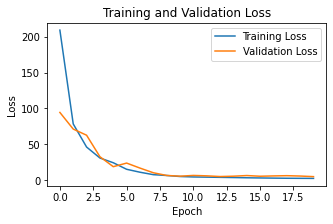

	Layers: 1
        Activation: relu
        Regularisation: l1
        Epochs: 20
        Learning Rate: 0.1
        Test Loss: 2.8177952766418457
        Test RMSE: 0.9963085651397705





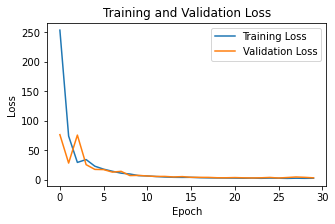

	Layers: 1
        Activation: relu
        Regularisation: l1
        Epochs: 30
        Learning Rate: 0.1
        Test Loss: 3.765394449234009
        Test RMSE: 1.52333664894104





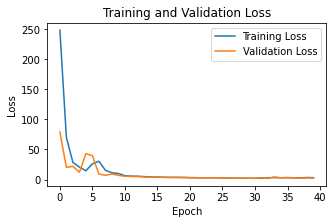

	Layers: 1
        Activation: relu
        Regularisation: l1
        Epochs: 40
        Learning Rate: 0.1
        Test Loss: 3.0317020416259766
        Test RMSE: 1.382485270500183





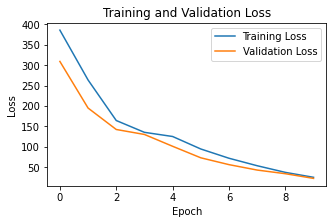

	Layers: 1
        Activation: relu
        Regularisation: l1
        Epochs: 10
        Learning Rate: 0.01
        Test Loss: 24.33399200439453
        Test RMSE: 4.6656012535095215





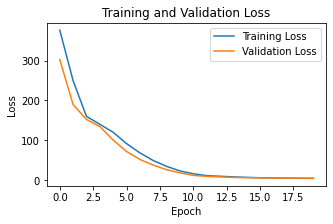

	Layers: 1
        Activation: relu
        Regularisation: l1
        Epochs: 20
        Learning Rate: 0.01
        Test Loss: 5.435354232788086
        Test RMSE: 1.7826372385025024





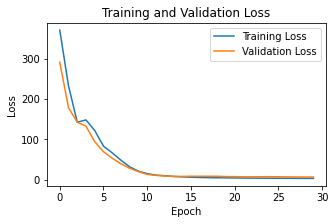

	Layers: 1
        Activation: relu
        Regularisation: l1
        Epochs: 30
        Learning Rate: 0.01
        Test Loss: 4.321056365966797
        Test RMSE: 1.4742625951766968





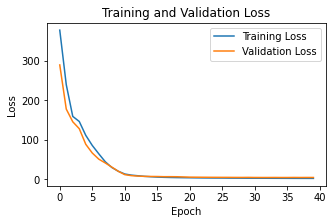

	Layers: 1
        Activation: relu
        Regularisation: l1
        Epochs: 40
        Learning Rate: 0.01
        Test Loss: 3.305846691131592
        Test RMSE: 1.2411296367645264





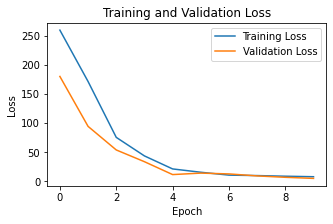

	Layers: 1
        Activation: relu
        Regularisation: l1
        Epochs: 10
        Learning Rate: 0.03
        Test Loss: 5.786981582641602
        Test RMSE: 1.7632322311401367





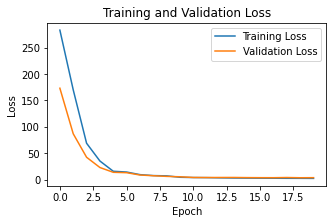

	Layers: 1
        Activation: relu
        Regularisation: l1
        Epochs: 20
        Learning Rate: 0.03
        Test Loss: 3.2401585578918457
        Test RMSE: 1.144033432006836





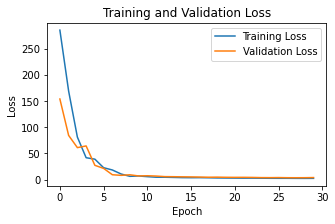

	Layers: 1
        Activation: relu
        Regularisation: l1
        Epochs: 30
        Learning Rate: 0.03
        Test Loss: 2.9736320972442627
        Test RMSE: 1.1239339113235474





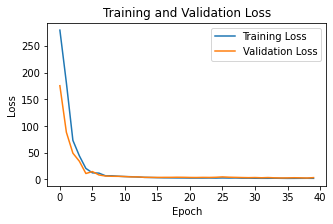

	Layers: 1
        Activation: relu
        Regularisation: l1
        Epochs: 40
        Learning Rate: 0.03
        Test Loss: 3.007704019546509
        Test RMSE: 1.3134260177612305





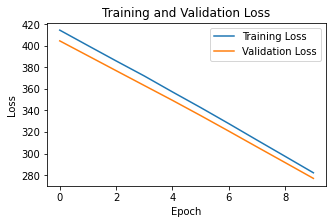

	Layers: 1
        Activation: relu
        Regularisation: l1
        Epochs: 10
        Learning Rate: 0.001
        Test Loss: 309.7447204589844
        Test RMSE: 17.545469284057617





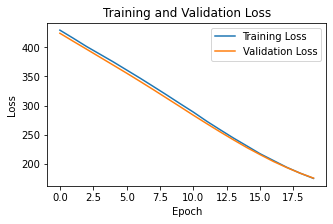

	Layers: 1
        Activation: relu
        Regularisation: l1
        Epochs: 20
        Learning Rate: 0.001
        Test Loss: 199.27105712890625
        Test RMSE: 14.039448738098145





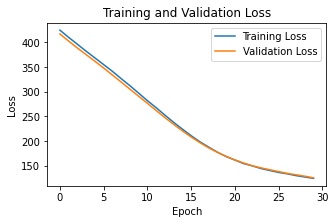

	Layers: 1
        Activation: relu
        Regularisation: l1
        Epochs: 30
        Learning Rate: 0.001
        Test Loss: 141.87216186523438
        Test RMSE: 11.813193321228027





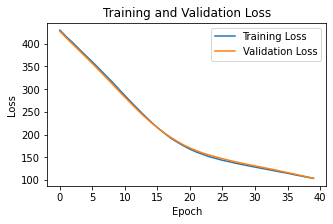

	Layers: 1
        Activation: relu
        Regularisation: l1
        Epochs: 40
        Learning Rate: 0.001
        Test Loss: 118.76911926269531
        Test RMSE: 10.788137435913086





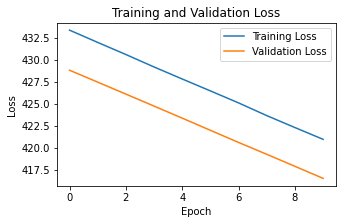

	Layers: 1
        Activation: relu
        Regularisation: l1
        Epochs: 10
        Learning Rate: 0.0001
        Test Loss: 448.9464416503906
        Test RMSE: 21.143991470336914





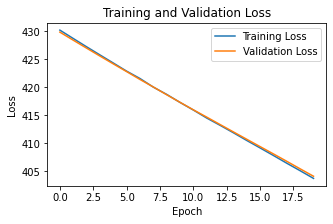

	Layers: 1
        Activation: relu
        Regularisation: l1
        Epochs: 20
        Learning Rate: 0.0001
        Test Loss: 435.4627990722656
        Test RMSE: 20.823684692382812





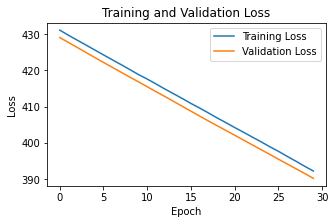

	Layers: 1
        Activation: relu
        Regularisation: l1
        Epochs: 30
        Learning Rate: 0.0001
        Test Loss: 419.7358703613281
        Test RMSE: 20.441749572753906





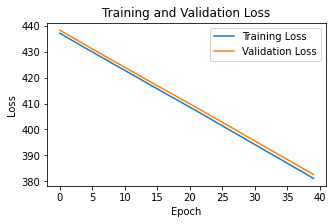

	Layers: 1
        Activation: relu
        Regularisation: l1
        Epochs: 40
        Learning Rate: 0.0001
        Test Loss: 414.1119689941406
        Test RMSE: 20.304216384887695





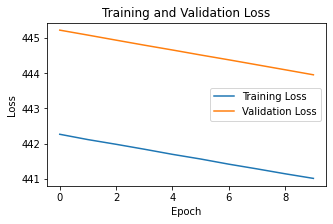

	Layers: 1
        Activation: relu
        Regularisation: l1
        Epochs: 10
        Learning Rate: 1e-05
        Test Loss: 467.6293029785156
        Test RMSE: 21.582454681396484





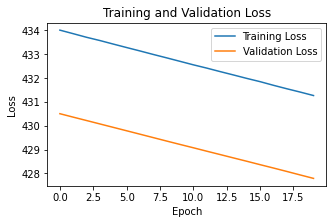

	Layers: 1
        Activation: relu
        Regularisation: l1
        Epochs: 20
        Learning Rate: 1e-05
        Test Loss: 457.3143615722656
        Test RMSE: 21.341995239257812





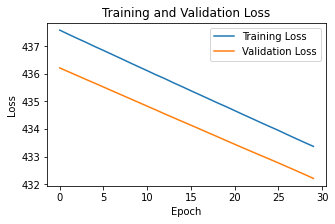

	Layers: 1
        Activation: relu
        Regularisation: l1
        Epochs: 30
        Learning Rate: 1e-05
        Test Loss: 459.1499938964844
        Test RMSE: 21.383955001831055





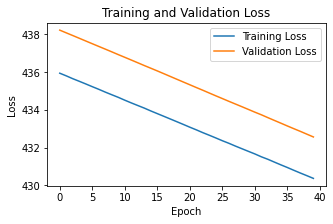

	Layers: 1
        Activation: relu
        Regularisation: l1
        Epochs: 40
        Learning Rate: 1e-05
        Test Loss: 458.73077392578125
        Test RMSE: 21.376192092895508





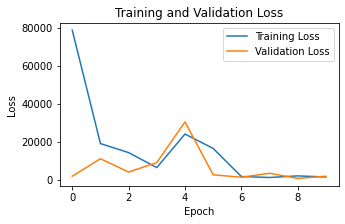

	Layers: 1
        Activation: relu
        Regularisation: l2
        Epochs: 10
        Learning Rate: 1
        Test Loss: 2427.8564453125
        Test RMSE: 48.46287536621094





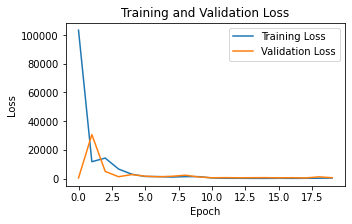

	Layers: 1
        Activation: relu
        Regularisation: l2
        Epochs: 20
        Learning Rate: 1
        Test Loss: 480.0912170410156
        Test RMSE: 21.09271240234375





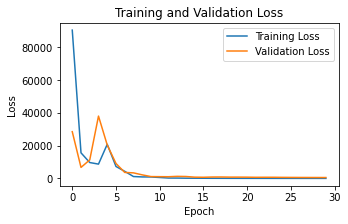

	Layers: 1
        Activation: relu
        Regularisation: l2
        Epochs: 30
        Learning Rate: 1
        Test Loss: 74.52540588378906
        Test RMSE: 6.46708345413208





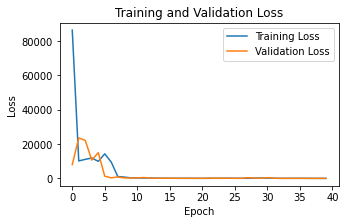

	Layers: 1
        Activation: relu
        Regularisation: l2
        Epochs: 40
        Learning Rate: 1
        Test Loss: 71.66987609863281
        Test RMSE: 5.329090118408203





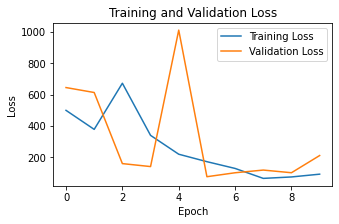

	Layers: 1
        Activation: relu
        Regularisation: l2
        Epochs: 10
        Learning Rate: 0.3
        Test Loss: 189.4746551513672
        Test RMSE: 13.452719688415527





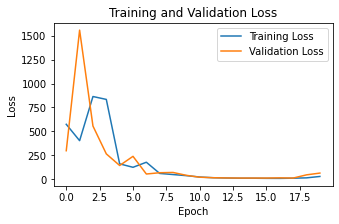

	Layers: 1
        Activation: relu
        Regularisation: l2
        Epochs: 20
        Learning Rate: 0.3
        Test Loss: 31.312889099121094
        Test RMSE: 5.228227615356445





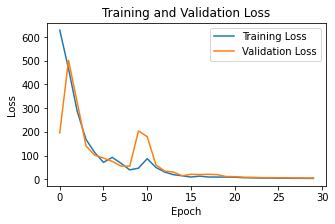

	Layers: 1
        Activation: relu
        Regularisation: l2
        Epochs: 30
        Learning Rate: 0.3
        Test Loss: 4.911800384521484
        Test RMSE: 1.4692074060440063





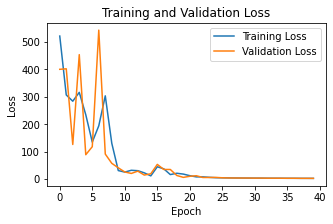

	Layers: 1
        Activation: relu
        Regularisation: l2
        Epochs: 40
        Learning Rate: 0.3
        Test Loss: 3.053335189819336
        Test RMSE: 1.2161448001861572





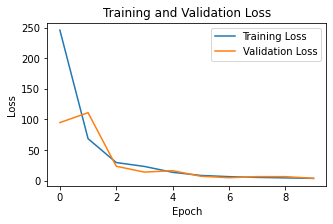

	Layers: 1
        Activation: relu
        Regularisation: l2
        Epochs: 10
        Learning Rate: 0.1
        Test Loss: 3.6922342777252197
        Test RMSE: 1.3393276929855347





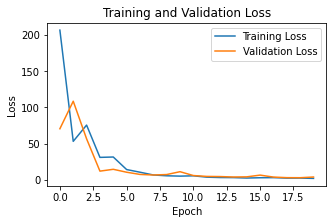

	Layers: 1
        Activation: relu
        Regularisation: l2
        Epochs: 20
        Learning Rate: 0.1
        Test Loss: 3.2576072216033936
        Test RMSE: 1.469303011894226





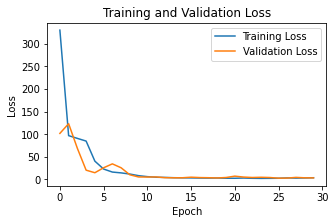

	Layers: 1
        Activation: relu
        Regularisation: l2
        Epochs: 30
        Learning Rate: 0.1
        Test Loss: 2.3962197303771973
        Test RMSE: 1.118283987045288





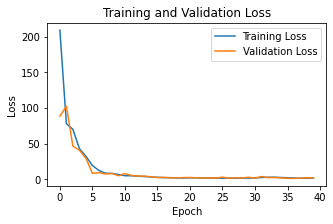

	Layers: 1
        Activation: relu
        Regularisation: l2
        Epochs: 40
        Learning Rate: 0.1
        Test Loss: 2.661503791809082
        Test RMSE: 1.4341208934783936





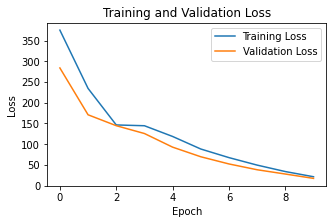

	Layers: 1
        Activation: relu
        Regularisation: l2
        Epochs: 10
        Learning Rate: 0.01
        Test Loss: 20.27239418029785
        Test RMSE: 4.429157733917236





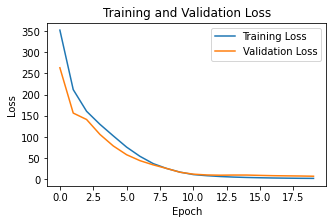

	Layers: 1
        Activation: relu
        Regularisation: l2
        Epochs: 20
        Learning Rate: 0.01
        Test Loss: 3.4944405555725098
        Test RMSE: 1.7056896686553955





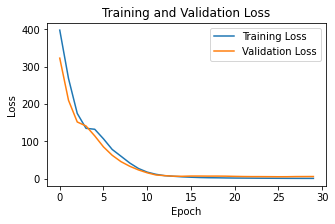

	Layers: 1
        Activation: relu
        Regularisation: l2
        Epochs: 30
        Learning Rate: 0.01
        Test Loss: 2.838214159011841
        Test RMSE: 1.516863465309143





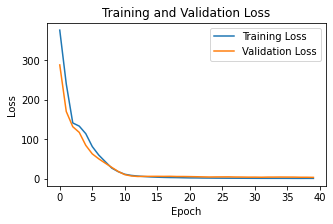

	Layers: 1
        Activation: relu
        Regularisation: l2
        Epochs: 40
        Learning Rate: 0.01
        Test Loss: 2.4509520530700684
        Test RMSE: 1.4068949222564697





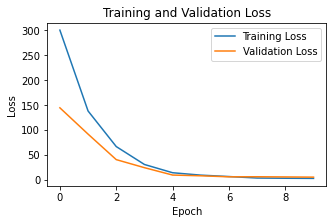

	Layers: 1
        Activation: relu
        Regularisation: l2
        Epochs: 10
        Learning Rate: 0.03
        Test Loss: 4.2649688720703125
        Test RMSE: 1.863097906112671





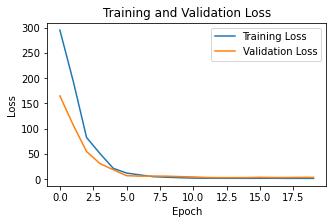

	Layers: 1
        Activation: relu
        Regularisation: l2
        Epochs: 20
        Learning Rate: 0.03
        Test Loss: 2.201392412185669
        Test RMSE: 1.2470203638076782





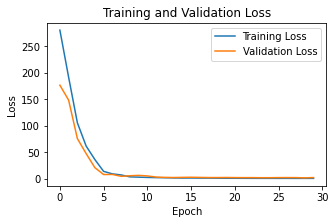

	Layers: 1
        Activation: relu
        Regularisation: l2
        Epochs: 30
        Learning Rate: 0.03
        Test Loss: 1.9176515340805054
        Test RMSE: 1.1495102643966675





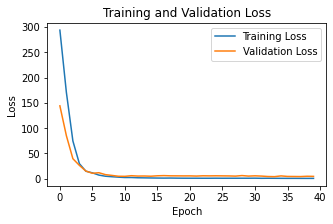

	Layers: 1
        Activation: relu
        Regularisation: l2
        Epochs: 40
        Learning Rate: 0.03
        Test Loss: 1.483280062675476
        Test RMSE: 1.0160151720046997





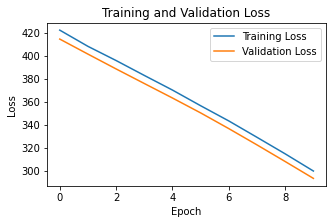

	Layers: 1
        Activation: relu
        Regularisation: l2
        Epochs: 10
        Learning Rate: 0.001
        Test Loss: 326.9212951660156
        Test RMSE: 18.07269859313965





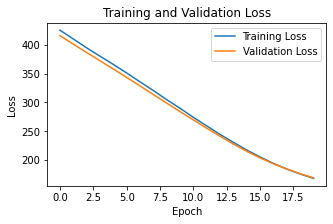

	Layers: 1
        Activation: relu
        Regularisation: l2
        Epochs: 20
        Learning Rate: 0.001
        Test Loss: 192.49996948242188
        Test RMSE: 13.860495567321777





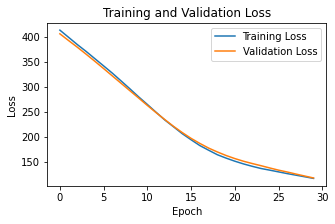

	Layers: 1
        Activation: relu
        Regularisation: l2
        Epochs: 30
        Learning Rate: 0.001
        Test Loss: 132.8155975341797
        Test RMSE: 11.503557205200195





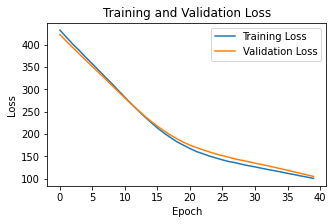

	Layers: 1
        Activation: relu
        Regularisation: l2
        Epochs: 40
        Learning Rate: 0.001
        Test Loss: 116.00257110595703
        Test RMSE: 10.747700691223145





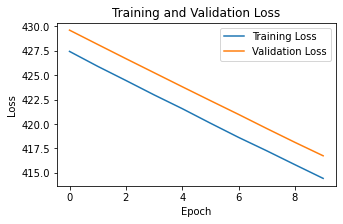

	Layers: 1
        Activation: relu
        Regularisation: l2
        Epochs: 10
        Learning Rate: 0.0001
        Test Loss: 444.01202392578125
        Test RMSE: 21.06572723388672





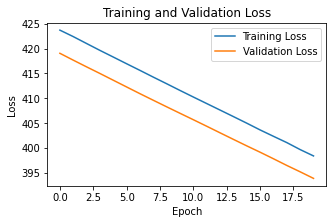

	Layers: 1
        Activation: relu
        Regularisation: l2
        Epochs: 20
        Learning Rate: 0.0001
        Test Loss: 423.25030517578125
        Test RMSE: 20.566938400268555





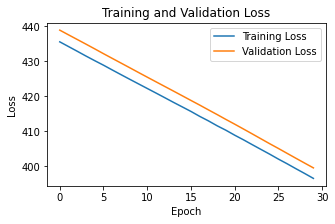

	Layers: 1
        Activation: relu
        Regularisation: l2
        Epochs: 30
        Learning Rate: 0.0001
        Test Loss: 423.1813659667969
        Test RMSE: 20.56509780883789





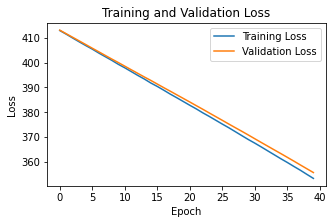

	Layers: 1
        Activation: relu
        Regularisation: l2
        Epochs: 40
        Learning Rate: 0.0001
        Test Loss: 385.2386169433594
        Test RMSE: 19.62108039855957





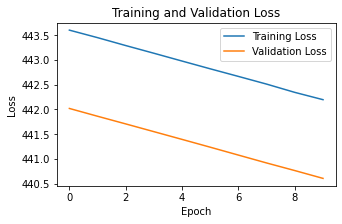

	Layers: 1
        Activation: relu
        Regularisation: l2
        Epochs: 10
        Learning Rate: 1e-05
        Test Loss: 468.9737854003906
        Test RMSE: 21.650047302246094





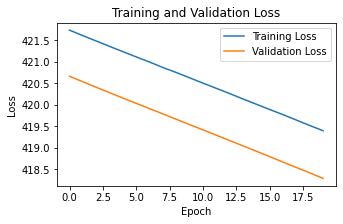

	Layers: 1
        Activation: relu
        Regularisation: l2
        Epochs: 20
        Learning Rate: 1e-05
        Test Loss: 447.2308349609375
        Test RMSE: 21.1419677734375





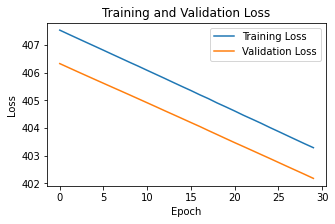

	Layers: 1
        Activation: relu
        Regularisation: l2
        Epochs: 30
        Learning Rate: 1e-05
        Test Loss: 431.9572448730469
        Test RMSE: 20.77743148803711





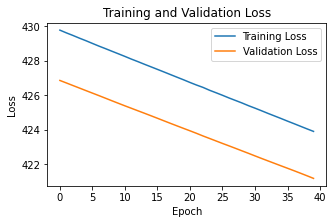

	Layers: 1
        Activation: relu
        Regularisation: l2
        Epochs: 40
        Learning Rate: 1e-05
        Test Loss: 449.9884338378906
        Test RMSE: 21.20687484741211





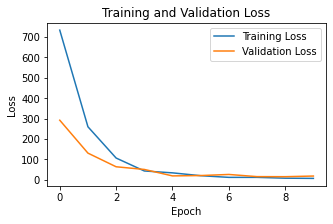

	Layers: 1
        Activation: sigmoid
        Regularisation: None
        Epochs: 10
        Learning Rate: 1
        Test Loss: 12.520520210266113
        Test RMSE: 3.5384347438812256





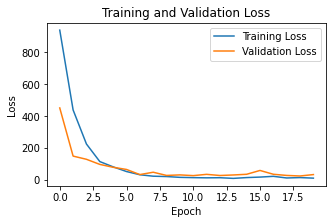

	Layers: 1
        Activation: sigmoid
        Regularisation: None
        Epochs: 20
        Learning Rate: 1
        Test Loss: 14.2236909866333
        Test RMSE: 3.7714309692382812





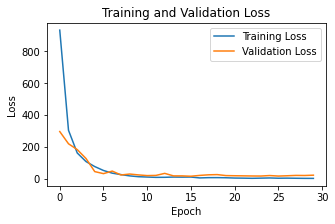

	Layers: 1
        Activation: sigmoid
        Regularisation: None
        Epochs: 30
        Learning Rate: 1
        Test Loss: 19.13286590576172
        Test RMSE: 4.374113082885742





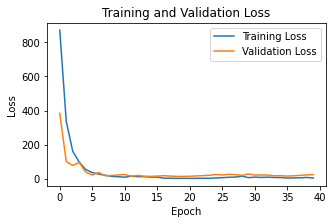

	Layers: 1
        Activation: sigmoid
        Regularisation: None
        Epochs: 40
        Learning Rate: 1
        Test Loss: 15.894465446472168
        Test RMSE: 3.986786365509033





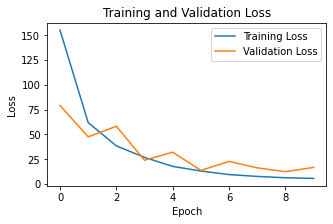

	Layers: 1
        Activation: sigmoid
        Regularisation: None
        Epochs: 10
        Learning Rate: 0.3
        Test Loss: 9.673412322998047
        Test RMSE: 3.11021089553833





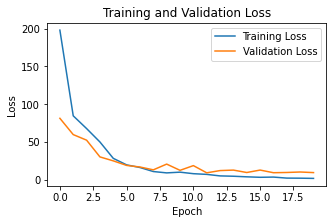

	Layers: 1
        Activation: sigmoid
        Regularisation: None
        Epochs: 20
        Learning Rate: 0.3
        Test Loss: 5.828612327575684
        Test RMSE: 2.4142518043518066





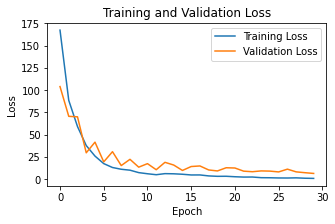

	Layers: 1
        Activation: sigmoid
        Regularisation: None
        Epochs: 30
        Learning Rate: 0.3
        Test Loss: 6.000291347503662
        Test RMSE: 2.4495491981506348





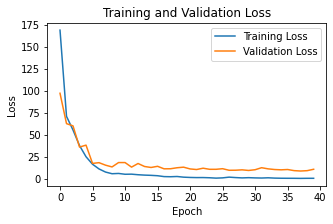

	Layers: 1
        Activation: sigmoid
        Regularisation: None
        Epochs: 40
        Learning Rate: 0.3
        Test Loss: 7.812348365783691
        Test RMSE: 2.795057773590088





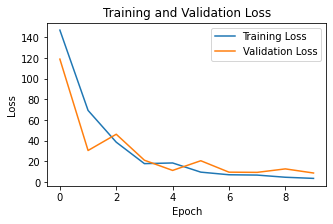

	Layers: 1
        Activation: sigmoid
        Regularisation: None
        Epochs: 10
        Learning Rate: 0.1
        Test Loss: 3.7807042598724365
        Test RMSE: 1.9444032907485962





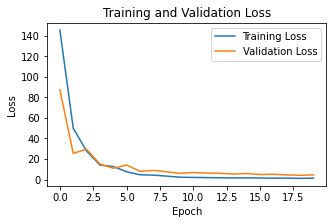

	Layers: 1
        Activation: sigmoid
        Regularisation: None
        Epochs: 20
        Learning Rate: 0.1
        Test Loss: 2.1558115482330322
        Test RMSE: 1.4682681560516357





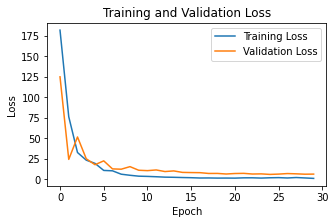

	Layers: 1
        Activation: sigmoid
        Regularisation: None
        Epochs: 30
        Learning Rate: 0.1
        Test Loss: 3.674931526184082
        Test RMSE: 1.9170111417770386





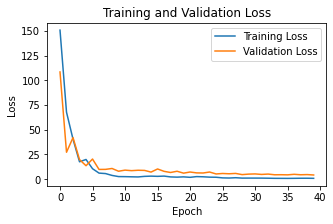

	Layers: 1
        Activation: sigmoid
        Regularisation: None
        Epochs: 40
        Learning Rate: 0.1
        Test Loss: 2.518063545227051
        Test RMSE: 1.5868407487869263





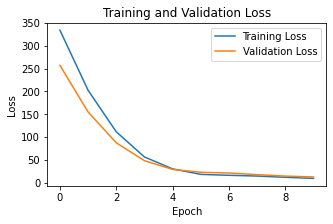

	Layers: 1
        Activation: sigmoid
        Regularisation: None
        Epochs: 10
        Learning Rate: 0.01
        Test Loss: 5.992076873779297
        Test RMSE: 2.4478719234466553





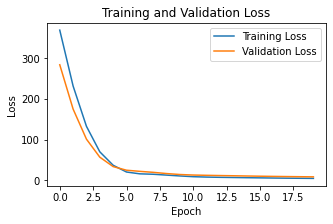

	Layers: 1
        Activation: sigmoid
        Regularisation: None
        Epochs: 20
        Learning Rate: 0.01
        Test Loss: 2.677428960800171
        Test RMSE: 1.6362850666046143





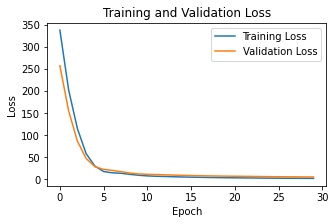

	Layers: 1
        Activation: sigmoid
        Regularisation: None
        Epochs: 30
        Learning Rate: 0.01
        Test Loss: 1.7660404443740845
        Test RMSE: 1.328924536705017





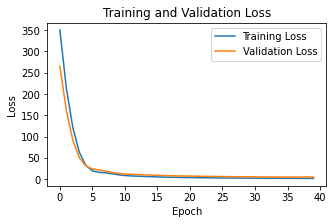

	Layers: 1
        Activation: sigmoid
        Regularisation: None
        Epochs: 40
        Learning Rate: 0.01
        Test Loss: 1.3417831659317017
        Test RMSE: 1.1583536863327026





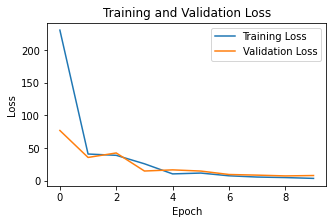

	Layers: 1
        Activation: sigmoid
        Regularisation: None
        Epochs: 10
        Learning Rate: 0.03
        Test Loss: 2.7490553855895996
        Test RMSE: 1.6580275297164917





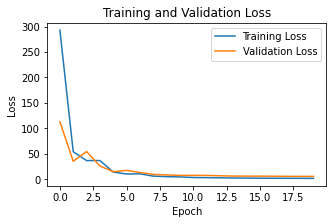

	Layers: 1
        Activation: sigmoid
        Regularisation: None
        Epochs: 20
        Learning Rate: 0.03
        Test Loss: 1.3588640689849854
        Test RMSE: 1.165703296661377





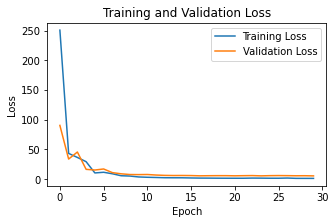

	Layers: 1
        Activation: sigmoid
        Regularisation: None
        Epochs: 30
        Learning Rate: 0.03
        Test Loss: 1.3292063474655151
        Test RMSE: 1.1529121398925781





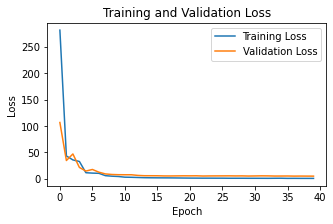

	Layers: 1
        Activation: sigmoid
        Regularisation: None
        Epochs: 40
        Learning Rate: 0.03
        Test Loss: 1.196168065071106
        Test RMSE: 1.0936946868896484





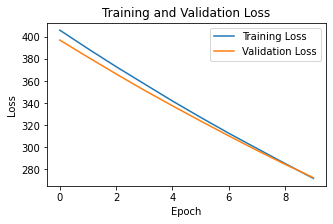

	Layers: 1
        Activation: sigmoid
        Regularisation: None
        Epochs: 10
        Learning Rate: 0.001
        Test Loss: 290.5828552246094
        Test RMSE: 17.046491622924805





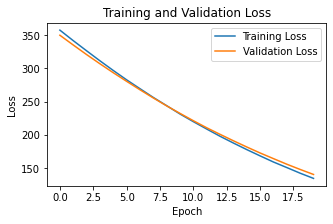

	Layers: 1
        Activation: sigmoid
        Regularisation: None
        Epochs: 20
        Learning Rate: 0.001
        Test Loss: 151.29664611816406
        Test RMSE: 12.300270080566406





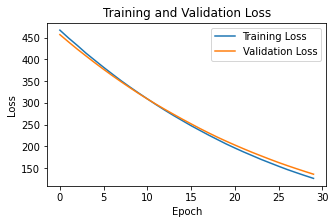

	Layers: 1
        Activation: sigmoid
        Regularisation: None
        Epochs: 30
        Learning Rate: 0.001
        Test Loss: 143.43833923339844
        Test RMSE: 11.976574897766113





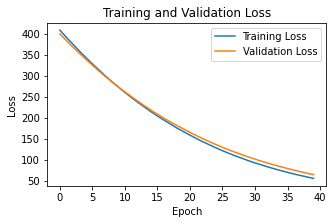

	Layers: 1
        Activation: sigmoid
        Regularisation: None
        Epochs: 40
        Learning Rate: 0.001
        Test Loss: 66.35521697998047
        Test RMSE: 8.14587116241455





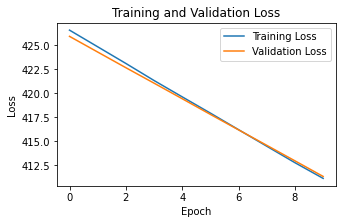

	Layers: 1
        Activation: sigmoid
        Regularisation: None
        Epochs: 10
        Learning Rate: 0.0001
        Test Loss: 436.59991455078125
        Test RMSE: 20.894973754882812





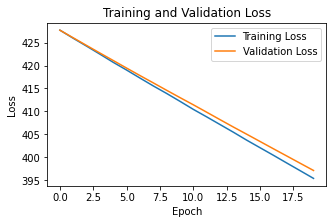

	Layers: 1
        Activation: sigmoid
        Regularisation: None
        Epochs: 20
        Learning Rate: 0.0001
        Test Loss: 420.375
        Test RMSE: 20.503047943115234





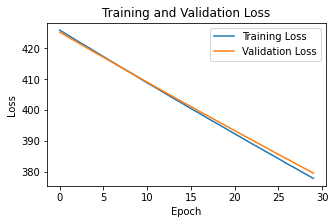

	Layers: 1
        Activation: sigmoid
        Regularisation: None
        Epochs: 30
        Learning Rate: 0.0001
        Test Loss: 403.5632629394531
        Test RMSE: 20.088884353637695





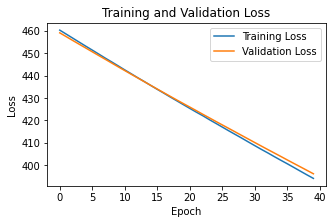

	Layers: 1
        Activation: sigmoid
        Regularisation: None
        Epochs: 40
        Learning Rate: 0.0001
        Test Loss: 421.3077697753906
        Test RMSE: 20.52578353881836





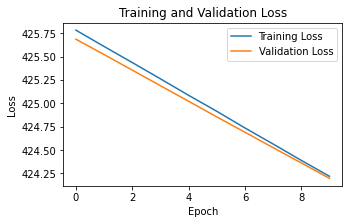

	Layers: 1
        Activation: sigmoid
        Regularisation: None
        Epochs: 10
        Learning Rate: 1e-05
        Test Loss: 451.1175537109375
        Test RMSE: 21.23952865600586





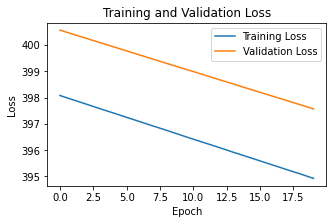

	Layers: 1
        Activation: sigmoid
        Regularisation: None
        Epochs: 20
        Learning Rate: 1e-05
        Test Loss: 420.880126953125
        Test RMSE: 20.515363693237305





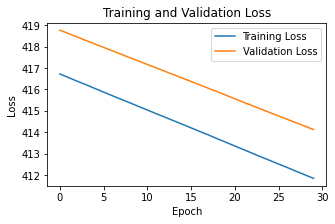

	Layers: 1
        Activation: sigmoid
        Regularisation: None
        Epochs: 30
        Learning Rate: 1e-05
        Test Loss: 438.404052734375
        Test RMSE: 20.938100814819336





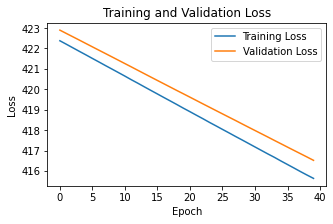

	Layers: 1
        Activation: sigmoid
        Regularisation: None
        Epochs: 40
        Learning Rate: 1e-05
        Test Loss: 441.1299743652344
        Test RMSE: 21.003093719482422





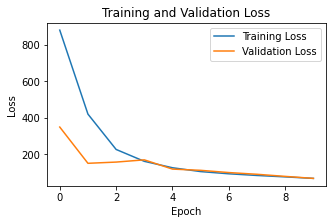

	Layers: 1
        Activation: sigmoid
        Regularisation: l1
        Epochs: 10
        Learning Rate: 1
        Test Loss: 77.33228302001953
        Test RMSE: 4.80330753326416





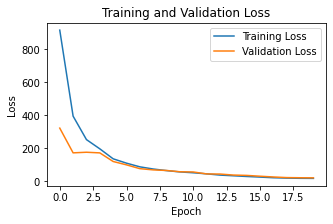

	Layers: 1
        Activation: sigmoid
        Regularisation: l1
        Epochs: 20
        Learning Rate: 1
        Test Loss: 18.469934463500977
        Test RMSE: 2.465407609939575





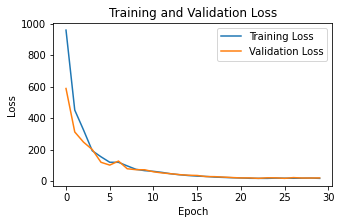

	Layers: 1
        Activation: sigmoid
        Regularisation: l1
        Epochs: 30
        Learning Rate: 1
        Test Loss: 15.058642387390137
        Test RMSE: 1.575569987297058





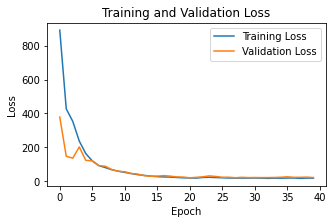

	Layers: 1
        Activation: sigmoid
        Regularisation: l1
        Epochs: 40
        Learning Rate: 1
        Test Loss: 17.2921085357666
        Test RMSE: 2.258781909942627





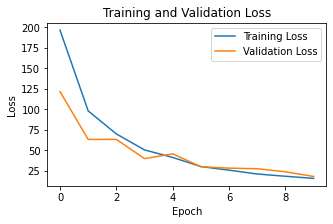

	Layers: 1
        Activation: sigmoid
        Regularisation: l1
        Epochs: 10
        Learning Rate: 0.3
        Test Loss: 16.360986709594727
        Test RMSE: 2.576247215270996





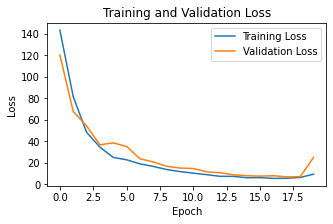

	Layers: 1
        Activation: sigmoid
        Regularisation: l1
        Epochs: 20
        Learning Rate: 0.3
        Test Loss: 21.065467834472656
        Test RMSE: 4.149761199951172





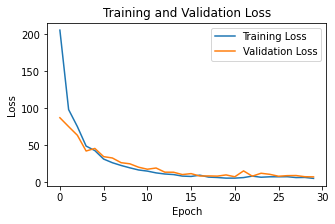

	Layers: 1
        Activation: sigmoid
        Regularisation: l1
        Epochs: 30
        Learning Rate: 0.3
        Test Loss: 5.292881488800049
        Test RMSE: 1.3804001808166504





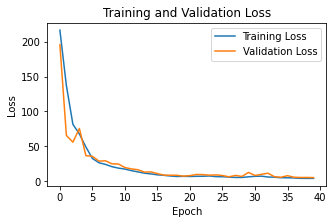

	Layers: 1
        Activation: sigmoid
        Regularisation: l1
        Epochs: 40
        Learning Rate: 0.3
        Test Loss: 4.388484477996826
        Test RMSE: 1.4931453466415405





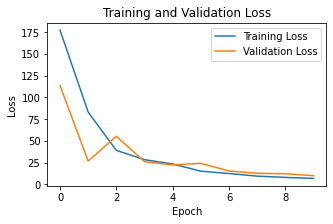

	Layers: 1
        Activation: sigmoid
        Regularisation: l1
        Epochs: 10
        Learning Rate: 0.1
        Test Loss: 6.275317668914795
        Test RMSE: 1.5797487497329712





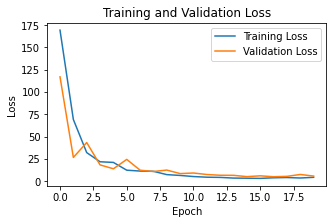

	Layers: 1
        Activation: sigmoid
        Regularisation: l1
        Epochs: 20
        Learning Rate: 0.1
        Test Loss: 4.397294044494629
        Test RMSE: 1.6715073585510254





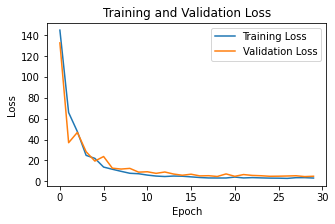

	Layers: 1
        Activation: sigmoid
        Regularisation: l1
        Epochs: 30
        Learning Rate: 0.1
        Test Loss: 3.8617942333221436
        Test RMSE: 1.5739963054656982





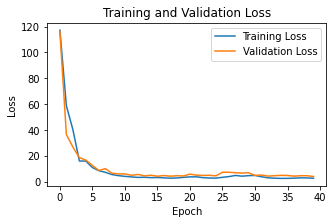

	Layers: 1
        Activation: sigmoid
        Regularisation: l1
        Epochs: 40
        Learning Rate: 0.1
        Test Loss: 3.145601272583008
        Test RMSE: 1.3628038167953491





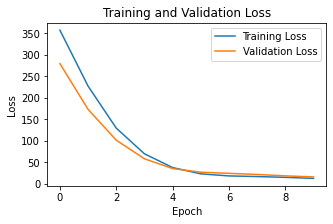

	Layers: 1
        Activation: sigmoid
        Regularisation: l1
        Epochs: 10
        Learning Rate: 0.01
        Test Loss: 8.907914161682129
        Test RMSE: 2.4935457706451416





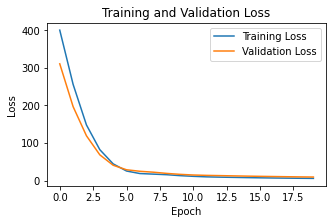

	Layers: 1
        Activation: sigmoid
        Regularisation: l1
        Epochs: 20
        Learning Rate: 0.01
        Test Loss: 4.690396308898926
        Test RMSE: 1.6448800563812256





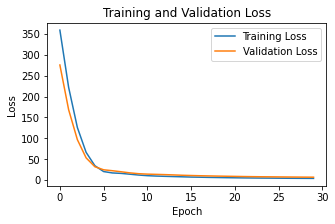

	Layers: 1
        Activation: sigmoid
        Regularisation: l1
        Epochs: 30
        Learning Rate: 0.01
        Test Loss: 3.0243659019470215
        Test RMSE: 1.2665469646453857





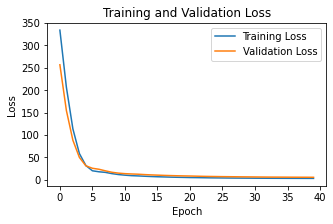

	Layers: 1
        Activation: sigmoid
        Regularisation: l1
        Epochs: 40
        Learning Rate: 0.01
        Test Loss: 2.521123170852661
        Test RMSE: 1.1224300861358643





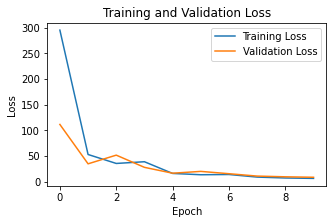

	Layers: 1
        Activation: sigmoid
        Regularisation: l1
        Epochs: 10
        Learning Rate: 0.03
        Test Loss: 4.242661952972412
        Test RMSE: 1.3036595582962036





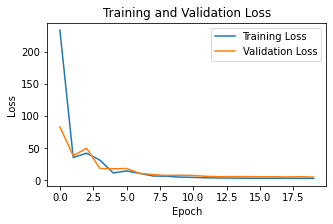

	Layers: 1
        Activation: sigmoid
        Regularisation: l1
        Epochs: 20
        Learning Rate: 0.03
        Test Loss: 2.631631851196289
        Test RMSE: 1.1508492231369019





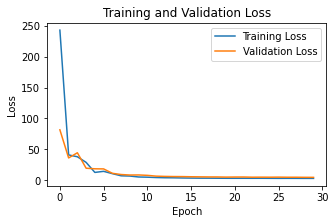

	Layers: 1
        Activation: sigmoid
        Regularisation: l1
        Epochs: 30
        Learning Rate: 0.03
        Test Loss: 2.3225557804107666
        Test RMSE: 1.0375577211380005





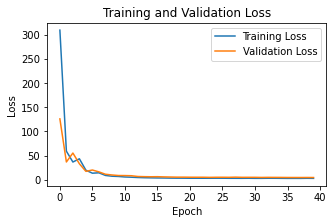

	Layers: 1
        Activation: sigmoid
        Regularisation: l1
        Epochs: 40
        Learning Rate: 0.03
        Test Loss: 2.2803754806518555
        Test RMSE: 1.0276962518692017





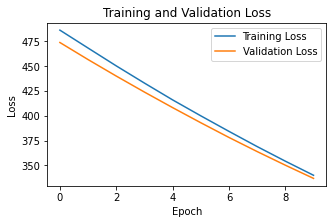

	Layers: 1
        Activation: sigmoid
        Regularisation: l1
        Epochs: 10
        Learning Rate: 0.001
        Test Loss: 359.9695739746094
        Test RMSE: 18.92445182800293





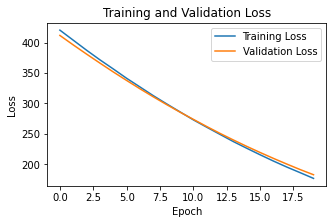

	Layers: 1
        Activation: sigmoid
        Regularisation: l1
        Epochs: 20
        Learning Rate: 0.001
        Test Loss: 194.79541015625
        Test RMSE: 13.887516975402832





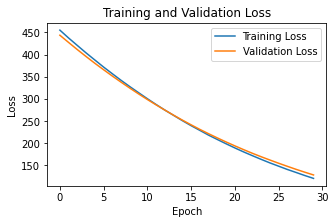

	Layers: 1
        Activation: sigmoid
        Regularisation: l1
        Epochs: 30
        Learning Rate: 0.001
        Test Loss: 137.07620239257812
        Test RMSE: 11.623025894165039





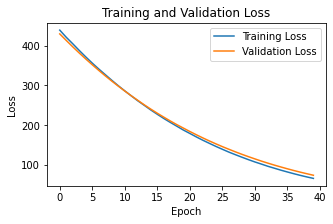

	Layers: 1
        Activation: sigmoid
        Regularisation: l1
        Epochs: 40
        Learning Rate: 0.001
        Test Loss: 77.72919464111328
        Test RMSE: 8.701216697692871





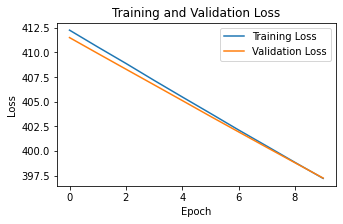

	Layers: 1
        Activation: sigmoid
        Regularisation: l1
        Epochs: 10
        Learning Rate: 0.0001
        Test Loss: 423.40240478515625
        Test RMSE: 20.531530380249023





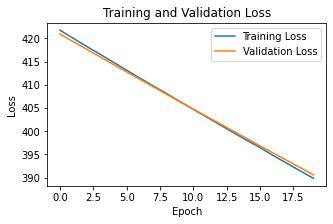

	Layers: 1
        Activation: sigmoid
        Regularisation: l1
        Epochs: 20
        Learning Rate: 0.0001
        Test Loss: 416.1579895019531
        Test RMSE: 20.354961395263672





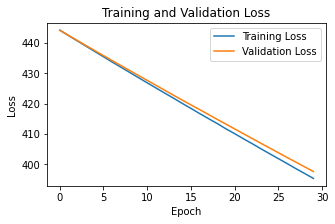

	Layers: 1
        Activation: sigmoid
        Regularisation: l1
        Epochs: 30
        Learning Rate: 0.0001
        Test Loss: 421.7818603515625
        Test RMSE: 20.492076873779297





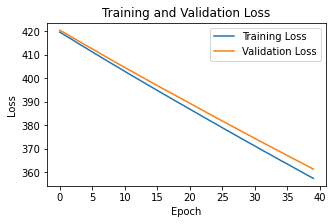

	Layers: 1
        Activation: sigmoid
        Regularisation: l1
        Epochs: 40
        Learning Rate: 0.0001
        Test Loss: 384.82232666015625
        Test RMSE: 19.570554733276367





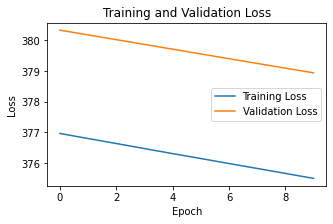

	Layers: 1
        Activation: sigmoid
        Regularisation: l1
        Epochs: 10
        Learning Rate: 1e-05
        Test Loss: 400.190185546875
        Test RMSE: 19.959096908569336





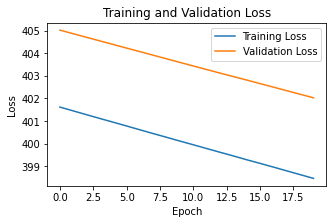

	Layers: 1
        Activation: sigmoid
        Regularisation: l1
        Epochs: 20
        Learning Rate: 1e-05
        Test Loss: 425.1835021972656
        Test RMSE: 20.575454711914062





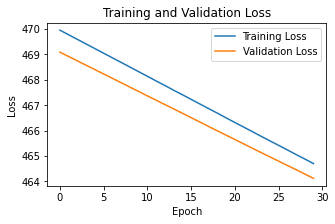

	Layers: 1
        Activation: sigmoid
        Regularisation: l1
        Epochs: 30
        Learning Rate: 1e-05
        Test Loss: 492.9634704589844
        Test RMSE: 22.161224365234375





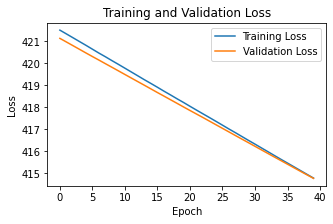

	Layers: 1
        Activation: sigmoid
        Regularisation: l1
        Epochs: 40
        Learning Rate: 1e-05
        Test Loss: 442.02313232421875
        Test RMSE: 20.980714797973633





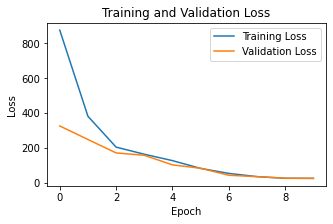

	Layers: 1
        Activation: sigmoid
        Regularisation: l2
        Epochs: 10
        Learning Rate: 1
        Test Loss: 20.930282592773438
        Test RMSE: 2.3059139251708984





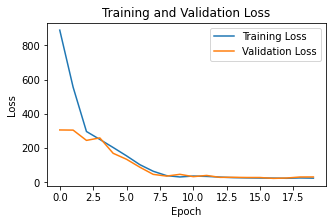

	Layers: 1
        Activation: sigmoid
        Regularisation: l2
        Epochs: 20
        Learning Rate: 1
        Test Loss: 29.788917541503906
        Test RMSE: 3.8068339824676514





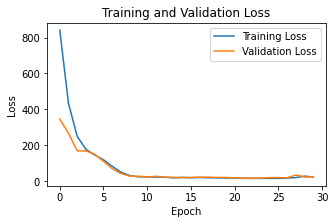

	Layers: 1
        Activation: sigmoid
        Regularisation: l2
        Epochs: 30
        Learning Rate: 1
        Test Loss: 19.504541397094727
        Test RMSE: 2.541327476501465





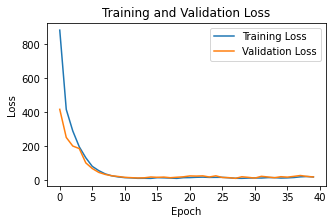

	Layers: 1
        Activation: sigmoid
        Regularisation: l2
        Epochs: 40
        Learning Rate: 1
        Test Loss: 16.279006958007812
        Test RMSE: 2.099644184112549





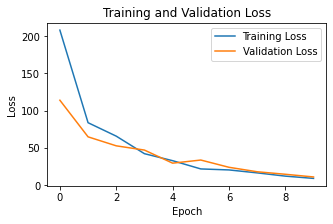

	Layers: 1
        Activation: sigmoid
        Regularisation: l2
        Epochs: 10
        Learning Rate: 0.3
        Test Loss: 6.88925313949585
        Test RMSE: 1.545372724533081





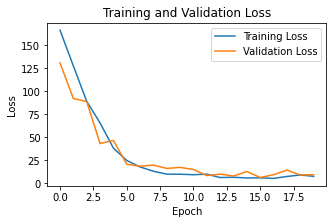

	Layers: 1
        Activation: sigmoid
        Regularisation: l2
        Epochs: 20
        Learning Rate: 0.3
        Test Loss: 7.306336402893066
        Test RMSE: 2.0832836627960205





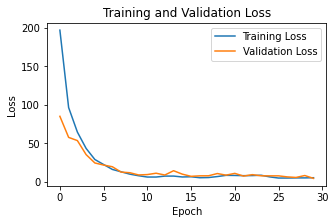

	Layers: 1
        Activation: sigmoid
        Regularisation: l2
        Epochs: 30
        Learning Rate: 0.3
        Test Loss: 4.012677192687988
        Test RMSE: 1.5273900032043457





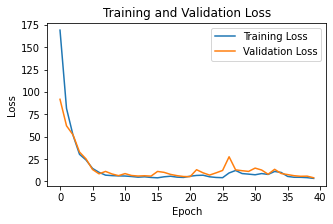

	Layers: 1
        Activation: sigmoid
        Regularisation: l2
        Epochs: 40
        Learning Rate: 0.3
        Test Loss: 3.142289638519287
        Test RMSE: 1.2207810878753662





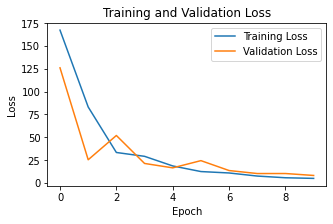

	Layers: 1
        Activation: sigmoid
        Regularisation: l2
        Epochs: 10
        Learning Rate: 0.1
        Test Loss: 3.9372634887695312
        Test RMSE: 1.3073467016220093





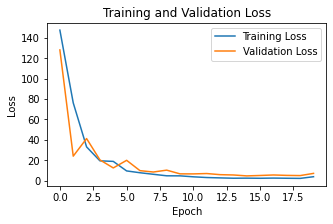

	Layers: 1
        Activation: sigmoid
        Regularisation: l2
        Epochs: 20
        Learning Rate: 0.1
        Test Loss: 6.188056468963623
        Test RMSE: 2.2795658111572266





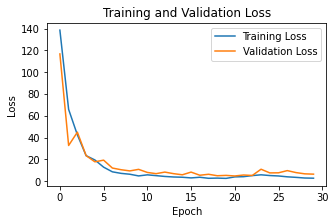

	Layers: 1
        Activation: sigmoid
        Regularisation: l2
        Epochs: 30
        Learning Rate: 0.1
        Test Loss: 2.937790632247925
        Test RMSE: 1.3518577814102173





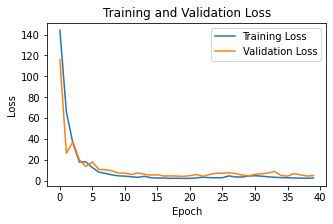

	Layers: 1
        Activation: sigmoid
        Regularisation: l2
        Epochs: 40
        Learning Rate: 0.1
        Test Loss: 2.1796934604644775
        Test RMSE: 1.1300925016403198





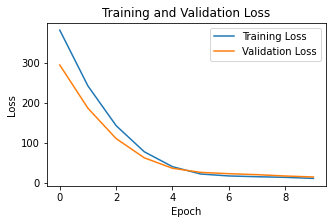

	Layers: 1
        Activation: sigmoid
        Regularisation: l2
        Epochs: 10
        Learning Rate: 0.01
        Test Loss: 7.548247337341309
        Test RMSE: 2.6044929027557373





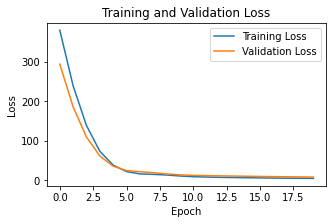

	Layers: 1
        Activation: sigmoid
        Regularisation: l2
        Epochs: 20
        Learning Rate: 0.01
        Test Loss: 3.5424764156341553
        Test RMSE: 1.6384865045547485





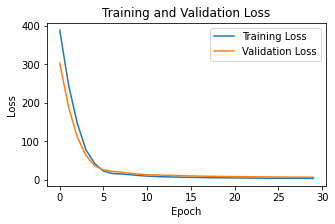

	Layers: 1
        Activation: sigmoid
        Regularisation: l2
        Epochs: 30
        Learning Rate: 0.01
        Test Loss: 2.649463176727295
        Test RMSE: 1.3043639659881592





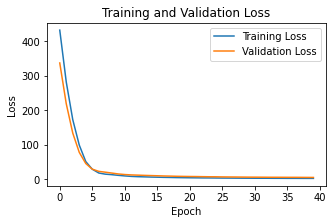

	Layers: 1
        Activation: sigmoid
        Regularisation: l2
        Epochs: 40
        Learning Rate: 0.01
        Test Loss: 2.347360610961914
        Test RMSE: 1.1723248958587646





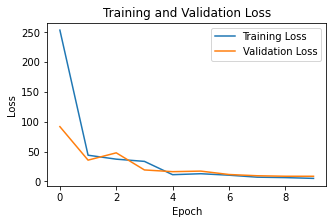

	Layers: 1
        Activation: sigmoid
        Regularisation: l2
        Epochs: 10
        Learning Rate: 0.03
        Test Loss: 3.609628438949585
        Test RMSE: 1.5099250078201294





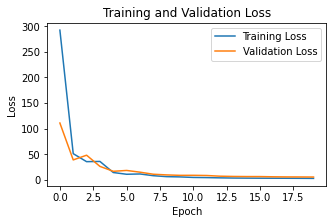

	Layers: 1
        Activation: sigmoid
        Regularisation: l2
        Epochs: 20
        Learning Rate: 0.03
        Test Loss: 2.3181748390197754
        Test RMSE: 1.123457670211792





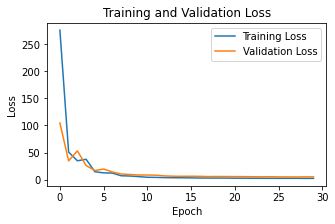

	Layers: 1
        Activation: sigmoid
        Regularisation: l2
        Epochs: 30
        Learning Rate: 0.03
        Test Loss: 2.0910301208496094
        Test RMSE: 1.0544953346252441





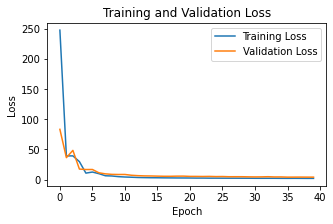

	Layers: 1
        Activation: sigmoid
        Regularisation: l2
        Epochs: 40
        Learning Rate: 0.03
        Test Loss: 2.303040027618408
        Test RMSE: 1.1665037870407104





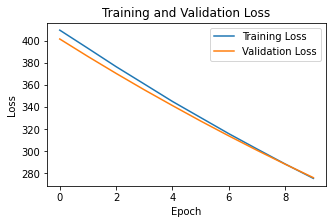

	Layers: 1
        Activation: sigmoid
        Regularisation: l2
        Epochs: 10
        Learning Rate: 0.001
        Test Loss: 294.1817932128906
        Test RMSE: 17.1438045501709





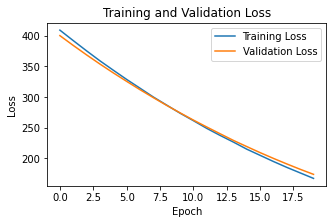

	Layers: 1
        Activation: sigmoid
        Regularisation: l2
        Epochs: 20
        Learning Rate: 0.001
        Test Loss: 185.7882843017578
        Test RMSE: 13.618693351745605





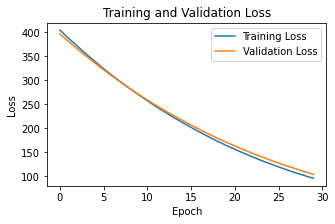

	Layers: 1
        Activation: sigmoid
        Regularisation: l2
        Epochs: 30
        Learning Rate: 0.001
        Test Loss: 110.1928939819336
        Test RMSE: 10.480667114257812





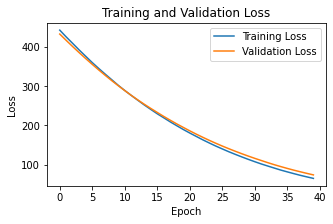

	Layers: 1
        Activation: sigmoid
        Regularisation: l2
        Epochs: 40
        Learning Rate: 0.001
        Test Loss: 76.80198669433594
        Test RMSE: 8.741822242736816





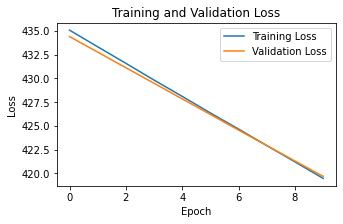

	Layers: 1
        Activation: sigmoid
        Regularisation: l2
        Epochs: 10
        Learning Rate: 0.0001
        Test Loss: 444.676513671875
        Test RMSE: 21.08130645751953





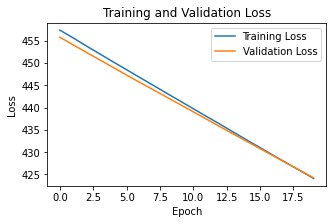

	Layers: 1
        Activation: sigmoid
        Regularisation: l2
        Epochs: 20
        Learning Rate: 0.0001
        Test Loss: 451.0887756347656
        Test RMSE: 21.232877731323242





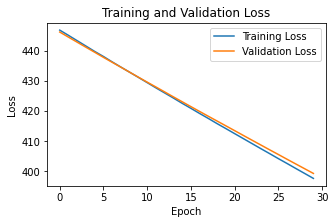

	Layers: 1
        Activation: sigmoid
        Regularisation: l2
        Epochs: 30
        Learning Rate: 0.0001
        Test Loss: 424.8916931152344
        Test RMSE: 20.60680389404297





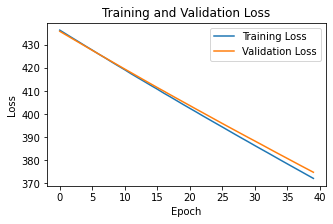

	Layers: 1
        Activation: sigmoid
        Regularisation: l2
        Epochs: 40
        Learning Rate: 0.0001
        Test Loss: 398.5549011230469
        Test RMSE: 19.9576473236084





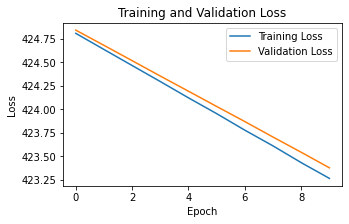

	Layers: 1
        Activation: sigmoid
        Regularisation: l2
        Epochs: 10
        Learning Rate: 1e-05
        Test Loss: 450.2188415527344
        Test RMSE: 21.21233367919922





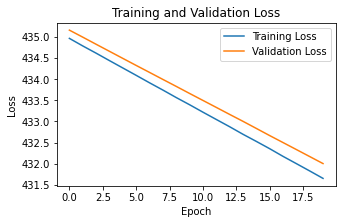

	Layers: 1
        Activation: sigmoid
        Regularisation: l2
        Epochs: 20
        Learning Rate: 1e-05
        Test Loss: 458.4368896484375
        Test RMSE: 21.405292510986328





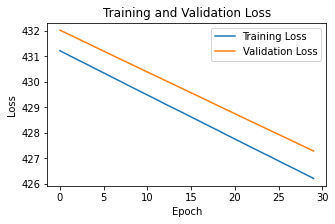

	Layers: 1
        Activation: sigmoid
        Regularisation: l2
        Epochs: 30
        Learning Rate: 1e-05
        Test Loss: 453.7294006347656
        Test RMSE: 21.295154571533203





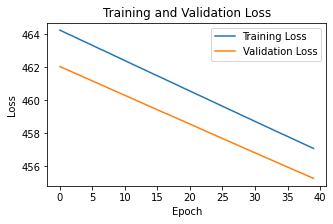

	Layers: 1
        Activation: sigmoid
        Regularisation: l2
        Epochs: 40
        Learning Rate: 1e-05
        Test Loss: 484.13763427734375
        Test RMSE: 21.997432708740234





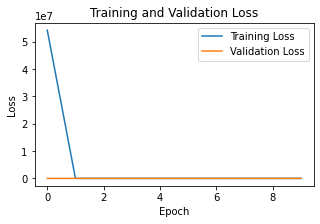

	Layers: 2
        Activation: relu
        Regularisation: None
        Epochs: 10
        Learning Rate: 1
        Test Loss: 642.6614379882812
        Test RMSE: 25.350767135620117





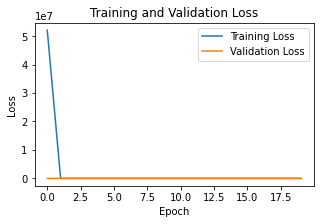

	Layers: 2
        Activation: relu
        Regularisation: None
        Epochs: 20
        Learning Rate: 1
        Test Loss: 599.0769653320312
        Test RMSE: 24.476049423217773





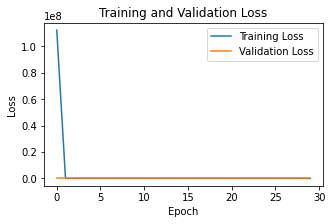

	Layers: 2
        Activation: relu
        Regularisation: None
        Epochs: 30
        Learning Rate: 1
        Test Loss: 564.0728759765625
        Test RMSE: 23.750219345092773





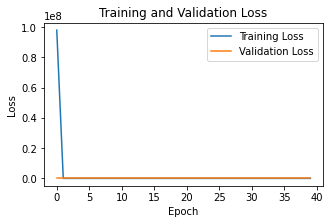

	Layers: 2
        Activation: relu
        Regularisation: None
        Epochs: 40
        Learning Rate: 1
        Test Loss: 536.320556640625
        Test RMSE: 23.15859603881836





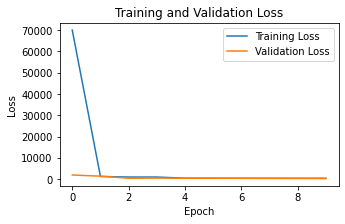

	Layers: 2
        Activation: relu
        Regularisation: None
        Epochs: 10
        Learning Rate: 0.3
        Test Loss: 386.9169006347656
        Test RMSE: 19.670204162597656





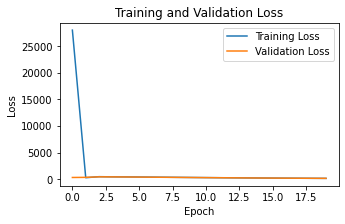

	Layers: 2
        Activation: relu
        Regularisation: None
        Epochs: 20
        Learning Rate: 0.3
        Test Loss: 173.41729736328125
        Test RMSE: 13.168800354003906





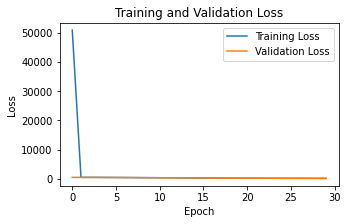

	Layers: 2
        Activation: relu
        Regularisation: None
        Epochs: 30
        Learning Rate: 0.3
        Test Loss: 120.8383560180664
        Test RMSE: 10.992650032043457





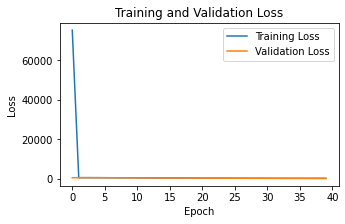

	Layers: 2
        Activation: relu
        Regularisation: None
        Epochs: 40
        Learning Rate: 0.3
        Test Loss: 103.31654357910156
        Test RMSE: 10.164474487304688





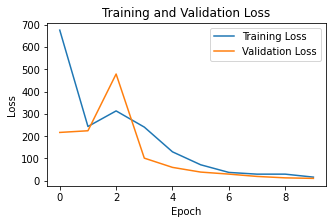

	Layers: 2
        Activation: relu
        Regularisation: None
        Epochs: 10
        Learning Rate: 0.1
        Test Loss: 13.165542602539062
        Test RMSE: 3.6284353733062744





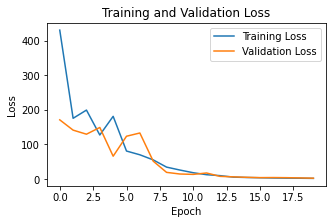

	Layers: 2
        Activation: relu
        Regularisation: None
        Epochs: 20
        Learning Rate: 0.1
        Test Loss: 4.358484745025635
        Test RMSE: 2.087698459625244





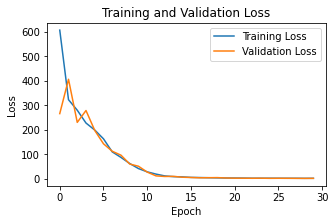

	Layers: 2
        Activation: relu
        Regularisation: None
        Epochs: 30
        Learning Rate: 0.1
        Test Loss: 2.0559144020080566
        Test RMSE: 1.4338459968566895





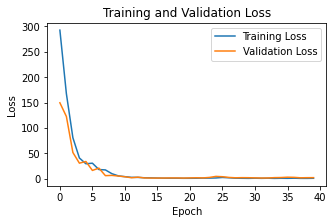

	Layers: 2
        Activation: relu
        Regularisation: None
        Epochs: 40
        Learning Rate: 0.1
        Test Loss: 1.6322118043899536
        Test RMSE: 1.2775804996490479





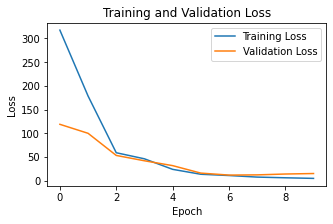

	Layers: 2
        Activation: relu
        Regularisation: None
        Epochs: 10
        Learning Rate: 0.01
        Test Loss: 6.155405521392822
        Test RMSE: 2.481009006500244





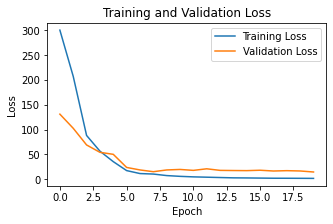

	Layers: 2
        Activation: relu
        Regularisation: None
        Epochs: 20
        Learning Rate: 0.01
        Test Loss: 3.2736363410949707
        Test RMSE: 1.809319257736206





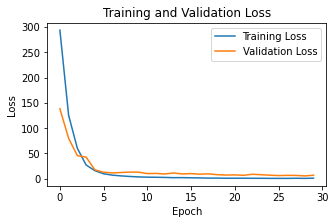

	Layers: 2
        Activation: relu
        Regularisation: None
        Epochs: 30
        Learning Rate: 0.01
        Test Loss: 2.3321666717529297
        Test RMSE: 1.5271433591842651





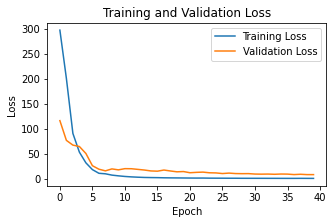

	Layers: 2
        Activation: relu
        Regularisation: None
        Epochs: 40
        Learning Rate: 0.01
        Test Loss: 1.648942470550537
        Test RMSE: 1.284111499786377





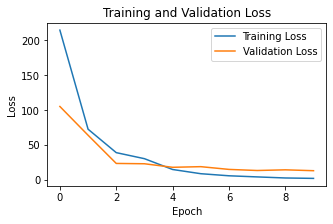

	Layers: 2
        Activation: relu
        Regularisation: None
        Epochs: 10
        Learning Rate: 0.03
        Test Loss: 2.840507745742798
        Test RMSE: 1.6853805780410767





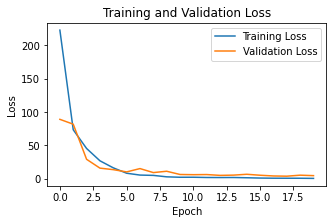

	Layers: 2
        Activation: relu
        Regularisation: None
        Epochs: 20
        Learning Rate: 0.03
        Test Loss: 2.432030200958252
        Test RMSE: 1.5594967603683472





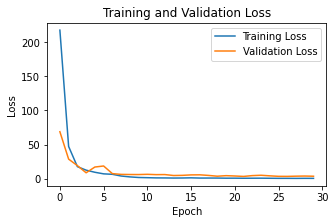

	Layers: 2
        Activation: relu
        Regularisation: None
        Epochs: 30
        Learning Rate: 0.03
        Test Loss: 1.5067169666290283
        Test RMSE: 1.2274839878082275





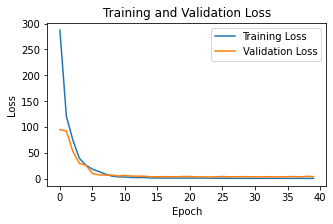

	Layers: 2
        Activation: relu
        Regularisation: None
        Epochs: 40
        Learning Rate: 0.03
        Test Loss: 1.9956541061401367
        Test RMSE: 1.412676215171814





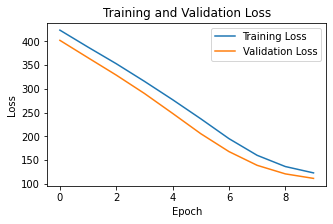

	Layers: 2
        Activation: relu
        Regularisation: None
        Epochs: 10
        Learning Rate: 0.001
        Test Loss: 124.1299819946289
        Test RMSE: 11.141363143920898





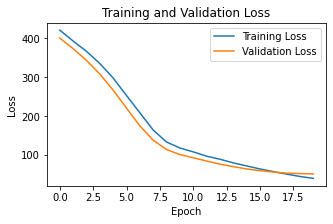

	Layers: 2
        Activation: relu
        Regularisation: None
        Epochs: 20
        Learning Rate: 0.001
        Test Loss: 40.7947883605957
        Test RMSE: 6.38707971572876





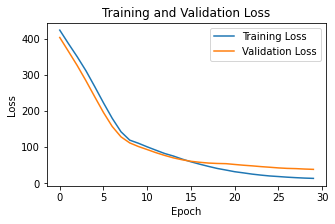

	Layers: 2
        Activation: relu
        Regularisation: None
        Epochs: 30
        Learning Rate: 0.001
        Test Loss: 16.44559669494629
        Test RMSE: 4.055316925048828





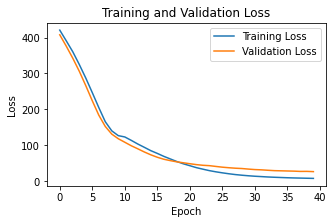

	Layers: 2
        Activation: relu
        Regularisation: None
        Epochs: 40
        Learning Rate: 0.001
        Test Loss: 11.16248893737793
        Test RMSE: 3.341031074523926





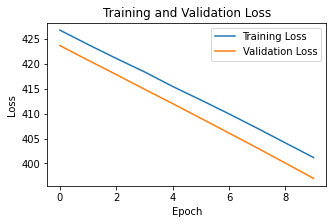

	Layers: 2
        Activation: relu
        Regularisation: None
        Epochs: 10
        Learning Rate: 0.0001
        Test Loss: 423.2510681152344
        Test RMSE: 20.57306671142578





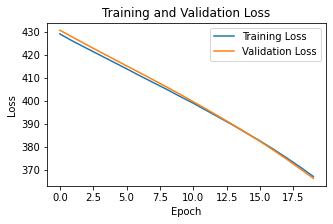

	Layers: 2
        Activation: relu
        Regularisation: None
        Epochs: 20
        Learning Rate: 0.0001
        Test Loss: 396.6775817871094
        Test RMSE: 19.916767120361328





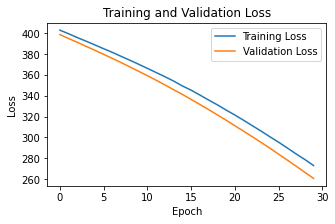

	Layers: 2
        Activation: relu
        Regularisation: None
        Epochs: 30
        Learning Rate: 0.0001
        Test Loss: 301.6376953125
        Test RMSE: 17.367719650268555





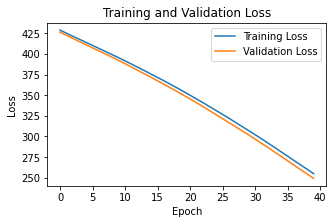

	Layers: 2
        Activation: relu
        Regularisation: None
        Epochs: 40
        Learning Rate: 0.0001
        Test Loss: 283.162841796875
        Test RMSE: 16.827442169189453





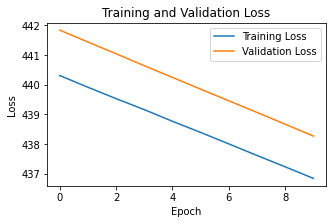

	Layers: 2
        Activation: relu
        Regularisation: None
        Epochs: 10
        Learning Rate: 1e-05
        Test Loss: 462.6118469238281
        Test RMSE: 21.508413314819336





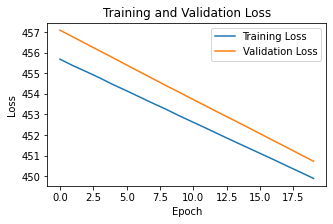

	Layers: 2
        Activation: relu
        Regularisation: None
        Epochs: 20
        Learning Rate: 1e-05
        Test Loss: 473.9679260253906
        Test RMSE: 21.77080535888672





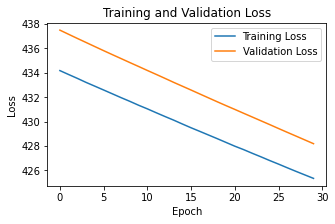

	Layers: 2
        Activation: relu
        Regularisation: None
        Epochs: 30
        Learning Rate: 1e-05
        Test Loss: 453.2652282714844
        Test RMSE: 21.29002571105957





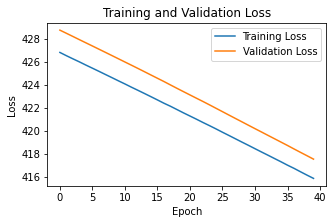

	Layers: 2
        Activation: relu
        Regularisation: None
        Epochs: 40
        Learning Rate: 1e-05
        Test Loss: 443.8429260253906
        Test RMSE: 21.06757926940918





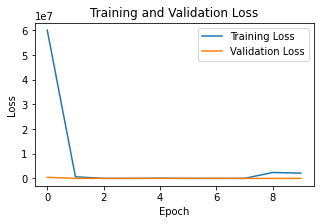

	Layers: 2
        Activation: relu
        Regularisation: l1
        Epochs: 10
        Learning Rate: 1
        Test Loss: 1036.9315185546875
        Test RMSE: 25.63469886779785





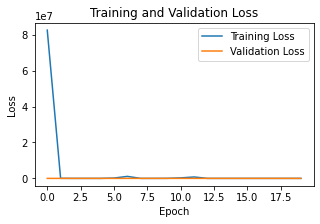

	Layers: 2
        Activation: relu
        Regularisation: l1
        Epochs: 20
        Learning Rate: 1
        Test Loss: 1118.6854248046875
        Test RMSE: 27.02025032043457





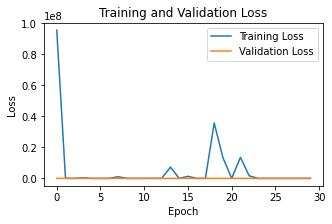

	Layers: 2
        Activation: relu
        Regularisation: l1
        Epochs: 30
        Learning Rate: 1
        Test Loss: 2134.017822265625
        Test RMSE: 41.0325813293457





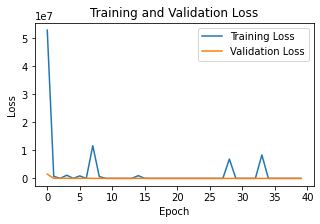

	Layers: 2
        Activation: relu
        Regularisation: l1
        Epochs: 40
        Learning Rate: 1
        Test Loss: 1317.015869140625
        Test RMSE: 29.124099731445312





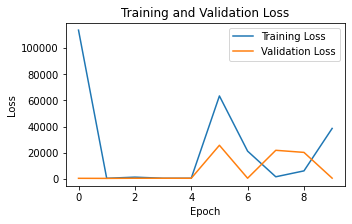

	Layers: 2
        Activation: relu
        Regularisation: l1
        Epochs: 10
        Learning Rate: 0.3
        Test Loss: 665.6980590820312
        Test RMSE: 23.51173973083496





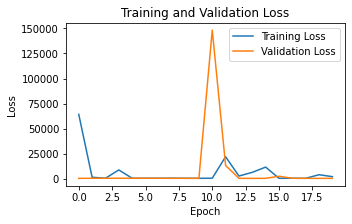

	Layers: 2
        Activation: relu
        Regularisation: l1
        Epochs: 20
        Learning Rate: 0.3
        Test Loss: 555.5277099609375
        Test RMSE: 20.886930465698242





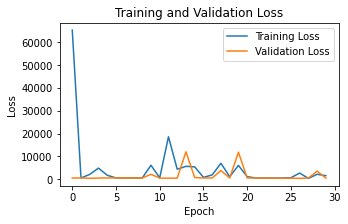

	Layers: 2
        Activation: relu
        Regularisation: l1
        Epochs: 30
        Learning Rate: 0.3
        Test Loss: 440.7606506347656
        Test RMSE: 17.406587600708008





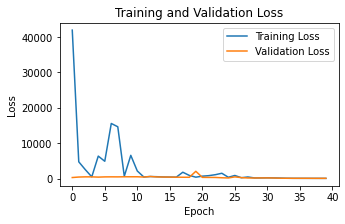

	Layers: 2
        Activation: relu
        Regularisation: l1
        Epochs: 40
        Learning Rate: 0.3
        Test Loss: 155.2401885986328
        Test RMSE: 4.996394157409668





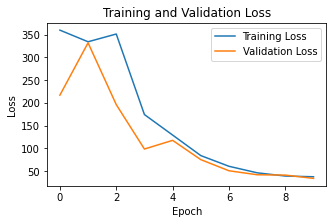

	Layers: 2
        Activation: relu
        Regularisation: l1
        Epochs: 10
        Learning Rate: 0.1
        Test Loss: 37.741172790527344
        Test RMSE: 3.3638155460357666





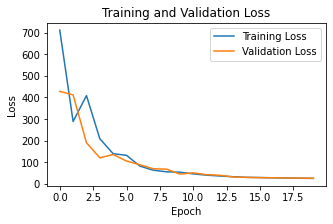

	Layers: 2
        Activation: relu
        Regularisation: l1
        Epochs: 20
        Learning Rate: 0.1
        Test Loss: 26.6551456451416
        Test RMSE: 1.5047166347503662





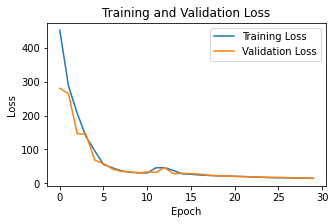

	Layers: 2
        Activation: relu
        Regularisation: l1
        Epochs: 30
        Learning Rate: 0.1
        Test Loss: 14.858366012573242
        Test RMSE: 1.2866668701171875





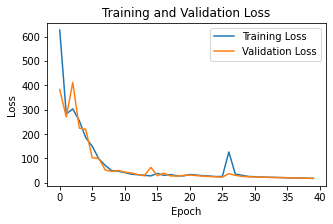

	Layers: 2
        Activation: relu
        Regularisation: l1
        Epochs: 40
        Learning Rate: 0.1
        Test Loss: 17.83678436279297
        Test RMSE: 0.9918912053108215





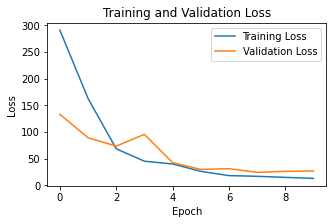

	Layers: 2
        Activation: relu
        Regularisation: l1
        Epochs: 10
        Learning Rate: 0.01
        Test Loss: 13.79345703125
        Test RMSE: 2.5343575477600098





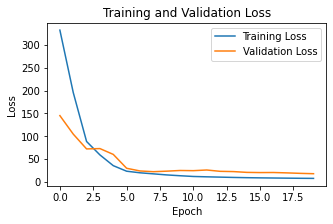

	Layers: 2
        Activation: relu
        Regularisation: l1
        Epochs: 20
        Learning Rate: 0.01
        Test Loss: 8.947327613830566
        Test RMSE: 1.6894539594650269





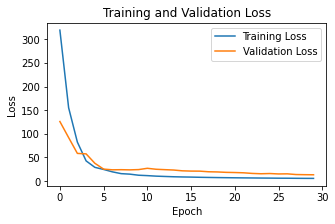

	Layers: 2
        Activation: relu
        Regularisation: l1
        Epochs: 30
        Learning Rate: 0.01
        Test Loss: 6.9663777351379395
        Test RMSE: 1.4572492837905884





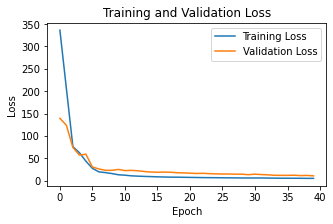

	Layers: 2
        Activation: relu
        Regularisation: l1
        Epochs: 40
        Learning Rate: 0.01
        Test Loss: 6.549414157867432
        Test RMSE: 1.4190726280212402





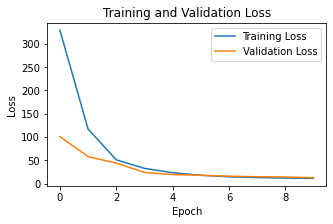

	Layers: 2
        Activation: relu
        Regularisation: l1
        Epochs: 10
        Learning Rate: 0.03
        Test Loss: 11.727103233337402
        Test RMSE: 1.8061918020248413





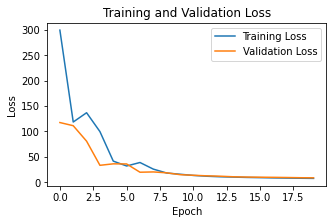

	Layers: 2
        Activation: relu
        Regularisation: l1
        Epochs: 20
        Learning Rate: 0.03
        Test Loss: 7.857126235961914
        Test RMSE: 1.1895302534103394





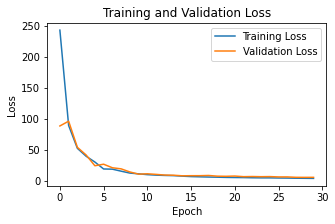

	Layers: 2
        Activation: relu
        Regularisation: l1
        Epochs: 30
        Learning Rate: 0.03
        Test Loss: 5.055080413818359
        Test RMSE: 1.2420425415039062





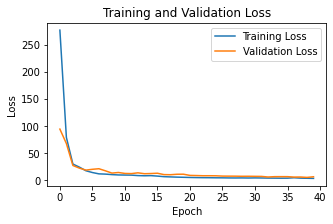

	Layers: 2
        Activation: relu
        Regularisation: l1
        Epochs: 40
        Learning Rate: 0.03
        Test Loss: 4.452528476715088
        Test RMSE: 1.1822593212127686





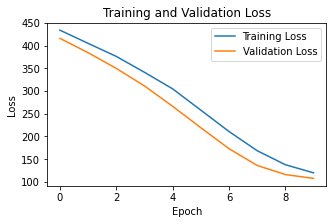

	Layers: 2
        Activation: relu
        Regularisation: l1
        Epochs: 10
        Learning Rate: 0.001
        Test Loss: 126.66397094726562
        Test RMSE: 10.831789016723633





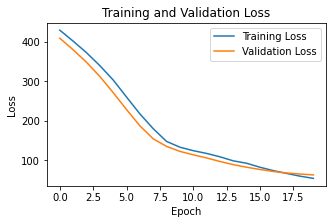

	Layers: 2
        Activation: relu
        Regularisation: l1
        Epochs: 20
        Learning Rate: 0.001
        Test Loss: 57.332122802734375
        Test RMSE: 6.948806285858154





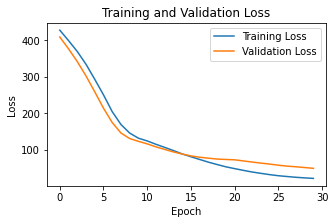

	Layers: 2
        Activation: relu
        Regularisation: l1
        Epochs: 30
        Learning Rate: 0.001
        Test Loss: 23.903886795043945
        Test RMSE: 3.909672260284424





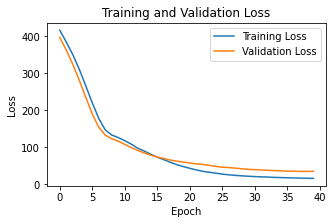

	Layers: 2
        Activation: relu
        Regularisation: l1
        Epochs: 40
        Learning Rate: 0.001
        Test Loss: 18.764053344726562
        Test RMSE: 3.2305495738983154





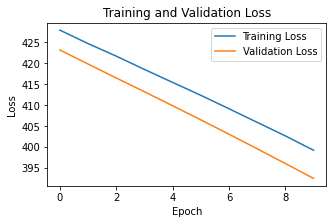

	Layers: 2
        Activation: relu
        Regularisation: l1
        Epochs: 10
        Learning Rate: 0.0001
        Test Loss: 423.30889892578125
        Test RMSE: 20.353946685791016





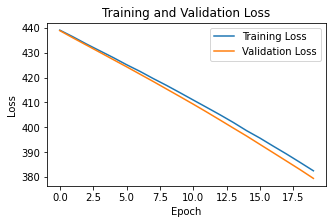

	Layers: 2
        Activation: relu
        Regularisation: l1
        Epochs: 20
        Learning Rate: 0.0001
        Test Loss: 412.1837158203125
        Test RMSE: 20.079362869262695





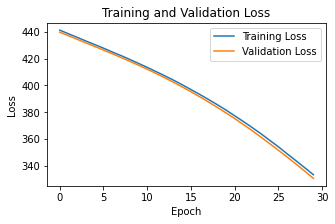

	Layers: 2
        Activation: relu
        Regularisation: l1
        Epochs: 30
        Learning Rate: 0.0001
        Test Loss: 363.32720947265625
        Test RMSE: 18.820390701293945





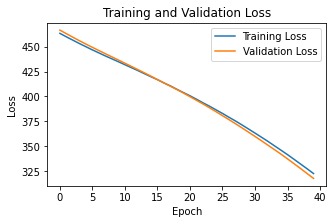

	Layers: 2
        Activation: relu
        Regularisation: l1
        Epochs: 40
        Learning Rate: 0.0001
        Test Loss: 358.3467102050781
        Test RMSE: 18.689180374145508





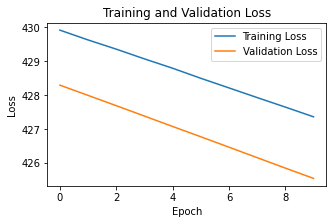

	Layers: 2
        Activation: relu
        Regularisation: l1
        Epochs: 10
        Learning Rate: 1e-05
        Test Loss: 454.294189453125
        Test RMSE: 21.100915908813477





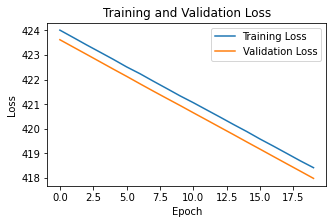

	Layers: 2
        Activation: relu
        Regularisation: l1
        Epochs: 20
        Learning Rate: 1e-05
        Test Loss: 449.0760192871094
        Test RMSE: 20.976253509521484





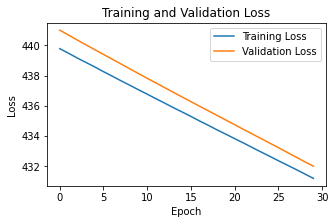

	Layers: 2
        Activation: relu
        Regularisation: l1
        Epochs: 30
        Learning Rate: 1e-05
        Test Loss: 459.1058654785156
        Test RMSE: 21.215511322021484





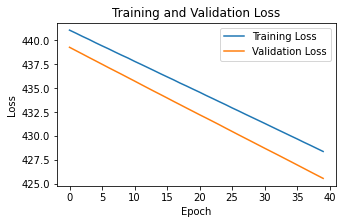

	Layers: 2
        Activation: relu
        Regularisation: l1
        Epochs: 40
        Learning Rate: 1e-05
        Test Loss: 456.5884094238281
        Test RMSE: 21.153722763061523





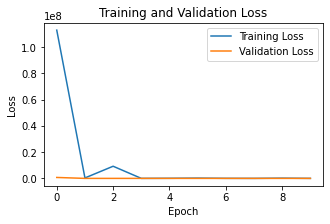

	Layers: 2
        Activation: relu
        Regularisation: l2
        Epochs: 10
        Learning Rate: 1
        Test Loss: 3123.31103515625
        Test RMSE: 31.85129737854004





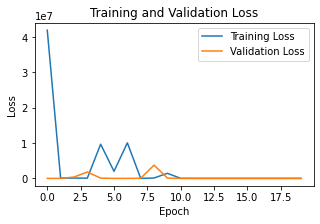

	Layers: 2
        Activation: relu
        Regularisation: l2
        Epochs: 20
        Learning Rate: 1
        Test Loss: 3326.248046875
        Test RMSE: 31.5459041595459





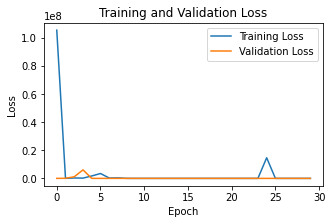

	Layers: 2
        Activation: relu
        Regularisation: l2
        Epochs: 30
        Learning Rate: 1
        Test Loss: 3223.58154296875
        Test RMSE: 29.61565399169922





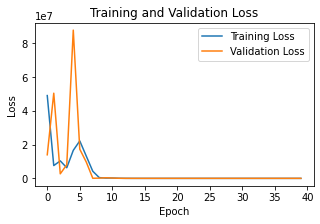

	Layers: 2
        Activation: relu
        Regularisation: l2
        Epochs: 40
        Learning Rate: 1
        Test Loss: 2809.201416015625
        Test RMSE: 32.02617645263672





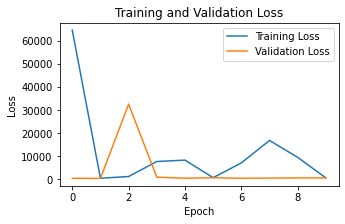

	Layers: 2
        Activation: relu
        Regularisation: l2
        Epochs: 10
        Learning Rate: 0.3
        Test Loss: 690.6629028320312
        Test RMSE: 22.84140968322754





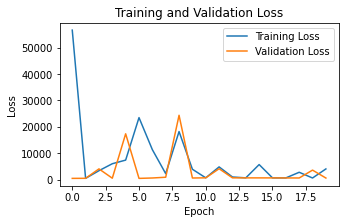

	Layers: 2
        Activation: relu
        Regularisation: l2
        Epochs: 20
        Learning Rate: 0.3
        Test Loss: 646.0084838867188
        Test RMSE: 20.847259521484375





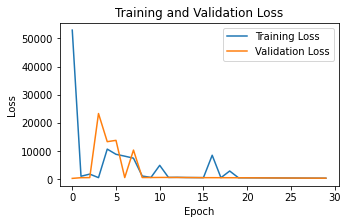

	Layers: 2
        Activation: relu
        Regularisation: l2
        Epochs: 30
        Learning Rate: 0.3
        Test Loss: 372.4357604980469
        Test RMSE: 14.25604248046875





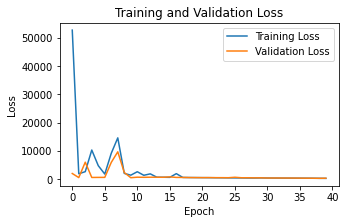

	Layers: 2
        Activation: relu
        Regularisation: l2
        Epochs: 40
        Learning Rate: 0.3
        Test Loss: 297.2806701660156
        Test RMSE: 10.755908966064453





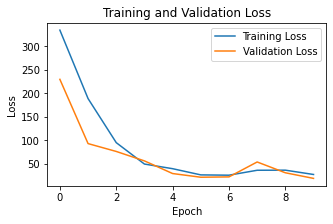

	Layers: 2
        Activation: relu
        Regularisation: l2
        Epochs: 10
        Learning Rate: 0.1
        Test Loss: 24.369674682617188
        Test RMSE: 3.9672515392303467





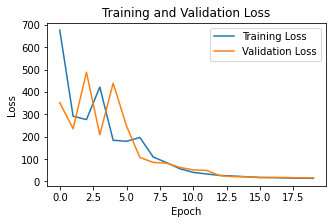

	Layers: 2
        Activation: relu
        Regularisation: l2
        Epochs: 20
        Learning Rate: 0.1
        Test Loss: 14.240260124206543
        Test RMSE: 1.718823790550232





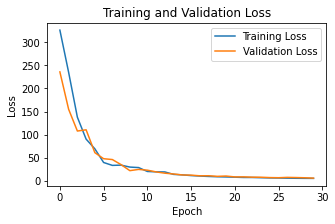

	Layers: 2
        Activation: relu
        Regularisation: l2
        Epochs: 30
        Learning Rate: 0.1
        Test Loss: 6.012345790863037
        Test RMSE: 1.318706750869751





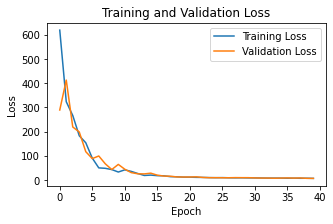

	Layers: 2
        Activation: relu
        Regularisation: l2
        Epochs: 40
        Learning Rate: 0.1
        Test Loss: 7.396820068359375
        Test RMSE: 1.2345913648605347





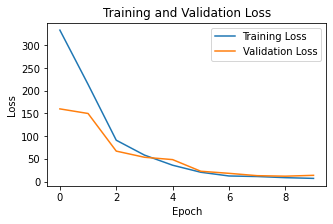

	Layers: 2
        Activation: relu
        Regularisation: l2
        Epochs: 10
        Learning Rate: 0.01
        Test Loss: 8.842373847961426
        Test RMSE: 2.707080841064453





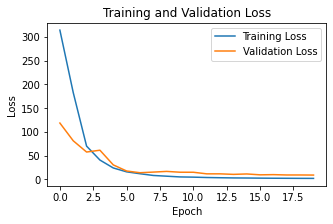

	Layers: 2
        Activation: relu
        Regularisation: l2
        Epochs: 20
        Learning Rate: 0.01
        Test Loss: 3.199801206588745
        Test RMSE: 1.4134324789047241





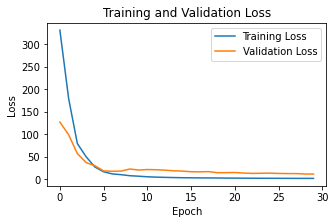

	Layers: 2
        Activation: relu
        Regularisation: l2
        Epochs: 30
        Learning Rate: 0.01
        Test Loss: 3.3961379528045654
        Test RMSE: 1.5447909832000732





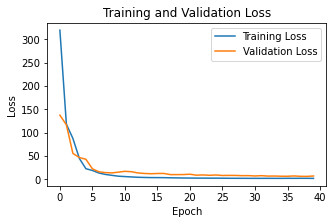

	Layers: 2
        Activation: relu
        Regularisation: l2
        Epochs: 40
        Learning Rate: 0.01
        Test Loss: 3.2881321907043457
        Test RMSE: 1.5496618747711182





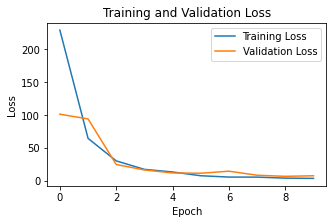

	Layers: 2
        Activation: relu
        Regularisation: l2
        Epochs: 10
        Learning Rate: 0.03
        Test Loss: 4.6868977546691895
        Test RMSE: 1.6746875047683716





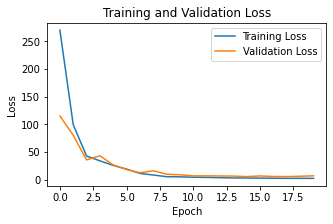

	Layers: 2
        Activation: relu
        Regularisation: l2
        Epochs: 20
        Learning Rate: 0.03
        Test Loss: 3.09871506690979
        Test RMSE: 1.3584885597229004





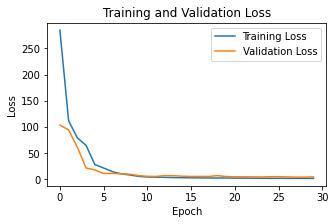

	Layers: 2
        Activation: relu
        Regularisation: l2
        Epochs: 30
        Learning Rate: 0.03
        Test Loss: 3.0054931640625
        Test RMSE: 1.3327560424804688





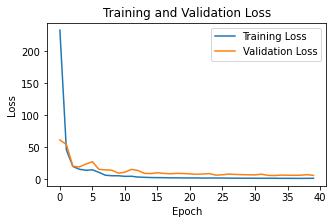

	Layers: 2
        Activation: relu
        Regularisation: l2
        Epochs: 40
        Learning Rate: 0.03
        Test Loss: 2.197953224182129
        Test RMSE: 1.187294840812683





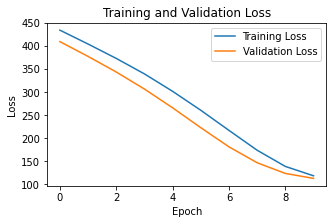

	Layers: 2
        Activation: relu
        Regularisation: l2
        Epochs: 10
        Learning Rate: 0.001
        Test Loss: 119.59051513671875
        Test RMSE: 10.876972198486328





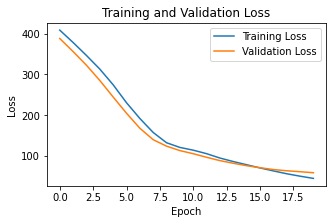

	Layers: 2
        Activation: relu
        Regularisation: l2
        Epochs: 20
        Learning Rate: 0.001
        Test Loss: 45.753597259521484
        Test RMSE: 6.665918827056885





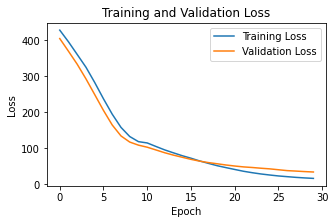

	Layers: 2
        Activation: relu
        Regularisation: l2
        Epochs: 30
        Learning Rate: 0.001
        Test Loss: 19.3128604888916
        Test RMSE: 4.235758304595947





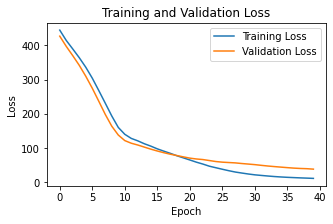

	Layers: 2
        Activation: relu
        Regularisation: l2
        Epochs: 40
        Learning Rate: 0.001
        Test Loss: 15.194028854370117
        Test RMSE: 3.720827341079712





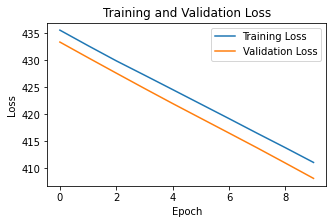

	Layers: 2
        Activation: relu
        Regularisation: l2
        Epochs: 10
        Learning Rate: 0.0001
        Test Loss: 439.2895812988281
        Test RMSE: 20.933252334594727





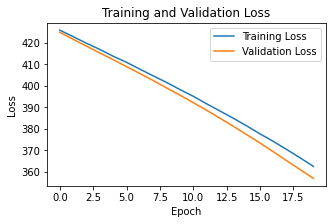

	Layers: 2
        Activation: relu
        Regularisation: l2
        Epochs: 20
        Learning Rate: 0.0001
        Test Loss: 394.952392578125
        Test RMSE: 19.845388412475586





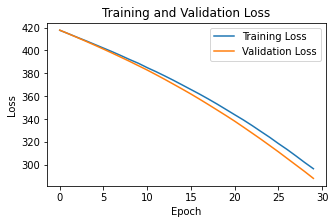

	Layers: 2
        Activation: relu
        Regularisation: l2
        Epochs: 30
        Learning Rate: 0.0001
        Test Loss: 327.2855529785156
        Test RMSE: 18.059831619262695





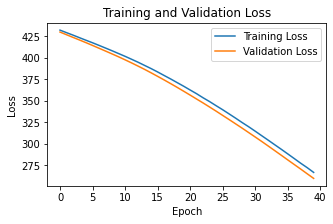

	Layers: 2
        Activation: relu
        Regularisation: l2
        Epochs: 40
        Learning Rate: 0.0001
        Test Loss: 296.3030700683594
        Test RMSE: 17.18041229248047





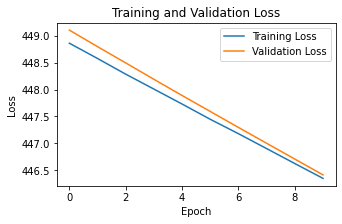

	Layers: 2
        Activation: relu
        Regularisation: l2
        Epochs: 10
        Learning Rate: 1e-05
        Test Loss: 471.44427490234375
        Test RMSE: 21.68703269958496





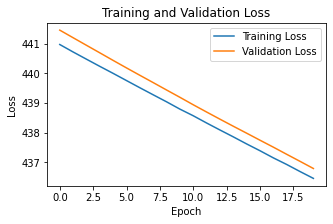

	Layers: 2
        Activation: relu
        Regularisation: l2
        Epochs: 20
        Learning Rate: 1e-05
        Test Loss: 464.55303955078125
        Test RMSE: 21.52777099609375





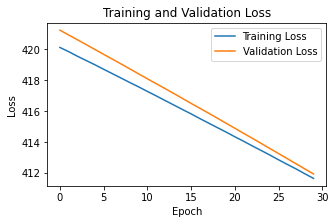

	Layers: 2
        Activation: relu
        Regularisation: l2
        Epochs: 30
        Learning Rate: 1e-05
        Test Loss: 437.6124572753906
        Test RMSE: 20.892383575439453





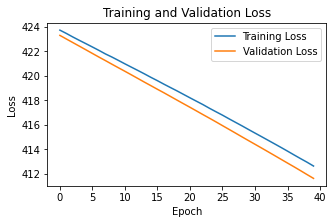

	Layers: 2
        Activation: relu
        Regularisation: l2
        Epochs: 40
        Learning Rate: 1e-05
        Test Loss: 440.77606201171875
        Test RMSE: 20.968225479125977





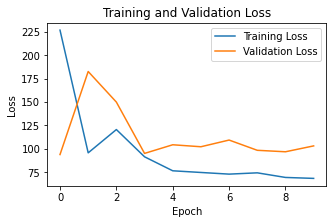

	Layers: 2
        Activation: sigmoid
        Regularisation: None
        Epochs: 10
        Learning Rate: 1
        Test Loss: 74.74856567382812
        Test RMSE: 8.64572525024414





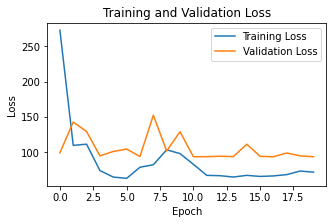

	Layers: 2
        Activation: sigmoid
        Regularisation: None
        Epochs: 20
        Learning Rate: 1
        Test Loss: 73.75296783447266
        Test RMSE: 8.5879545211792





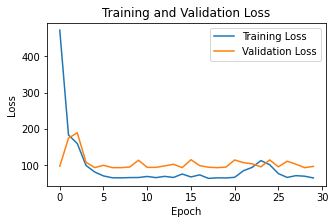

	Layers: 2
        Activation: sigmoid
        Regularisation: None
        Epochs: 30
        Learning Rate: 1
        Test Loss: 81.44371032714844
        Test RMSE: 9.024617195129395





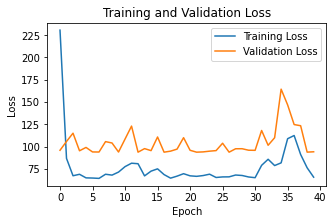

	Layers: 2
        Activation: sigmoid
        Regularisation: None
        Epochs: 40
        Learning Rate: 1
        Test Loss: 72.0176010131836
        Test RMSE: 8.486318588256836





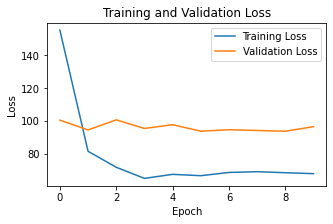

	Layers: 2
        Activation: sigmoid
        Regularisation: None
        Epochs: 10
        Learning Rate: 0.3
        Test Loss: 71.78860473632812
        Test RMSE: 8.47281551361084





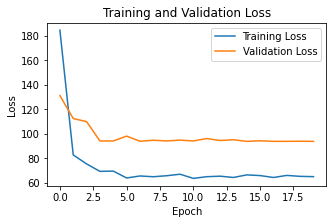

	Layers: 2
        Activation: sigmoid
        Regularisation: None
        Epochs: 20
        Learning Rate: 0.3
        Test Loss: 73.15144348144531
        Test RMSE: 8.552862167358398





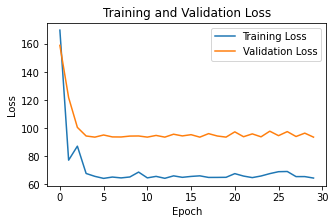

	Layers: 2
        Activation: sigmoid
        Regularisation: None
        Epochs: 30
        Learning Rate: 0.3
        Test Loss: 73.28825378417969
        Test RMSE: 8.560855865478516





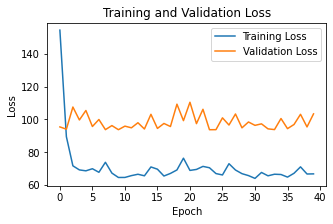

	Layers: 2
        Activation: sigmoid
        Regularisation: None
        Epochs: 40
        Learning Rate: 0.3
        Test Loss: 74.9960708618164
        Test RMSE: 8.660027503967285





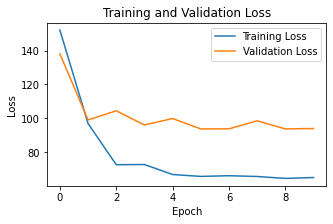

	Layers: 2
        Activation: sigmoid
        Regularisation: None
        Epochs: 10
        Learning Rate: 0.1
        Test Loss: 72.241455078125
        Test RMSE: 8.499497413635254





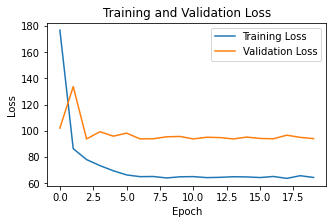

	Layers: 2
        Activation: sigmoid
        Regularisation: None
        Epochs: 20
        Learning Rate: 0.1
        Test Loss: 72.2381820678711
        Test RMSE: 8.49930477142334





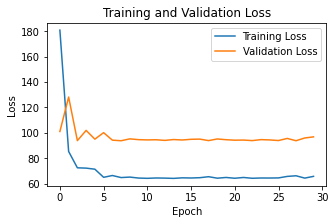

	Layers: 2
        Activation: sigmoid
        Regularisation: None
        Epochs: 30
        Learning Rate: 0.1
        Test Loss: 71.84811401367188
        Test RMSE: 8.476326942443848





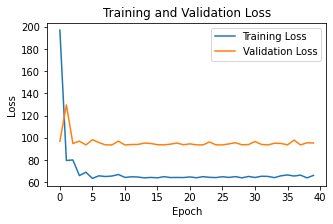

	Layers: 2
        Activation: sigmoid
        Regularisation: None
        Epochs: 40
        Learning Rate: 0.1
        Test Loss: 71.63072204589844
        Test RMSE: 8.463493347167969





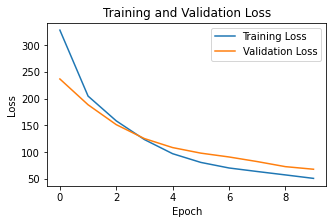

	Layers: 2
        Activation: sigmoid
        Regularisation: None
        Epochs: 10
        Learning Rate: 0.01
        Test Loss: 55.06235885620117
        Test RMSE: 7.420401573181152





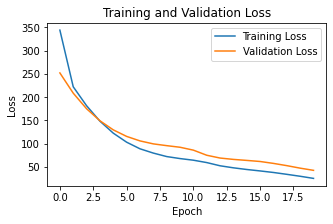

	Layers: 2
        Activation: sigmoid
        Regularisation: None
        Epochs: 20
        Learning Rate: 0.01
        Test Loss: 28.0867862701416
        Test RMSE: 5.299696922302246





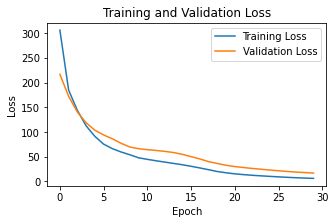

	Layers: 2
        Activation: sigmoid
        Regularisation: None
        Epochs: 30
        Learning Rate: 0.01
        Test Loss: 6.844252109527588
        Test RMSE: 2.616152048110962





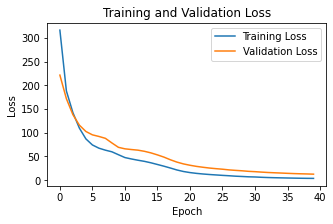

	Layers: 2
        Activation: sigmoid
        Regularisation: None
        Epochs: 40
        Learning Rate: 0.01
        Test Loss: 4.309946060180664
        Test RMSE: 2.0760409832000732





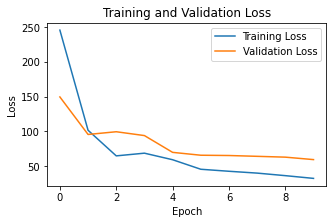

	Layers: 2
        Activation: sigmoid
        Regularisation: None
        Epochs: 10
        Learning Rate: 0.03
        Test Loss: 36.913204193115234
        Test RMSE: 6.075623989105225





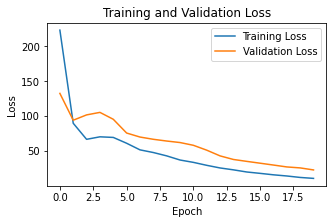

	Layers: 2
        Activation: sigmoid
        Regularisation: None
        Epochs: 20
        Learning Rate: 0.03
        Test Loss: 10.506559371948242
        Test RMSE: 3.241382360458374





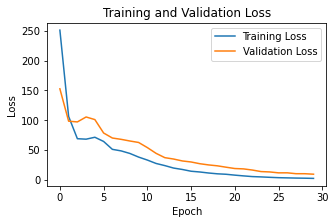

	Layers: 2
        Activation: sigmoid
        Regularisation: None
        Epochs: 30
        Learning Rate: 0.03
        Test Loss: 2.2751474380493164
        Test RMSE: 1.5083591938018799





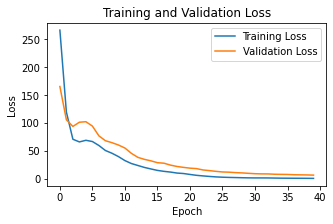

	Layers: 2
        Activation: sigmoid
        Regularisation: None
        Epochs: 40
        Learning Rate: 0.03
        Test Loss: 1.205116629600525
        Test RMSE: 1.097778081893921





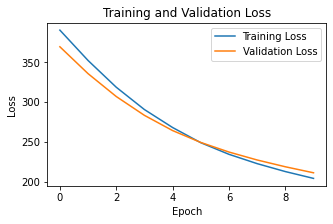

	Layers: 2
        Activation: sigmoid
        Regularisation: None
        Epochs: 10
        Learning Rate: 0.001
        Test Loss: 219.32504272460938
        Test RMSE: 14.809626579284668





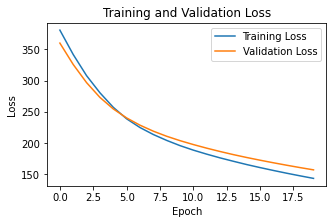

	Layers: 2
        Activation: sigmoid
        Regularisation: None
        Epochs: 20
        Learning Rate: 0.001
        Test Loss: 158.4495086669922
        Test RMSE: 12.58767318725586





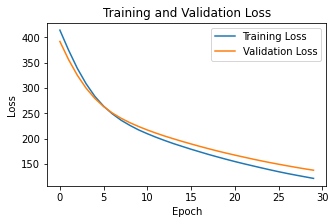

	Layers: 2
        Activation: sigmoid
        Regularisation: None
        Epochs: 30
        Learning Rate: 0.001
        Test Loss: 135.3150177001953
        Test RMSE: 11.632498741149902





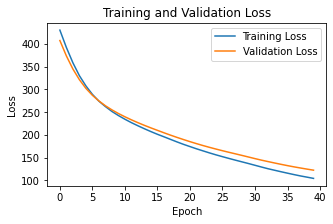

	Layers: 2
        Activation: sigmoid
        Regularisation: None
        Epochs: 40
        Learning Rate: 0.001
        Test Loss: 117.37982940673828
        Test RMSE: 10.834197044372559





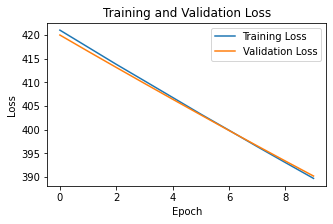

	Layers: 2
        Activation: sigmoid
        Regularisation: None
        Epochs: 10
        Learning Rate: 0.0001
        Test Loss: 414.03350830078125
        Test RMSE: 20.34781265258789





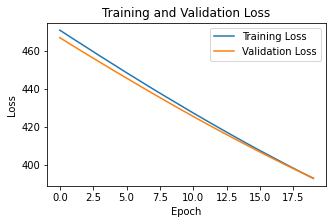

	Layers: 2
        Activation: sigmoid
        Regularisation: None
        Epochs: 20
        Learning Rate: 0.0001
        Test Loss: 416.7076110839844
        Test RMSE: 20.41341781616211





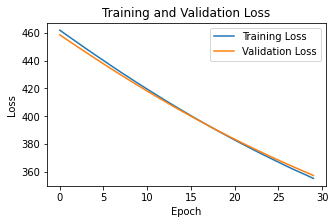

	Layers: 2
        Activation: sigmoid
        Regularisation: None
        Epochs: 30
        Learning Rate: 0.0001
        Test Loss: 379.15985107421875
        Test RMSE: 19.472026824951172





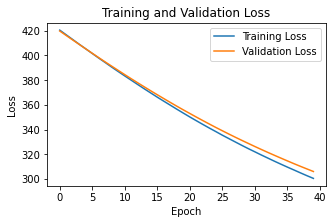

	Layers: 2
        Activation: sigmoid
        Regularisation: None
        Epochs: 40
        Learning Rate: 0.0001
        Test Loss: 323.2625427246094
        Test RMSE: 17.979503631591797





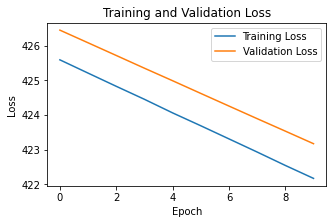

	Layers: 2
        Activation: sigmoid
        Regularisation: None
        Epochs: 10
        Learning Rate: 1e-05
        Test Loss: 448.8761291503906
        Test RMSE: 21.186697006225586





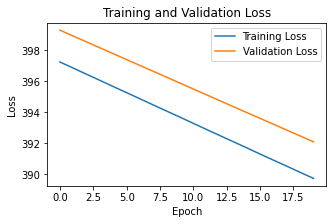

	Layers: 2
        Activation: sigmoid
        Regularisation: None
        Epochs: 20
        Learning Rate: 1e-05
        Test Loss: 415.83355712890625
        Test RMSE: 20.391998291015625





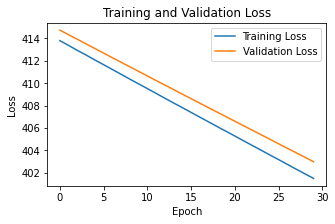

	Layers: 2
        Activation: sigmoid
        Regularisation: None
        Epochs: 30
        Learning Rate: 1e-05
        Test Loss: 428.01165771484375
        Test RMSE: 20.68844223022461





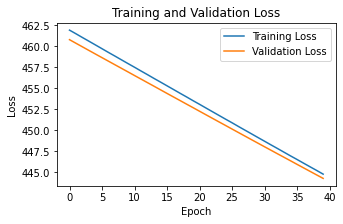

	Layers: 2
        Activation: sigmoid
        Regularisation: None
        Epochs: 40
        Learning Rate: 1e-05
        Test Loss: 472.1461181640625
        Test RMSE: 21.728923797607422





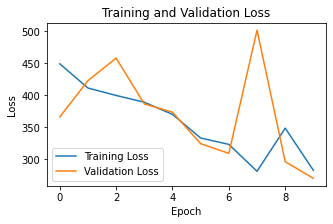

	Layers: 2
        Activation: sigmoid
        Regularisation: l1
        Epochs: 10
        Learning Rate: 1
        Test Loss: 260.80938720703125
        Test RMSE: 5.262598991394043





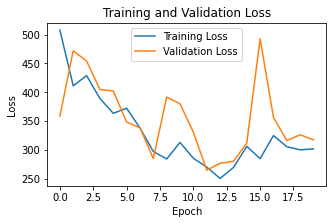

	Layers: 2
        Activation: sigmoid
        Regularisation: l1
        Epochs: 20
        Learning Rate: 1
        Test Loss: 294.7874755859375
        Test RMSE: 5.1009039878845215





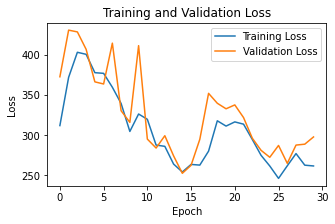

	Layers: 2
        Activation: sigmoid
        Regularisation: l1
        Epochs: 30
        Learning Rate: 1
        Test Loss: 296.3366394042969
        Test RMSE: 8.264230728149414





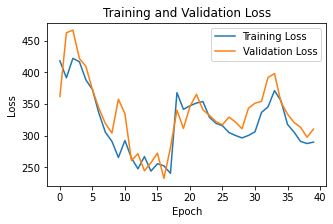

	Layers: 2
        Activation: sigmoid
        Regularisation: l1
        Epochs: 40
        Learning Rate: 1
        Test Loss: 291.701416015625
        Test RMSE: 5.261483669281006





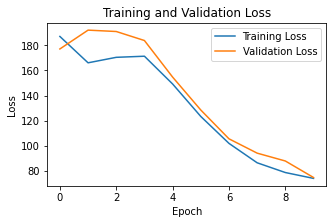

	Layers: 2
        Activation: sigmoid
        Regularisation: l1
        Epochs: 10
        Learning Rate: 0.3
        Test Loss: 70.88162231445312
        Test RMSE: 3.4684174060821533





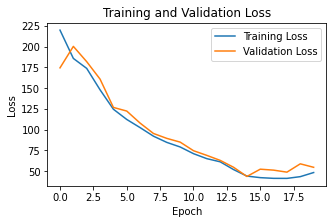

	Layers: 2
        Activation: sigmoid
        Regularisation: l1
        Epochs: 20
        Learning Rate: 0.3
        Test Loss: 43.96967315673828
        Test RMSE: 3.0739495754241943





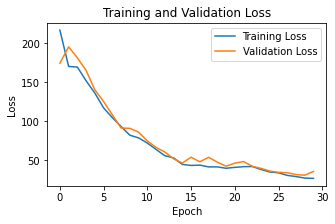

	Layers: 2
        Activation: sigmoid
        Regularisation: l1
        Epochs: 30
        Learning Rate: 0.3
        Test Loss: 28.80720329284668
        Test RMSE: 2.8866944313049316





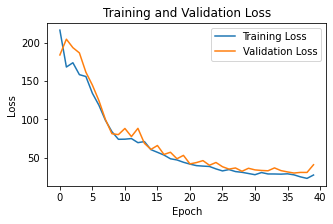

	Layers: 2
        Activation: sigmoid
        Regularisation: l1
        Epochs: 40
        Learning Rate: 0.3
        Test Loss: 32.858612060546875
        Test RMSE: 3.855954885482788





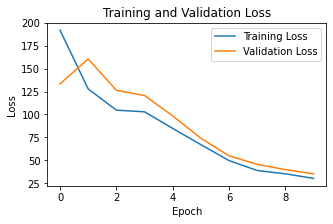

	Layers: 2
        Activation: sigmoid
        Regularisation: l1
        Epochs: 10
        Learning Rate: 0.1
        Test Loss: 26.971609115600586
        Test RMSE: 1.9411637783050537





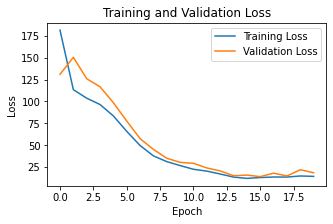

	Layers: 2
        Activation: sigmoid
        Regularisation: l1
        Epochs: 20
        Learning Rate: 0.1
        Test Loss: 13.732536315917969
        Test RMSE: 2.255100965499878





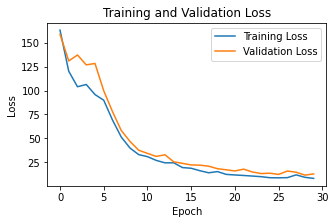

	Layers: 2
        Activation: sigmoid
        Regularisation: l1
        Epochs: 30
        Learning Rate: 0.1
        Test Loss: 7.980916976928711
        Test RMSE: 1.6855463981628418





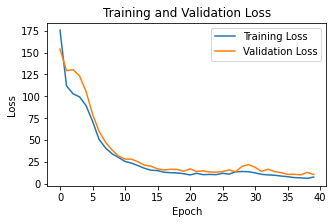

	Layers: 2
        Activation: sigmoid
        Regularisation: l1
        Epochs: 40
        Learning Rate: 0.1
        Test Loss: 6.060654640197754
        Test RMSE: 1.5015678405761719





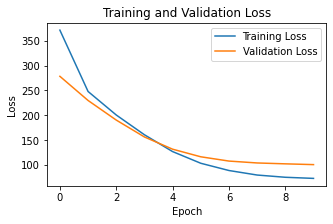

	Layers: 2
        Activation: sigmoid
        Regularisation: l1
        Epochs: 10
        Learning Rate: 0.01
        Test Loss: 79.50895690917969
        Test RMSE: 8.39291763305664





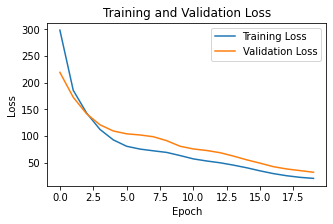

	Layers: 2
        Activation: sigmoid
        Regularisation: l1
        Epochs: 20
        Learning Rate: 0.01
        Test Loss: 20.774776458740234
        Test RMSE: 3.488626003265381





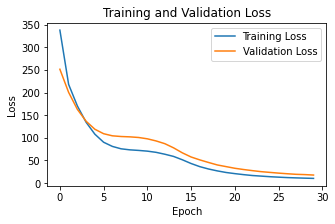

	Layers: 2
        Activation: sigmoid
        Regularisation: l1
        Epochs: 30
        Learning Rate: 0.01
        Test Loss: 9.802030563354492
        Test RMSE: 1.9840750694274902





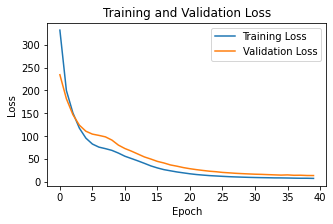

	Layers: 2
        Activation: sigmoid
        Regularisation: l1
        Epochs: 40
        Learning Rate: 0.01
        Test Loss: 7.4949727058410645
        Test RMSE: 1.743739366531372





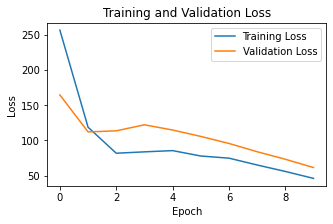

	Layers: 2
        Activation: sigmoid
        Regularisation: l1
        Epochs: 10
        Learning Rate: 0.03
        Test Loss: 42.916168212890625
        Test RMSE: 5.4207329750061035





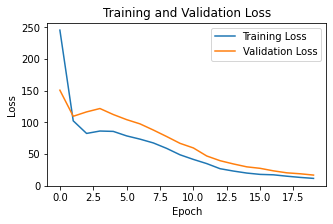

	Layers: 2
        Activation: sigmoid
        Regularisation: l1
        Epochs: 20
        Learning Rate: 0.03
        Test Loss: 9.612302780151367
        Test RMSE: 1.5124403238296509





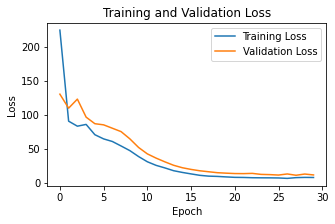

	Layers: 2
        Activation: sigmoid
        Regularisation: l1
        Epochs: 30
        Learning Rate: 0.03
        Test Loss: 7.146302700042725
        Test RMSE: 1.693833351135254





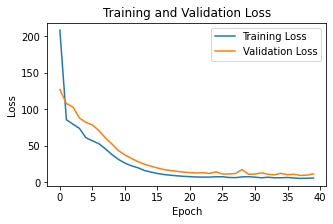

	Layers: 2
        Activation: sigmoid
        Regularisation: l1
        Epochs: 40
        Learning Rate: 0.03
        Test Loss: 7.52805757522583
        Test RMSE: 2.071949005126953





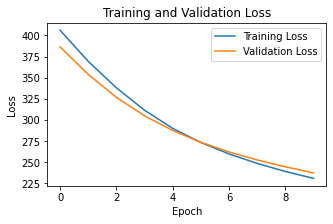

	Layers: 2
        Activation: sigmoid
        Regularisation: l1
        Epochs: 10
        Learning Rate: 0.001
        Test Loss: 247.27020263671875
        Test RMSE: 15.426234245300293





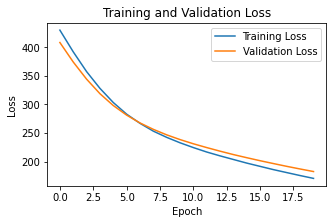

	Layers: 2
        Activation: sigmoid
        Regularisation: l1
        Epochs: 20
        Learning Rate: 0.001
        Test Loss: 185.79556274414062
        Test RMSE: 13.290759086608887





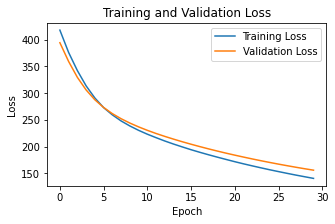

	Layers: 2
        Activation: sigmoid
        Regularisation: l1
        Epochs: 30
        Learning Rate: 0.001
        Test Loss: 155.1806640625
        Test RMSE: 12.089485168457031





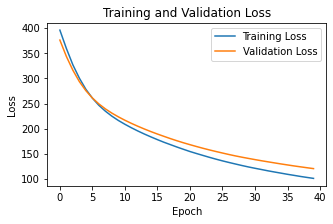

	Layers: 2
        Activation: sigmoid
        Regularisation: l1
        Epochs: 40
        Learning Rate: 0.001
        Test Loss: 113.69692993164062
        Test RMSE: 10.249802589416504





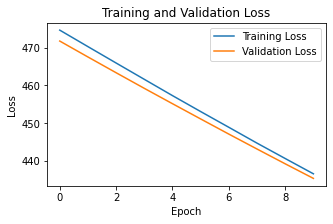

	Layers: 2
        Activation: sigmoid
        Regularisation: l1
        Epochs: 10
        Learning Rate: 0.0001
        Test Loss: 461.9266662597656
        Test RMSE: 21.27979850769043





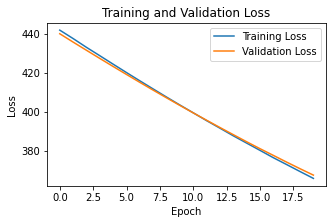

	Layers: 2
        Activation: sigmoid
        Regularisation: l1
        Epochs: 20
        Learning Rate: 0.0001
        Test Loss: 389.1658630371094
        Test RMSE: 19.495969772338867





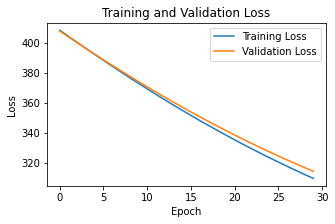

	Layers: 2
        Activation: sigmoid
        Regularisation: l1
        Epochs: 30
        Learning Rate: 0.0001
        Test Loss: 332.0109558105469
        Test RMSE: 17.969268798828125





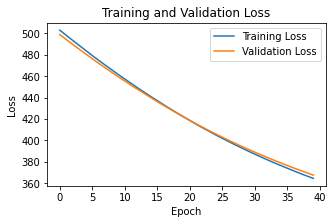

	Layers: 2
        Activation: sigmoid
        Regularisation: l1
        Epochs: 40
        Learning Rate: 0.0001
        Test Loss: 388.6786193847656
        Test RMSE: 19.483234405517578





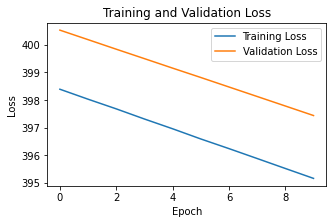

	Layers: 2
        Activation: sigmoid
        Regularisation: l1
        Epochs: 10
        Learning Rate: 1e-05
        Test Loss: 420.9569396972656
        Test RMSE: 20.293638229370117





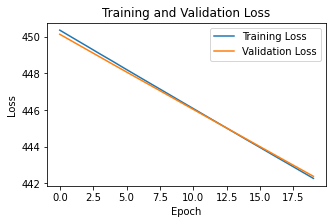

	Layers: 2
        Activation: sigmoid
        Regularisation: l1
        Epochs: 20
        Learning Rate: 1e-05
        Test Loss: 469.72686767578125
        Test RMSE: 21.46289825439453





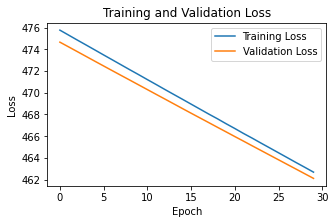

	Layers: 2
        Activation: sigmoid
        Regularisation: l1
        Epochs: 30
        Learning Rate: 1e-05
        Test Loss: 490.293701171875
        Test RMSE: 21.936384201049805





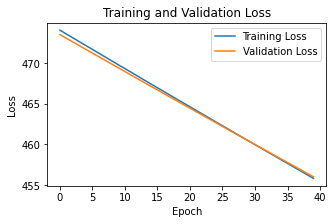

	Layers: 2
        Activation: sigmoid
        Regularisation: l1
        Epochs: 40
        Learning Rate: 1e-05
        Test Loss: 483.36199951171875
        Test RMSE: 21.77942657470703





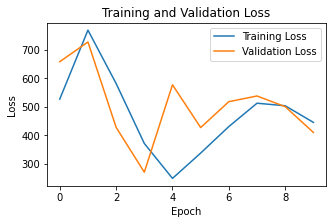

	Layers: 2
        Activation: sigmoid
        Regularisation: l2
        Epochs: 10
        Learning Rate: 1
        Test Loss: 393.3345642089844
        Test RMSE: 5.585919380187988





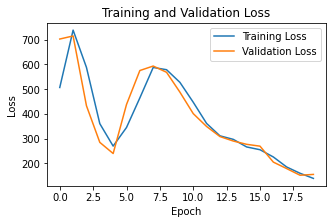

	Layers: 2
        Activation: sigmoid
        Regularisation: l2
        Epochs: 20
        Learning Rate: 1
        Test Loss: 133.21066284179688
        Test RMSE: 5.2497687339782715





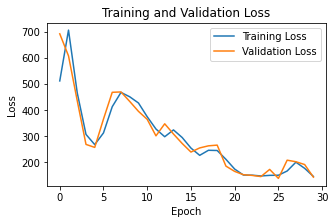

	Layers: 2
        Activation: sigmoid
        Regularisation: l2
        Epochs: 30
        Learning Rate: 1
        Test Loss: 132.1989288330078
        Test RMSE: 5.2340521812438965





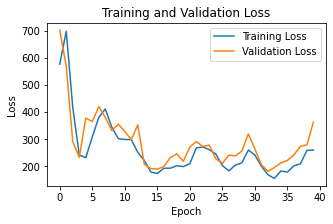

	Layers: 2
        Activation: sigmoid
        Regularisation: l2
        Epochs: 40
        Learning Rate: 1
        Test Loss: 367.4174499511719
        Test RMSE: 14.025044441223145





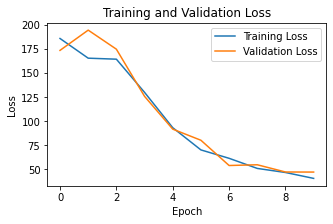

	Layers: 2
        Activation: sigmoid
        Regularisation: l2
        Epochs: 10
        Learning Rate: 0.3
        Test Loss: 42.85469436645508
        Test RMSE: 4.2404465675354





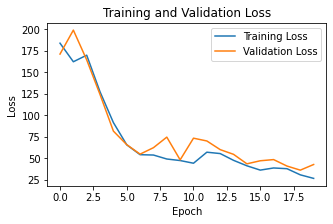

	Layers: 2
        Activation: sigmoid
        Regularisation: l2
        Epochs: 20
        Learning Rate: 0.3
        Test Loss: 29.628108978271484
        Test RMSE: 3.5775105953216553





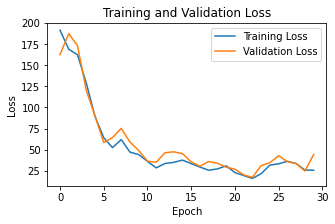

	Layers: 2
        Activation: sigmoid
        Regularisation: l2
        Epochs: 30
        Learning Rate: 0.3
        Test Loss: 32.82115936279297
        Test RMSE: 4.298873424530029





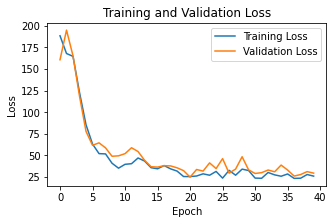

	Layers: 2
        Activation: sigmoid
        Regularisation: l2
        Epochs: 40
        Learning Rate: 0.3
        Test Loss: 21.7285099029541
        Test RMSE: 2.139031410217285





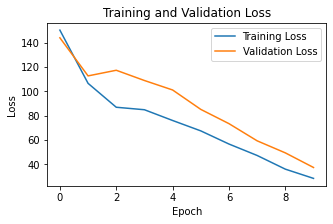

	Layers: 2
        Activation: sigmoid
        Regularisation: l2
        Epochs: 10
        Learning Rate: 0.1
        Test Loss: 22.290985107421875
        Test RMSE: 3.360586166381836





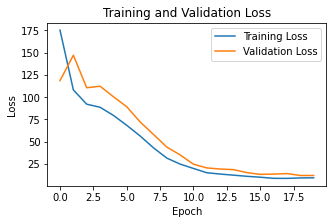

	Layers: 2
        Activation: sigmoid
        Regularisation: l2
        Epochs: 20
        Learning Rate: 0.1
        Test Loss: 6.314822673797607
        Test RMSE: 1.7294565439224243





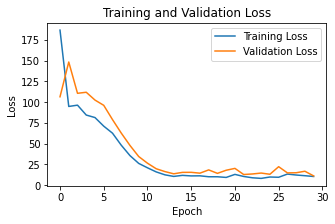

	Layers: 2
        Activation: sigmoid
        Regularisation: l2
        Epochs: 30
        Learning Rate: 0.1
        Test Loss: 6.9984130859375
        Test RMSE: 1.4129974842071533





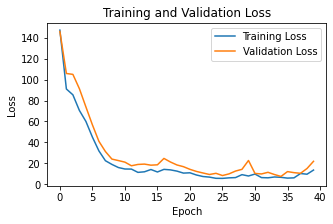

	Layers: 2
        Activation: sigmoid
        Regularisation: l2
        Epochs: 40
        Learning Rate: 0.1
        Test Loss: 16.816064834594727
        Test RMSE: 3.6233668327331543





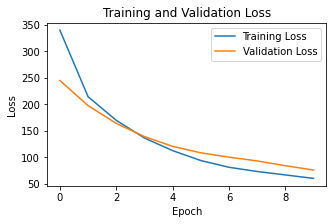

	Layers: 2
        Activation: sigmoid
        Regularisation: l2
        Epochs: 10
        Learning Rate: 0.01
        Test Loss: 64.27377319335938
        Test RMSE: 7.847955703735352





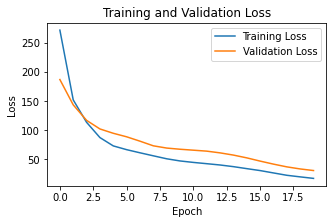

	Layers: 2
        Activation: sigmoid
        Regularisation: l2
        Epochs: 20
        Learning Rate: 0.01
        Test Loss: 19.082969665527344
        Test RMSE: 3.9395501613616943





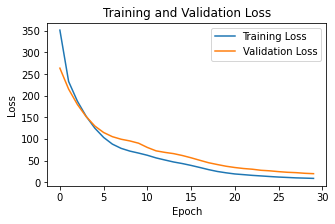

	Layers: 2
        Activation: sigmoid
        Regularisation: l2
        Epochs: 30
        Learning Rate: 0.01
        Test Loss: 10.287091255187988
        Test RMSE: 2.786839723587036





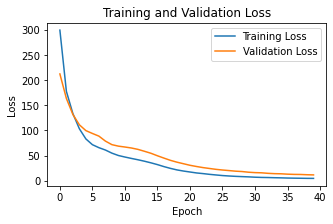

	Layers: 2
        Activation: sigmoid
        Regularisation: l2
        Epochs: 40
        Learning Rate: 0.01
        Test Loss: 4.829869270324707
        Test RMSE: 1.7025891542434692





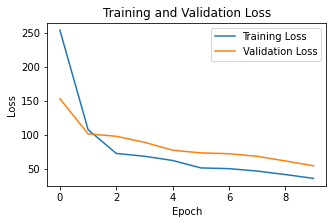

	Layers: 2
        Activation: sigmoid
        Regularisation: l2
        Epochs: 10
        Learning Rate: 0.03
        Test Loss: 35.8732795715332
        Test RMSE: 5.364567756652832





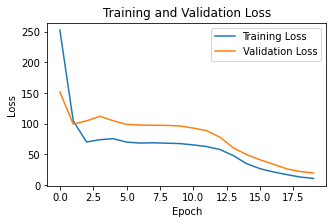

	Layers: 2
        Activation: sigmoid
        Regularisation: l2
        Epochs: 20
        Learning Rate: 0.03
        Test Loss: 9.72952938079834
        Test RMSE: 2.3412580490112305





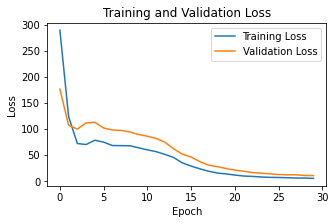

	Layers: 2
        Activation: sigmoid
        Regularisation: l2
        Epochs: 30
        Learning Rate: 0.03
        Test Loss: 4.901366233825684
        Test RMSE: 1.6961275339126587





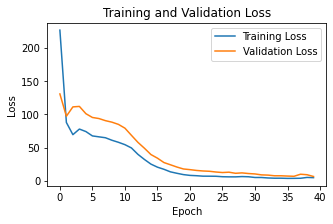

	Layers: 2
        Activation: sigmoid
        Regularisation: l2
        Epochs: 40
        Learning Rate: 0.03
        Test Loss: 3.341181755065918
        Test RMSE: 1.4070982933044434





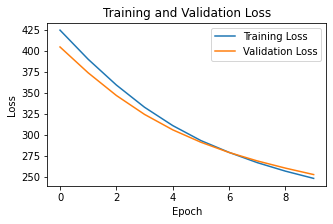

	Layers: 2
        Activation: sigmoid
        Regularisation: l2
        Epochs: 10
        Learning Rate: 0.001
        Test Loss: 264.8495178222656
        Test RMSE: 16.236040115356445





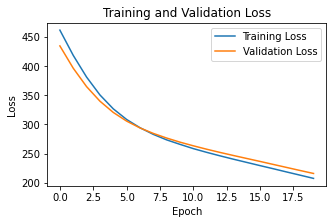

	Layers: 2
        Activation: sigmoid
        Regularisation: l2
        Epochs: 20
        Learning Rate: 0.001
        Test Loss: 224.5128173828125
        Test RMSE: 14.939250946044922





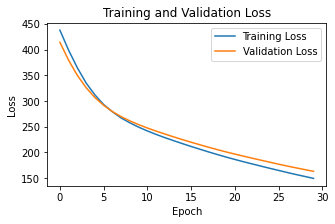

	Layers: 2
        Activation: sigmoid
        Regularisation: l2
        Epochs: 30
        Learning Rate: 0.001
        Test Loss: 164.58485412597656
        Test RMSE: 12.77458667755127





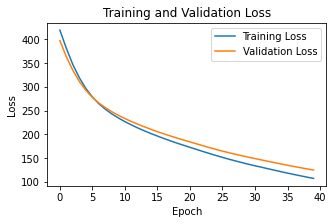

	Layers: 2
        Activation: sigmoid
        Regularisation: l2
        Epochs: 40
        Learning Rate: 0.001
        Test Loss: 120.5707015991211
        Test RMSE: 10.915691375732422





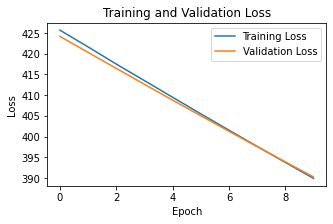

	Layers: 2
        Activation: sigmoid
        Regularisation: l2
        Epochs: 10
        Learning Rate: 0.0001
        Test Loss: 414.06646728515625
        Test RMSE: 20.32157325744629





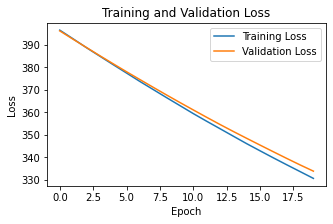

	Layers: 2
        Activation: sigmoid
        Regularisation: l2
        Epochs: 20
        Learning Rate: 0.0001
        Test Loss: 353.3193664550781
        Test RMSE: 18.767330169677734





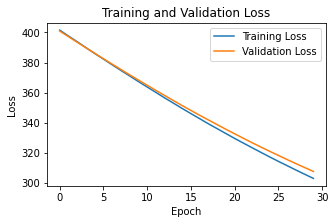

	Layers: 2
        Activation: sigmoid
        Regularisation: l2
        Epochs: 30
        Learning Rate: 0.0001
        Test Loss: 325.02203369140625
        Test RMSE: 17.99742317199707





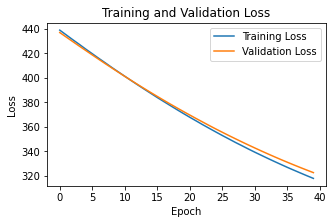

	Layers: 2
        Activation: sigmoid
        Regularisation: l2
        Epochs: 40
        Learning Rate: 0.0001
        Test Loss: 340.9671325683594
        Test RMSE: 18.434606552124023





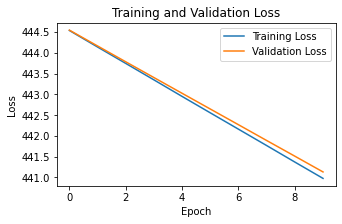

	Layers: 2
        Activation: sigmoid
        Regularisation: l2
        Epochs: 10
        Learning Rate: 1e-05
        Test Loss: 468.0164489746094
        Test RMSE: 21.608219146728516





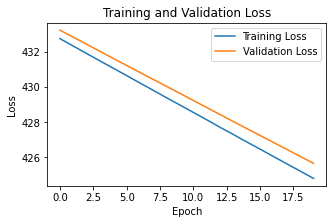

	Layers: 2
        Activation: sigmoid
        Regularisation: l2
        Epochs: 20
        Learning Rate: 1e-05
        Test Loss: 451.54791259765625
        Test RMSE: 21.223806381225586





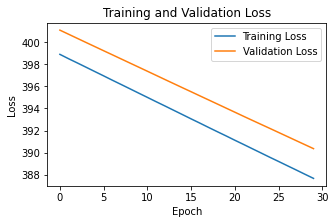

	Layers: 2
        Activation: sigmoid
        Regularisation: l2
        Epochs: 30
        Learning Rate: 1e-05
        Test Loss: 413.81280517578125
        Test RMSE: 20.31525230407715





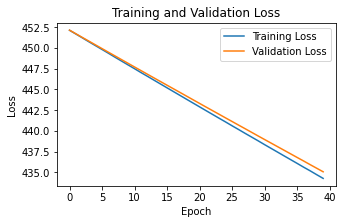

	Layers: 2
        Activation: sigmoid
        Regularisation: l2
        Epochs: 40
        Learning Rate: 1e-05
        Test Loss: 461.30169677734375
        Test RMSE: 21.45211410522461





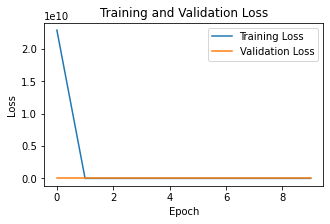

	Layers: 3
        Activation: relu
        Regularisation: None
        Epochs: 10
        Learning Rate: 1
        Test Loss: 660.06591796875
        Test RMSE: 25.691747665405273





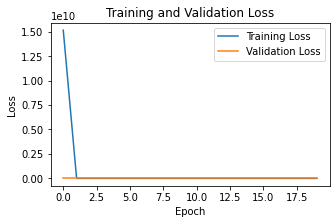

	Layers: 3
        Activation: relu
        Regularisation: None
        Epochs: 20
        Learning Rate: 1
        Test Loss: 5473351.5
        Test RMSE: 2339.51953125





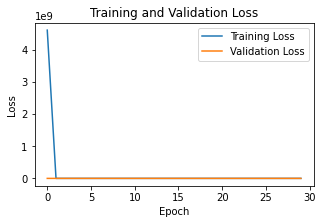

	Layers: 3
        Activation: relu
        Regularisation: None
        Epochs: 30
        Learning Rate: 1
        Test Loss: 71.62937927246094
        Test RMSE: 8.463414192199707





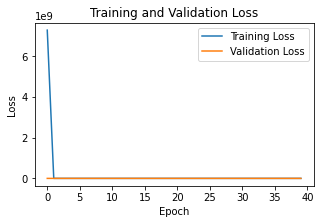

	Layers: 3
        Activation: relu
        Regularisation: None
        Epochs: 40
        Learning Rate: 1
        Test Loss: 645.3856811523438
        Test RMSE: 25.404441833496094





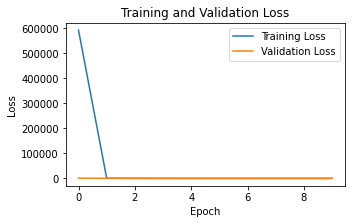

	Layers: 3
        Activation: relu
        Regularisation: None
        Epochs: 10
        Learning Rate: 0.3
        Test Loss: 75.20638275146484
        Test RMSE: 8.672161102294922





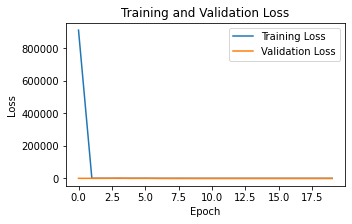

	Layers: 3
        Activation: relu
        Regularisation: None
        Epochs: 20
        Learning Rate: 0.3
        Test Loss: 71.7514419555664
        Test RMSE: 8.470622062683105





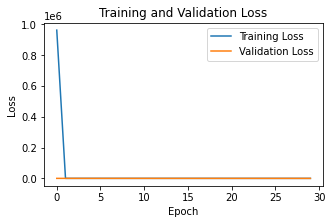

	Layers: 3
        Activation: relu
        Regularisation: None
        Epochs: 30
        Learning Rate: 0.3
        Test Loss: 345.82568359375
        Test RMSE: 18.596389770507812





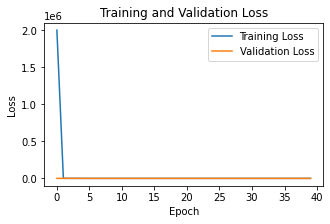

	Layers: 3
        Activation: relu
        Regularisation: None
        Epochs: 40
        Learning Rate: 0.3
        Test Loss: 71.6777572631836
        Test RMSE: 8.46627140045166





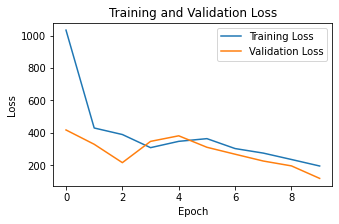

	Layers: 3
        Activation: relu
        Regularisation: None
        Epochs: 10
        Learning Rate: 0.1
        Test Loss: 141.07763671875
        Test RMSE: 11.87761116027832





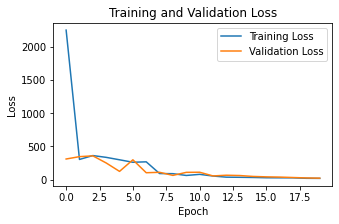

	Layers: 3
        Activation: relu
        Regularisation: None
        Epochs: 20
        Learning Rate: 0.1
        Test Loss: 11.975654602050781
        Test RMSE: 3.460585832595825





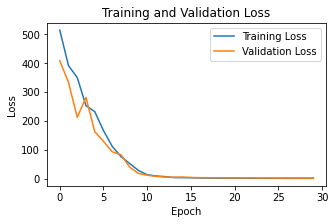

	Layers: 3
        Activation: relu
        Regularisation: None
        Epochs: 30
        Learning Rate: 0.1
        Test Loss: 1.2854090929031372
        Test RMSE: 1.133758783340454





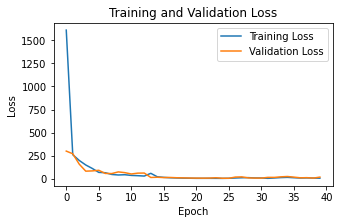

	Layers: 3
        Activation: relu
        Regularisation: None
        Epochs: 40
        Learning Rate: 0.1
        Test Loss: 19.7514705657959
        Test RMSE: 4.444262504577637





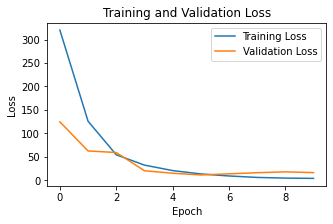

	Layers: 3
        Activation: relu
        Regularisation: None
        Epochs: 10
        Learning Rate: 0.01
        Test Loss: 5.733270168304443
        Test RMSE: 2.3944249153137207





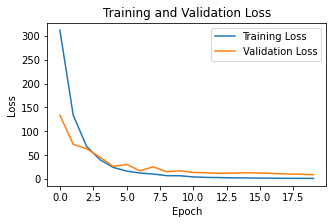

	Layers: 3
        Activation: relu
        Regularisation: None
        Epochs: 20
        Learning Rate: 0.01
        Test Loss: 2.725240707397461
        Test RMSE: 1.6508302688598633





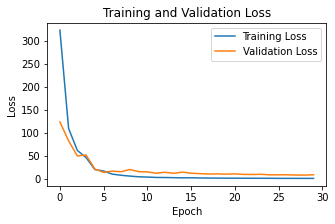

	Layers: 3
        Activation: relu
        Regularisation: None
        Epochs: 30
        Learning Rate: 0.01
        Test Loss: 3.109368085861206
        Test RMSE: 1.7633399963378906





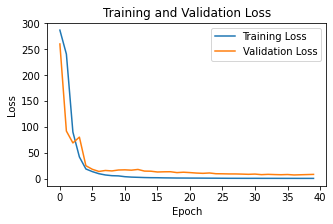

	Layers: 3
        Activation: relu
        Regularisation: None
        Epochs: 40
        Learning Rate: 0.01
        Test Loss: 2.233956813812256
        Test RMSE: 1.494642734527588





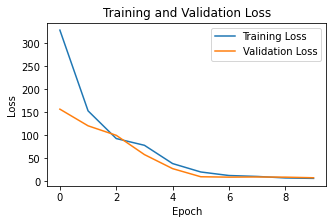

	Layers: 3
        Activation: relu
        Regularisation: None
        Epochs: 10
        Learning Rate: 0.03
        Test Loss: 5.6086812019348145
        Test RMSE: 2.3682656288146973





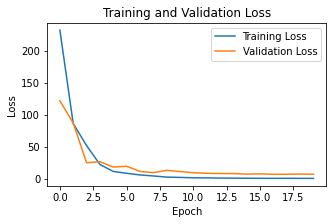

	Layers: 3
        Activation: relu
        Regularisation: None
        Epochs: 20
        Learning Rate: 0.03
        Test Loss: 1.920032262802124
        Test RMSE: 1.3856523036956787





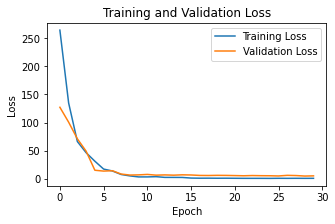

	Layers: 3
        Activation: relu
        Regularisation: None
        Epochs: 30
        Learning Rate: 0.03
        Test Loss: 1.5303527116775513
        Test RMSE: 1.2370742559432983





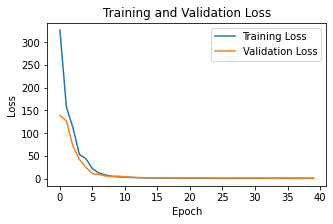

	Layers: 3
        Activation: relu
        Regularisation: None
        Epochs: 40
        Learning Rate: 0.03
        Test Loss: 1.8120578527450562
        Test RMSE: 1.3461270332336426





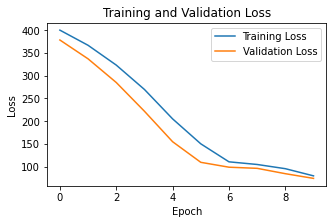

	Layers: 3
        Activation: relu
        Regularisation: None
        Epochs: 10
        Learning Rate: 0.001
        Test Loss: 76.75552368164062
        Test RMSE: 8.761022567749023





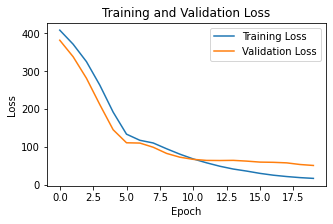

	Layers: 3
        Activation: relu
        Regularisation: None
        Epochs: 20
        Learning Rate: 0.001
        Test Loss: 20.747844696044922
        Test RMSE: 4.554980278015137





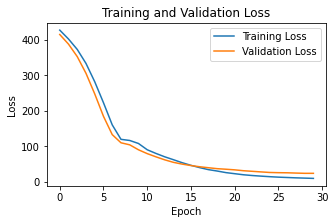

	Layers: 3
        Activation: relu
        Regularisation: None
        Epochs: 30
        Learning Rate: 0.001
        Test Loss: 12.868016242980957
        Test RMSE: 3.5872018337249756





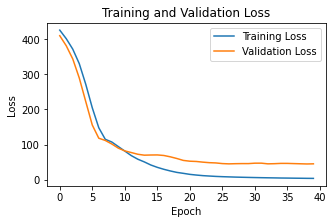

	Layers: 3
        Activation: relu
        Regularisation: None
        Epochs: 40
        Learning Rate: 0.001
        Test Loss: 8.162242889404297
        Test RMSE: 2.856963872909546





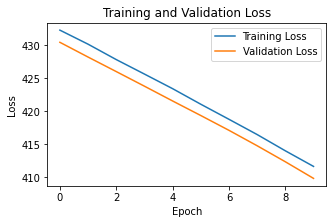

	Layers: 3
        Activation: relu
        Regularisation: None
        Epochs: 10
        Learning Rate: 0.0001
        Test Loss: 438.21942138671875
        Test RMSE: 20.933691024780273





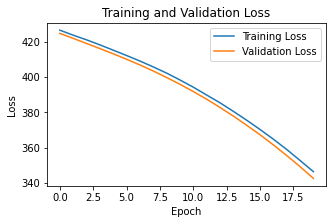

	Layers: 3
        Activation: relu
        Regularisation: None
        Epochs: 20
        Learning Rate: 0.0001
        Test Loss: 376.617431640625
        Test RMSE: 19.406633377075195





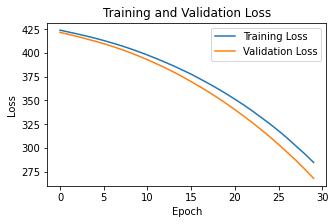

	Layers: 3
        Activation: relu
        Regularisation: None
        Epochs: 30
        Learning Rate: 0.0001
        Test Loss: 307.9795837402344
        Test RMSE: 17.549346923828125





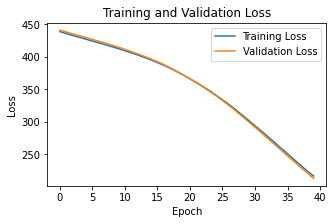

	Layers: 3
        Activation: relu
        Regularisation: None
        Epochs: 40
        Learning Rate: 0.0001
        Test Loss: 248.2765655517578
        Test RMSE: 15.756793975830078





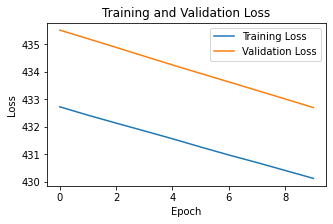

	Layers: 3
        Activation: relu
        Regularisation: None
        Epochs: 10
        Learning Rate: 1e-05
        Test Loss: 460.00396728515625
        Test RMSE: 21.447702407836914





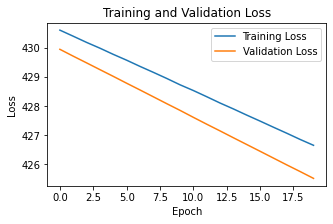

	Layers: 3
        Activation: relu
        Regularisation: None
        Epochs: 20
        Learning Rate: 1e-05
        Test Loss: 453.1709899902344
        Test RMSE: 21.287813186645508





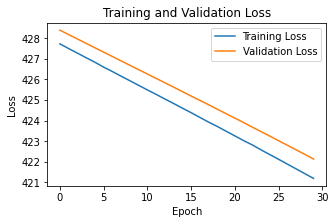

	Layers: 3
        Activation: relu
        Regularisation: None
        Epochs: 30
        Learning Rate: 1e-05
        Test Loss: 450.9230041503906
        Test RMSE: 21.234947204589844





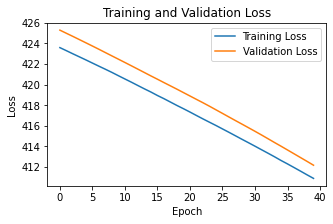

	Layers: 3
        Activation: relu
        Regularisation: None
        Epochs: 40
        Learning Rate: 1e-05
        Test Loss: 437.74029541015625
        Test RMSE: 20.922243118286133





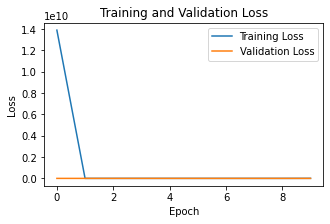

	Layers: 3
        Activation: relu
        Regularisation: l1
        Epochs: 10
        Learning Rate: 1
        Test Loss: 541.28564453125
        Test RMSE: 8.988178253173828





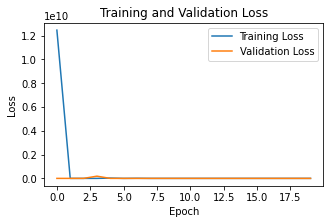

	Layers: 3
        Activation: relu
        Regularisation: l1
        Epochs: 20
        Learning Rate: 1
        Test Loss: 1175.9315185546875
        Test RMSE: 25.835508346557617





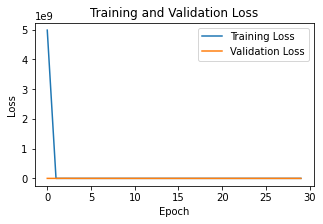

	Layers: 3
        Activation: relu
        Regularisation: l1
        Epochs: 30
        Learning Rate: 1
        Test Loss: 1024.029052734375
        Test RMSE: 25.67901039123535





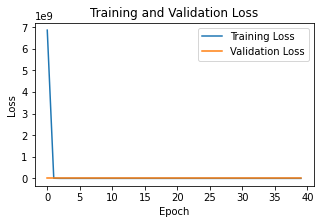

	Layers: 3
        Activation: relu
        Regularisation: l1
        Epochs: 40
        Learning Rate: 1
        Test Loss: 993.5446166992188
        Test RMSE: 25.590190887451172





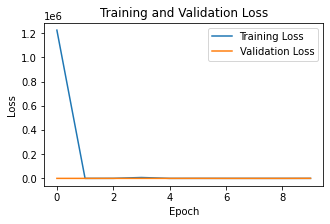

	Layers: 3
        Activation: relu
        Regularisation: l1
        Epochs: 10
        Learning Rate: 0.3
        Test Loss: 985.9606323242188
        Test RMSE: 29.393646240234375





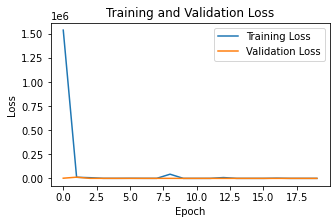

	Layers: 3
        Activation: relu
        Regularisation: l1
        Epochs: 20
        Learning Rate: 0.3
        Test Loss: 390.8466491699219
        Test RMSE: 15.782486915588379





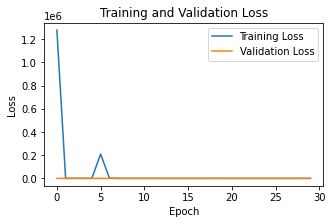

	Layers: 3
        Activation: relu
        Regularisation: l1
        Epochs: 30
        Learning Rate: 0.3
        Test Loss: 536.6806030273438
        Test RMSE: 19.19083023071289





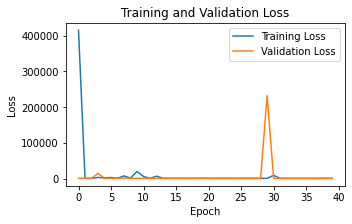

	Layers: 3
        Activation: relu
        Regularisation: l1
        Epochs: 40
        Learning Rate: 0.3
        Test Loss: 373.7132568359375
        Test RMSE: 14.318958282470703





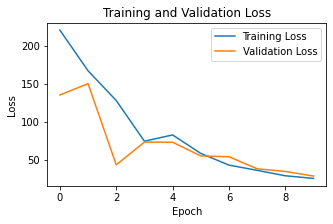

	Layers: 3
        Activation: relu
        Regularisation: l1
        Epochs: 10
        Learning Rate: 0.1
        Test Loss: 23.838184356689453
        Test RMSE: 1.9804893732070923





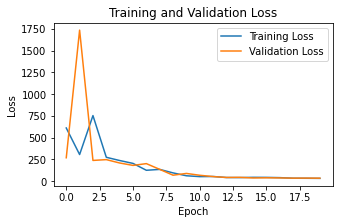

	Layers: 3
        Activation: relu
        Regularisation: l1
        Epochs: 20
        Learning Rate: 0.1
        Test Loss: 34.95148849487305
        Test RMSE: 2.1131350994110107





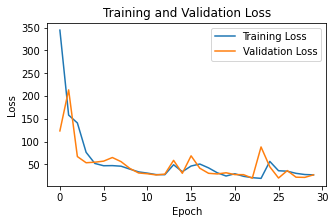

	Layers: 3
        Activation: relu
        Regularisation: l1
        Epochs: 30
        Learning Rate: 0.1
        Test Loss: 27.365047454833984
        Test RMSE: 3.7079291343688965





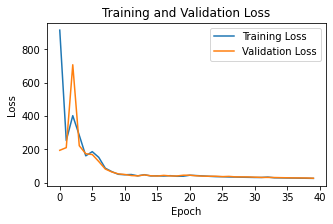

	Layers: 3
        Activation: relu
        Regularisation: l1
        Epochs: 40
        Learning Rate: 0.1
        Test Loss: 26.289621353149414
        Test RMSE: 1.556522011756897





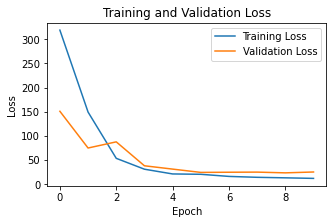

	Layers: 3
        Activation: relu
        Regularisation: l1
        Epochs: 10
        Learning Rate: 0.01
        Test Loss: 14.718883514404297
        Test RMSE: 2.4678266048431396





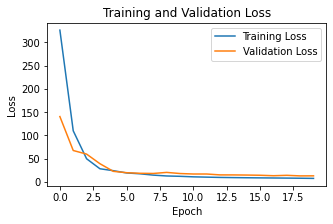

	Layers: 3
        Activation: relu
        Regularisation: l1
        Epochs: 20
        Learning Rate: 0.01
        Test Loss: 9.73050594329834
        Test RMSE: 1.7033777236938477





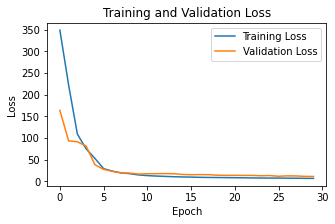

	Layers: 3
        Activation: relu
        Regularisation: l1
        Epochs: 30
        Learning Rate: 0.01
        Test Loss: 8.577000617980957
        Test RMSE: 1.6167538166046143





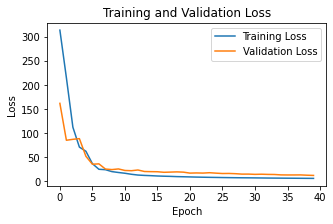

	Layers: 3
        Activation: relu
        Regularisation: l1
        Epochs: 40
        Learning Rate: 0.01
        Test Loss: 8.185616493225098
        Test RMSE: 1.5364071130752563





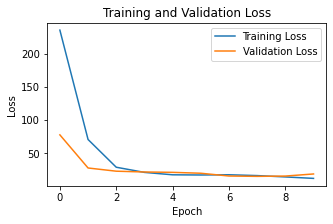

	Layers: 3
        Activation: relu
        Regularisation: l1
        Epochs: 10
        Learning Rate: 0.03
        Test Loss: 14.365161895751953
        Test RMSE: 2.240532875061035





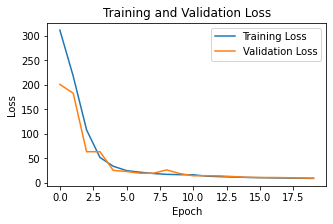

	Layers: 3
        Activation: relu
        Regularisation: l1
        Epochs: 20
        Learning Rate: 0.03
        Test Loss: 9.531465530395508
        Test RMSE: 1.3556936979293823





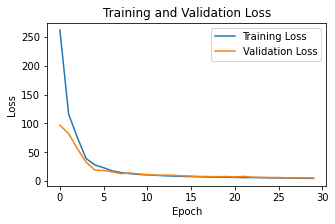

	Layers: 3
        Activation: relu
        Regularisation: l1
        Epochs: 30
        Learning Rate: 0.03
        Test Loss: 5.15974235534668
        Test RMSE: 1.083194613456726





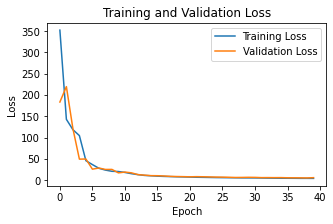

	Layers: 3
        Activation: relu
        Regularisation: l1
        Epochs: 40
        Learning Rate: 0.03
        Test Loss: 4.703067779541016
        Test RMSE: 1.0893216133117676





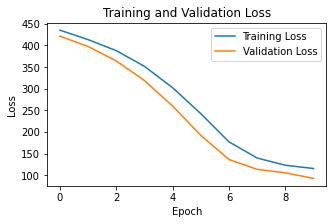

	Layers: 3
        Activation: relu
        Regularisation: l1
        Epochs: 10
        Learning Rate: 0.001
        Test Loss: 104.3653793334961
        Test RMSE: 9.629632949829102





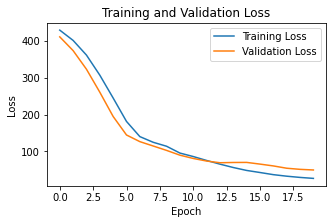

	Layers: 3
        Activation: relu
        Regularisation: l1
        Epochs: 20
        Learning Rate: 0.001
        Test Loss: 29.896568298339844
        Test RMSE: 4.371192932128906





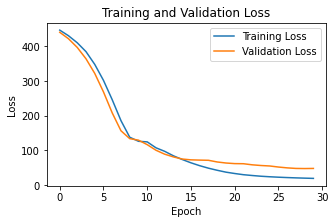

	Layers: 3
        Activation: relu
        Regularisation: l1
        Epochs: 30
        Learning Rate: 0.001
        Test Loss: 23.195220947265625
        Test RMSE: 3.571096181869507





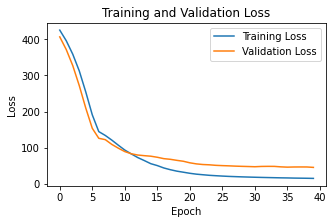

	Layers: 3
        Activation: relu
        Regularisation: l1
        Epochs: 40
        Learning Rate: 0.001
        Test Loss: 19.713356018066406
        Test RMSE: 3.0538108348846436





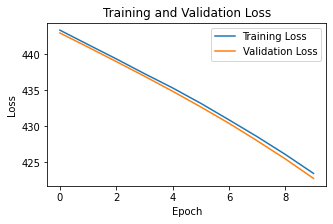

	Layers: 3
        Activation: relu
        Regularisation: l1
        Epochs: 10
        Learning Rate: 0.0001
        Test Loss: 450.059326171875
        Test RMSE: 20.9406681060791





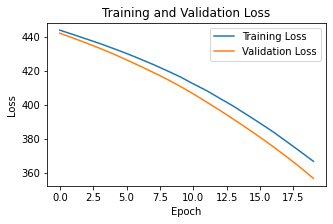

	Layers: 3
        Activation: relu
        Regularisation: l1
        Epochs: 20
        Learning Rate: 0.0001
        Test Loss: 392.4060974121094
        Test RMSE: 19.513795852661133





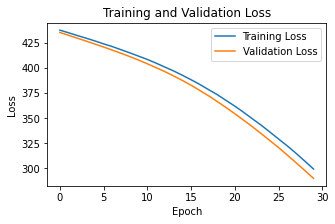

	Layers: 3
        Activation: relu
        Regularisation: l1
        Epochs: 30
        Learning Rate: 0.0001
        Test Loss: 325.5545959472656
        Test RMSE: 17.72028160095215





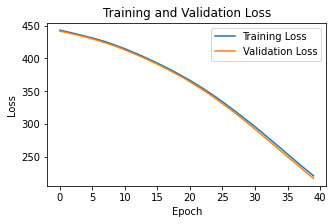

	Layers: 3
        Activation: relu
        Regularisation: l1
        Epochs: 40
        Learning Rate: 0.0001
        Test Loss: 253.44448852539062
        Test RMSE: 15.54979133605957





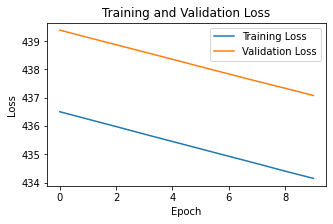

	Layers: 3
        Activation: relu
        Regularisation: l1
        Epochs: 10
        Learning Rate: 1e-05
        Test Loss: 461.635009765625
        Test RMSE: 21.212356567382812





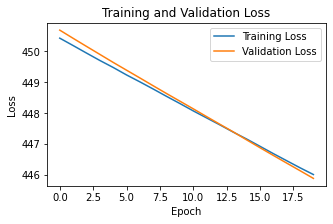

	Layers: 3
        Activation: relu
        Regularisation: l1
        Epochs: 20
        Learning Rate: 1e-05
        Test Loss: 473.5240478515625
        Test RMSE: 21.49347496032715





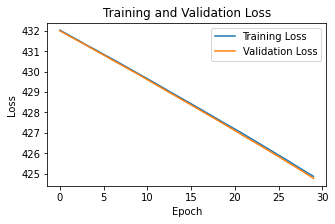

	Layers: 3
        Activation: relu
        Regularisation: l1
        Epochs: 30
        Learning Rate: 1e-05
        Test Loss: 454.2738952636719
        Test RMSE: 21.039897918701172





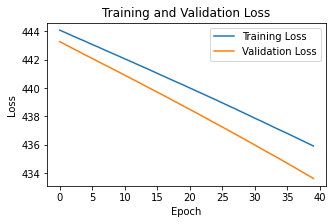

	Layers: 3
        Activation: relu
        Regularisation: l1
        Epochs: 40
        Learning Rate: 1e-05
        Test Loss: 463.122802734375
        Test RMSE: 21.24832534790039





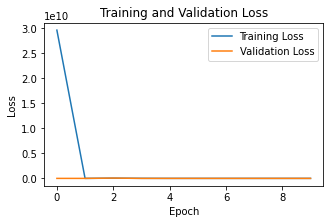

	Layers: 3
        Activation: relu
        Regularisation: l2
        Epochs: 10
        Learning Rate: 1
        Test Loss: 2754.2392578125
        Test RMSE: 11.061649322509766





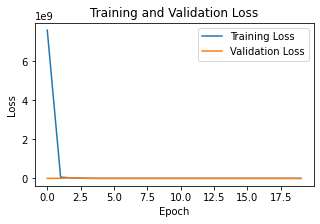

	Layers: 3
        Activation: relu
        Regularisation: l2
        Epochs: 20
        Learning Rate: 1
        Test Loss: 3342.0302734375
        Test RMSE: 26.529630661010742





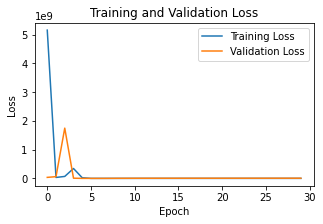

	Layers: 3
        Activation: relu
        Regularisation: l2
        Epochs: 30
        Learning Rate: 1
        Test Loss: 10245969.0
        Test RMSE: 3200.588623046875





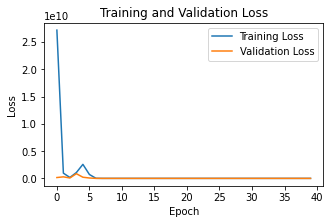

	Layers: 3
        Activation: relu
        Regularisation: l2
        Epochs: 40
        Learning Rate: 1
        Test Loss: 3560.380859375
        Test RMSE: 31.405086517333984





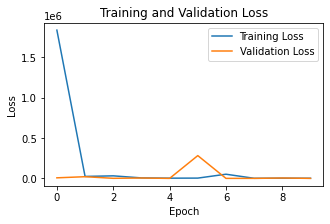

	Layers: 3
        Activation: relu
        Regularisation: l2
        Epochs: 10
        Learning Rate: 0.3
        Test Loss: 659.8243408203125
        Test RMSE: 21.160329818725586





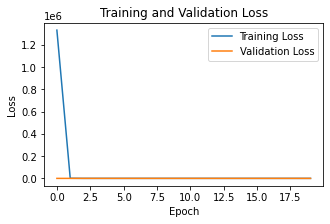

	Layers: 3
        Activation: relu
        Regularisation: l2
        Epochs: 20
        Learning Rate: 0.3
        Test Loss: 574.6570434570312
        Test RMSE: 20.788265228271484





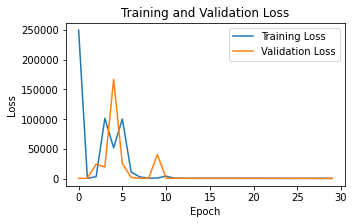

	Layers: 3
        Activation: relu
        Regularisation: l2
        Epochs: 30
        Learning Rate: 0.3
        Test Loss: 467.8287353515625
        Test RMSE: 16.54200553894043





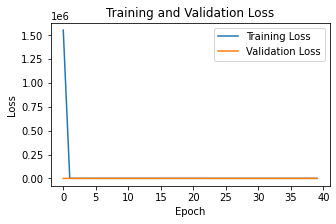

	Layers: 3
        Activation: relu
        Regularisation: l2
        Epochs: 40
        Learning Rate: 0.3
        Test Loss: 473.74151611328125
        Test RMSE: 17.872474670410156





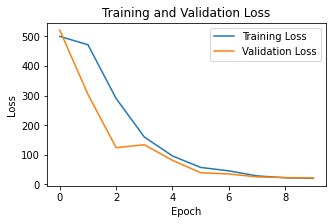

	Layers: 3
        Activation: relu
        Regularisation: l2
        Epochs: 10
        Learning Rate: 0.1
        Test Loss: 19.609895706176758
        Test RMSE: 2.3596930503845215





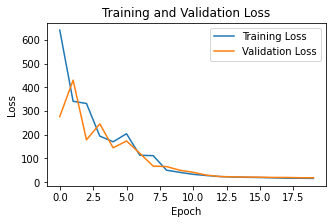

	Layers: 3
        Activation: relu
        Regularisation: l2
        Epochs: 20
        Learning Rate: 0.1
        Test Loss: 17.727975845336914
        Test RMSE: 2.300588607788086





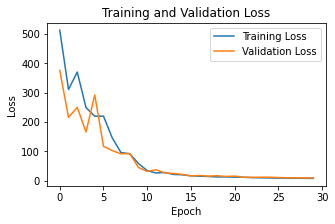

	Layers: 3
        Activation: relu
        Regularisation: l2
        Epochs: 30
        Learning Rate: 0.1
        Test Loss: 8.618854522705078
        Test RMSE: 1.212668538093567





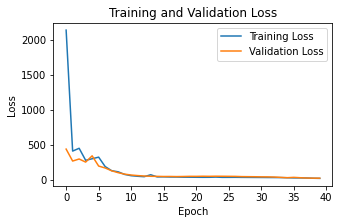

	Layers: 3
        Activation: relu
        Regularisation: l2
        Epochs: 40
        Learning Rate: 0.1
        Test Loss: 20.27294921875
        Test RMSE: 2.596996545791626





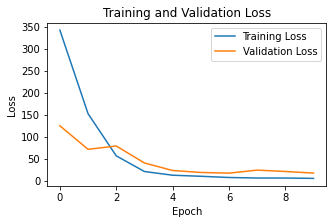

	Layers: 3
        Activation: relu
        Regularisation: l2
        Epochs: 10
        Learning Rate: 0.01
        Test Loss: 7.7433013916015625
        Test RMSE: 2.4675638675689697





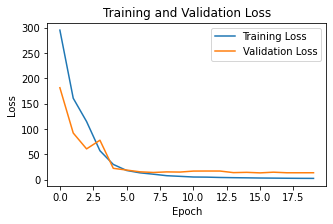

	Layers: 3
        Activation: relu
        Regularisation: l2
        Epochs: 20
        Learning Rate: 0.01
        Test Loss: 5.267376899719238
        Test RMSE: 1.9494377374649048





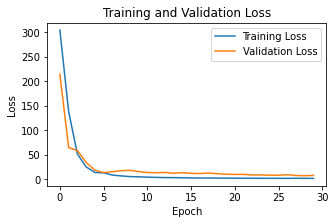

	Layers: 3
        Activation: relu
        Regularisation: l2
        Epochs: 30
        Learning Rate: 0.01
        Test Loss: 3.36073899269104
        Test RMSE: 1.4636316299438477





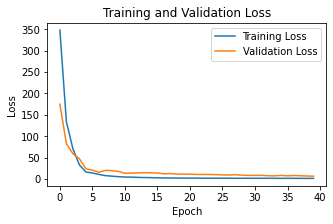

	Layers: 3
        Activation: relu
        Regularisation: l2
        Epochs: 40
        Learning Rate: 0.01
        Test Loss: 3.007025957107544
        Test RMSE: 1.4252852201461792





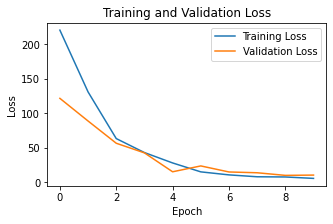

	Layers: 3
        Activation: relu
        Regularisation: l2
        Epochs: 10
        Learning Rate: 0.03
        Test Loss: 7.646153450012207
        Test RMSE: 2.327444076538086





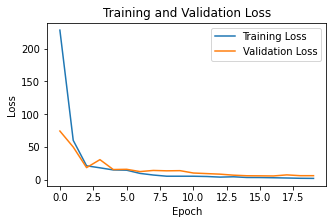

	Layers: 3
        Activation: relu
        Regularisation: l2
        Epochs: 20
        Learning Rate: 0.03
        Test Loss: 3.4071462154388428
        Test RMSE: 1.384735107421875





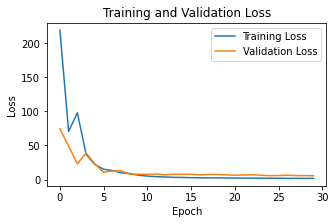

	Layers: 3
        Activation: relu
        Regularisation: l2
        Epochs: 30
        Learning Rate: 0.03
        Test Loss: 3.1429500579833984
        Test RMSE: 1.3632603883743286





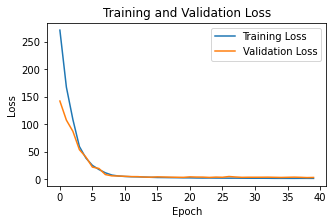

	Layers: 3
        Activation: relu
        Regularisation: l2
        Epochs: 40
        Learning Rate: 0.03
        Test Loss: 2.9411652088165283
        Test RMSE: 1.2650295495986938





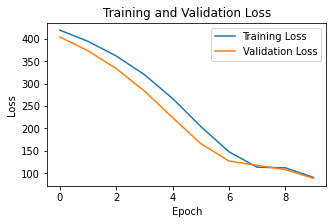

	Layers: 3
        Activation: relu
        Regularisation: l2
        Epochs: 10
        Learning Rate: 0.001
        Test Loss: 79.5242691040039
        Test RMSE: 8.826374053955078





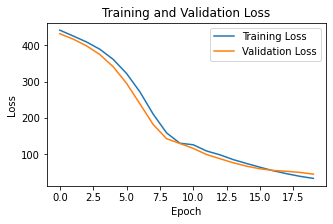

	Layers: 3
        Activation: relu
        Regularisation: l2
        Epochs: 20
        Learning Rate: 0.001
        Test Loss: 39.122859954833984
        Test RMSE: 6.120431423187256





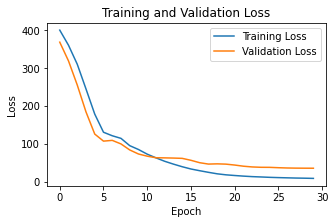

	Layers: 3
        Activation: relu
        Regularisation: l2
        Epochs: 30
        Learning Rate: 0.001
        Test Loss: 14.501850128173828
        Test RMSE: 3.584782123565674





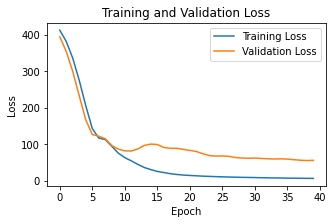

	Layers: 3
        Activation: relu
        Regularisation: l2
        Epochs: 40
        Learning Rate: 0.001
        Test Loss: 11.258848190307617
        Test RMSE: 3.1093974113464355





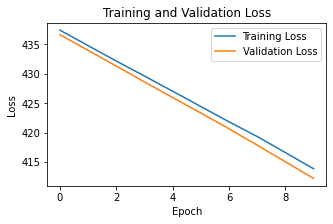

	Layers: 3
        Activation: relu
        Regularisation: l2
        Epochs: 10
        Learning Rate: 0.0001
        Test Loss: 442.9991149902344
        Test RMSE: 21.011070251464844





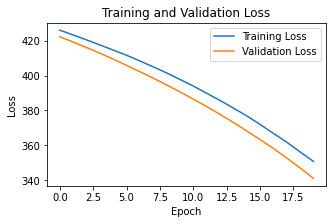

	Layers: 3
        Activation: relu
        Regularisation: l2
        Epochs: 20
        Learning Rate: 0.0001
        Test Loss: 378.0961608886719
        Test RMSE: 19.405433654785156





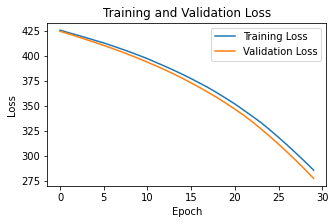

	Layers: 3
        Activation: relu
        Regularisation: l2
        Epochs: 30
        Learning Rate: 0.0001
        Test Loss: 311.0701904296875
        Test RMSE: 17.592771530151367





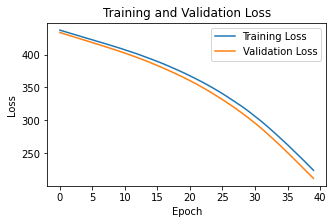

	Layers: 3
        Activation: relu
        Regularisation: l2
        Epochs: 40
        Learning Rate: 0.0001
        Test Loss: 250.7577667236328
        Test RMSE: 15.785431861877441





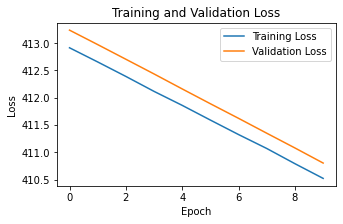

	Layers: 3
        Activation: relu
        Regularisation: l2
        Epochs: 10
        Learning Rate: 1e-05
        Test Loss: 439.8337707519531
        Test RMSE: 20.935617446899414





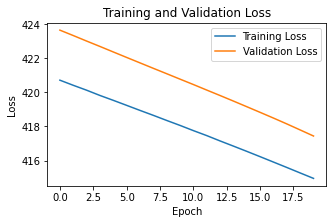

	Layers: 3
        Activation: relu
        Regularisation: l2
        Epochs: 20
        Learning Rate: 1e-05
        Test Loss: 445.470703125
        Test RMSE: 21.069978713989258





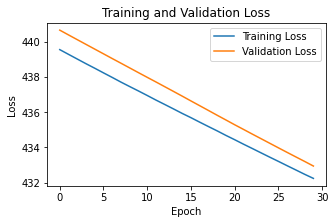

	Layers: 3
        Activation: relu
        Regularisation: l2
        Epochs: 30
        Learning Rate: 1e-05
        Test Loss: 460.10711669921875
        Test RMSE: 21.414085388183594





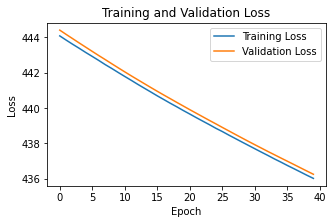

	Layers: 3
        Activation: relu
        Regularisation: l2
        Epochs: 40
        Learning Rate: 1e-05
        Test Loss: 462.3504333496094
        Test RMSE: 21.466175079345703





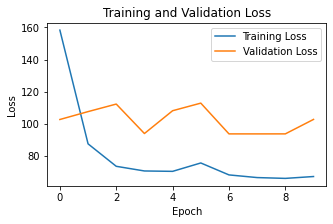

	Layers: 3
        Activation: sigmoid
        Regularisation: None
        Epochs: 10
        Learning Rate: 1
        Test Loss: 74.61351013183594
        Test RMSE: 8.637910842895508





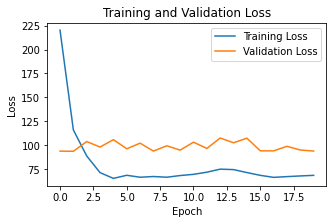

	Layers: 3
        Activation: sigmoid
        Regularisation: None
        Epochs: 20
        Learning Rate: 1
        Test Loss: 72.2106704711914
        Test RMSE: 8.497686386108398





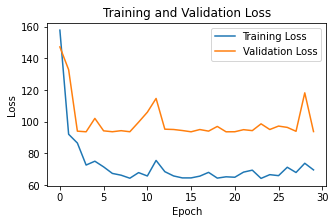

	Layers: 3
        Activation: sigmoid
        Regularisation: None
        Epochs: 30
        Learning Rate: 1
        Test Loss: 72.43619537353516
        Test RMSE: 8.510945320129395





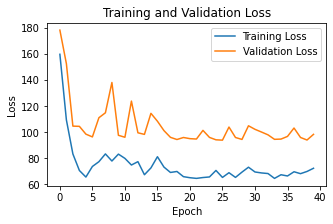

	Layers: 3
        Activation: sigmoid
        Regularisation: None
        Epochs: 40
        Learning Rate: 1
        Test Loss: 83.26679992675781
        Test RMSE: 9.125064849853516





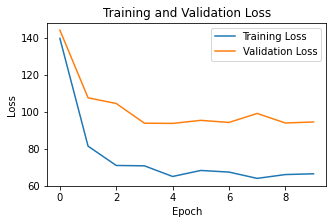

	Layers: 3
        Activation: sigmoid
        Regularisation: None
        Epochs: 10
        Learning Rate: 0.3
        Test Loss: 71.78740692138672
        Test RMSE: 8.472744941711426





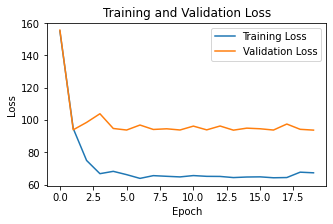

	Layers: 3
        Activation: sigmoid
        Regularisation: None
        Epochs: 20
        Learning Rate: 0.3
        Test Loss: 73.87741088867188
        Test RMSE: 8.595196723937988





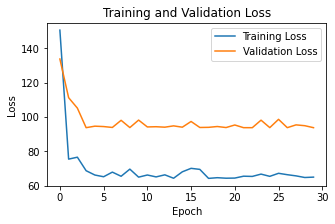

	Layers: 3
        Activation: sigmoid
        Regularisation: None
        Epochs: 30
        Learning Rate: 0.3
        Test Loss: 72.8785171508789
        Test RMSE: 8.53689193725586





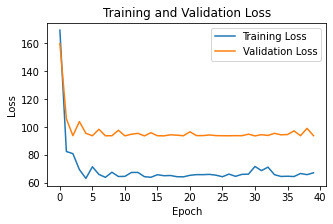

	Layers: 3
        Activation: sigmoid
        Regularisation: None
        Epochs: 40
        Learning Rate: 0.3
        Test Loss: 74.38250732421875
        Test RMSE: 8.624529838562012





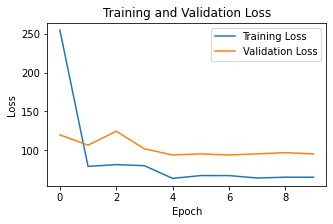

	Layers: 3
        Activation: sigmoid
        Regularisation: None
        Epochs: 10
        Learning Rate: 0.1
        Test Loss: 71.63357543945312
        Test RMSE: 8.463662147521973





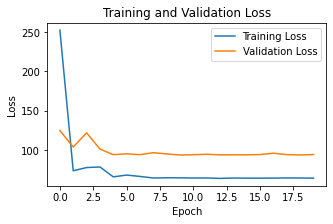

	Layers: 3
        Activation: sigmoid
        Regularisation: None
        Epochs: 20
        Learning Rate: 0.1
        Test Loss: 71.8917465209961
        Test RMSE: 8.478899955749512





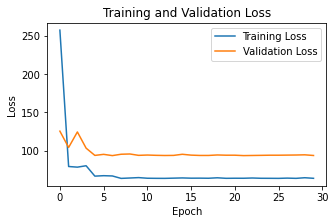

	Layers: 3
        Activation: sigmoid
        Regularisation: None
        Epochs: 30
        Learning Rate: 0.1
        Test Loss: 72.34058380126953
        Test RMSE: 8.505327224731445





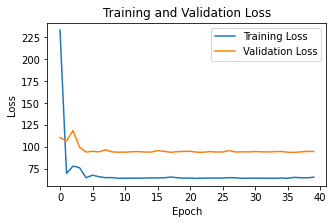

	Layers: 3
        Activation: sigmoid
        Regularisation: None
        Epochs: 40
        Learning Rate: 0.1
        Test Loss: 71.72601318359375
        Test RMSE: 8.469120979309082





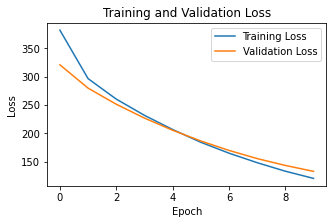

	Layers: 3
        Activation: sigmoid
        Regularisation: None
        Epochs: 10
        Learning Rate: 0.01
        Test Loss: 128.99205017089844
        Test RMSE: 11.357466697692871





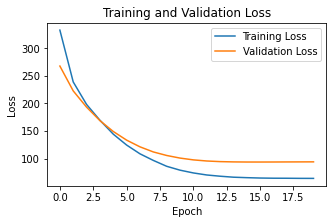

	Layers: 3
        Activation: sigmoid
        Regularisation: None
        Epochs: 20
        Learning Rate: 0.01
        Test Loss: 72.1202163696289
        Test RMSE: 8.492362022399902





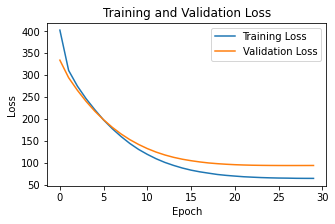

	Layers: 3
        Activation: sigmoid
        Regularisation: None
        Epochs: 30
        Learning Rate: 0.01
        Test Loss: 72.55780029296875
        Test RMSE: 8.518086433410645





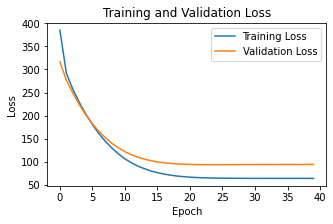

	Layers: 3
        Activation: sigmoid
        Regularisation: None
        Epochs: 40
        Learning Rate: 0.01
        Test Loss: 71.89801025390625
        Test RMSE: 8.479269027709961





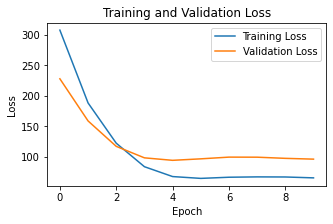

	Layers: 3
        Activation: sigmoid
        Regularisation: None
        Epochs: 10
        Learning Rate: 0.03
        Test Loss: 71.64490509033203
        Test RMSE: 8.46433162689209





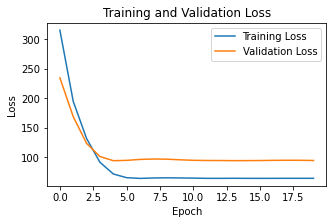

	Layers: 3
        Activation: sigmoid
        Regularisation: None
        Epochs: 20
        Learning Rate: 0.03
        Test Loss: 71.89594268798828
        Test RMSE: 8.479147911071777





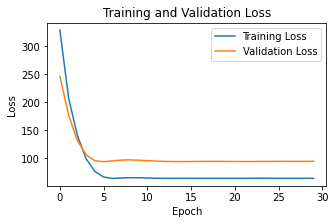

	Layers: 3
        Activation: sigmoid
        Regularisation: None
        Epochs: 30
        Learning Rate: 0.03
        Test Loss: 71.78150939941406
        Test RMSE: 8.472396850585938





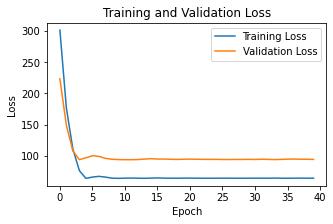

	Layers: 3
        Activation: sigmoid
        Regularisation: None
        Epochs: 40
        Learning Rate: 0.03
        Test Loss: 71.9286880493164
        Test RMSE: 8.481078147888184





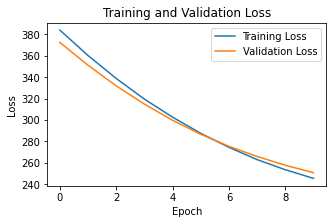

	Layers: 3
        Activation: sigmoid
        Regularisation: None
        Epochs: 10
        Learning Rate: 0.001
        Test Loss: 262.56439208984375
        Test RMSE: 16.203838348388672





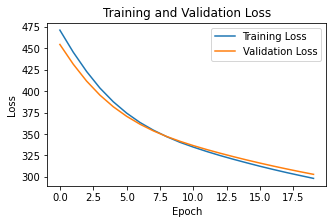

	Layers: 3
        Activation: sigmoid
        Regularisation: None
        Epochs: 20
        Learning Rate: 0.001
        Test Loss: 319.55584716796875
        Test RMSE: 17.87612533569336





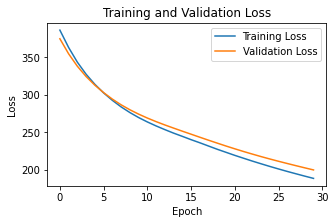

	Layers: 3
        Activation: sigmoid
        Regularisation: None
        Epochs: 30
        Learning Rate: 0.001
        Test Loss: 205.76690673828125
        Test RMSE: 14.34457778930664





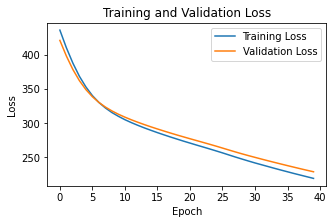

	Layers: 3
        Activation: sigmoid
        Regularisation: None
        Epochs: 40
        Learning Rate: 0.001
        Test Loss: 238.24270629882812
        Test RMSE: 15.435112953186035





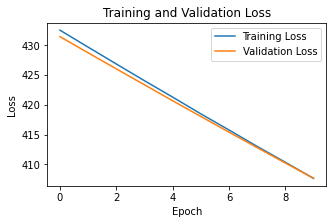

	Layers: 3
        Activation: sigmoid
        Regularisation: None
        Epochs: 10
        Learning Rate: 0.0001
        Test Loss: 432.5646667480469
        Test RMSE: 20.798189163208008





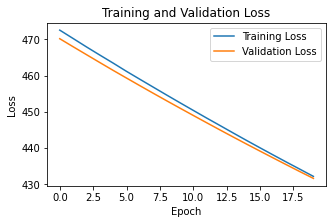

	Layers: 3
        Activation: sigmoid
        Regularisation: None
        Epochs: 20
        Learning Rate: 0.0001
        Test Loss: 458.2952880859375
        Test RMSE: 21.407833099365234





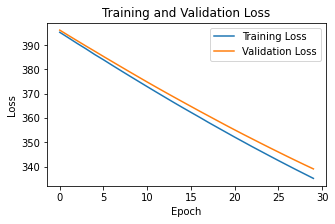

	Layers: 3
        Activation: sigmoid
        Regularisation: None
        Epochs: 30
        Learning Rate: 0.0001
        Test Loss: 358.7815246582031
        Test RMSE: 18.9415283203125





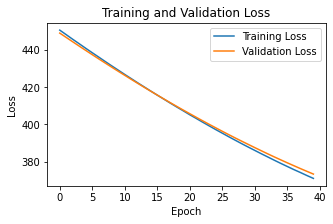

	Layers: 3
        Activation: sigmoid
        Regularisation: None
        Epochs: 40
        Learning Rate: 0.0001
        Test Loss: 395.92529296875
        Test RMSE: 19.897871017456055





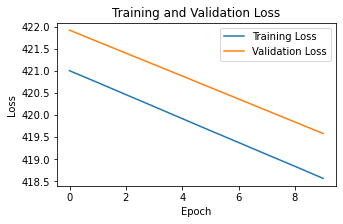

	Layers: 3
        Activation: sigmoid
        Regularisation: None
        Epochs: 10
        Learning Rate: 1e-05
        Test Loss: 445.25848388671875
        Test RMSE: 21.10114860534668





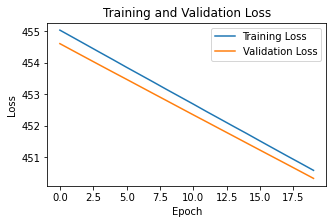

	Layers: 3
        Activation: sigmoid
        Regularisation: None
        Epochs: 20
        Learning Rate: 1e-05
        Test Loss: 478.3115234375
        Test RMSE: 21.87033462524414





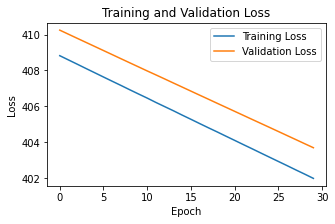

	Layers: 3
        Activation: sigmoid
        Regularisation: None
        Epochs: 30
        Learning Rate: 1e-05
        Test Loss: 428.3166809082031
        Test RMSE: 20.695812225341797





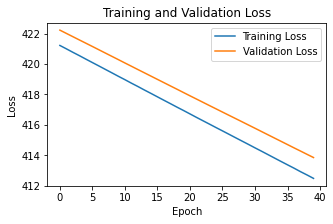

	Layers: 3
        Activation: sigmoid
        Regularisation: None
        Epochs: 40
        Learning Rate: 1e-05
        Test Loss: 439.1625671386719
        Test RMSE: 20.956205368041992





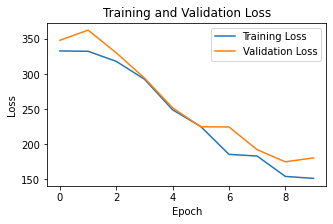

	Layers: 3
        Activation: sigmoid
        Regularisation: l1
        Epochs: 10
        Learning Rate: 1
        Test Loss: 156.39947509765625
        Test RMSE: 8.464574813842773





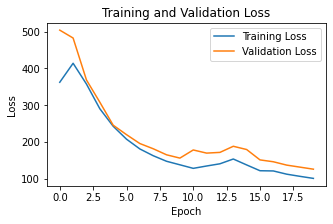

	Layers: 3
        Activation: sigmoid
        Regularisation: l1
        Epochs: 20
        Learning Rate: 1
        Test Loss: 103.97857666015625
        Test RMSE: 8.492642402648926





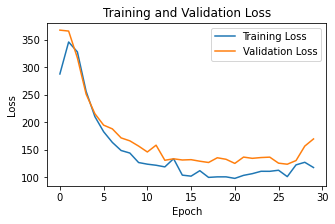

	Layers: 3
        Activation: sigmoid
        Regularisation: l1
        Epochs: 30
        Learning Rate: 1
        Test Loss: 136.08901977539062
        Test RMSE: 9.282708168029785





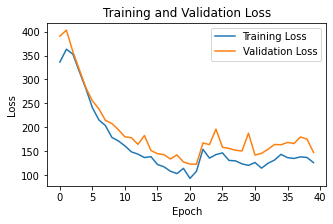

	Layers: 3
        Activation: sigmoid
        Regularisation: l1
        Epochs: 40
        Learning Rate: 1
        Test Loss: 125.13188934326172
        Test RMSE: 8.475929260253906





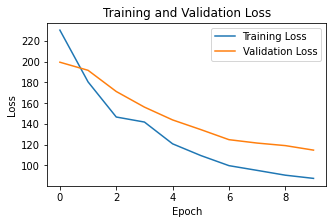

	Layers: 3
        Activation: sigmoid
        Regularisation: l1
        Epochs: 10
        Learning Rate: 0.3
        Test Loss: 92.40973663330078
        Test RMSE: 8.481898307800293





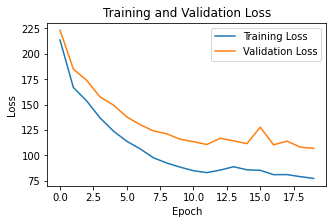

	Layers: 3
        Activation: sigmoid
        Regularisation: l1
        Epochs: 20
        Learning Rate: 0.3
        Test Loss: 83.56639099121094
        Test RMSE: 8.464085578918457





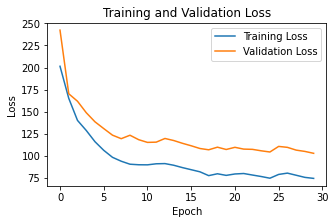

	Layers: 3
        Activation: sigmoid
        Regularisation: l1
        Epochs: 30
        Learning Rate: 0.3
        Test Loss: 81.21112823486328
        Test RMSE: 8.502127647399902





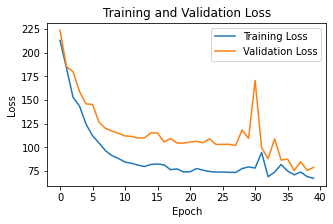

	Layers: 3
        Activation: sigmoid
        Regularisation: l1
        Epochs: 40
        Learning Rate: 0.3
        Test Loss: 68.84371948242188
        Test RMSE: 3.47059965133667





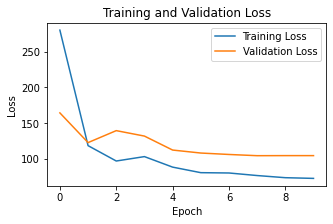

	Layers: 3
        Activation: sigmoid
        Regularisation: l1
        Epochs: 10
        Learning Rate: 0.1
        Test Loss: 88.0988998413086
        Test RMSE: 8.924673080444336





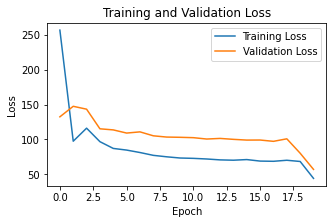

	Layers: 3
        Activation: sigmoid
        Regularisation: l1
        Epochs: 20
        Learning Rate: 0.1
        Test Loss: 45.702667236328125
        Test RMSE: 5.255395889282227





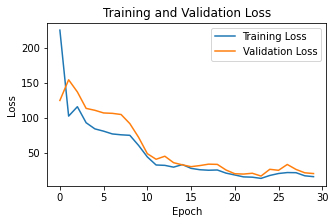

	Layers: 3
        Activation: sigmoid
        Regularisation: l1
        Epochs: 30
        Learning Rate: 0.1
        Test Loss: 14.747138977050781
        Test RMSE: 2.1494715213775635





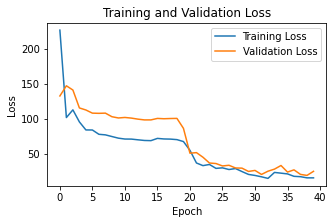

	Layers: 3
        Activation: sigmoid
        Regularisation: l1
        Epochs: 40
        Learning Rate: 0.1
        Test Loss: 18.286806106567383
        Test RMSE: 2.9009816646575928





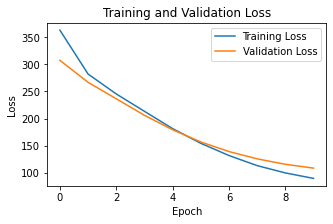

	Layers: 3
        Activation: sigmoid
        Regularisation: l1
        Epochs: 10
        Learning Rate: 0.01
        Test Loss: 96.11656188964844
        Test RMSE: 9.526691436767578





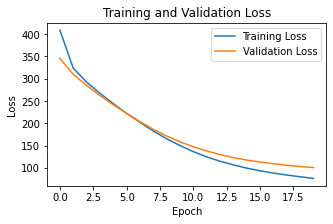

	Layers: 3
        Activation: sigmoid
        Regularisation: l1
        Epochs: 20
        Learning Rate: 0.01
        Test Loss: 85.2909927368164
        Test RMSE: 9.051748275756836





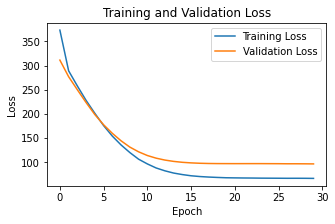

	Layers: 3
        Activation: sigmoid
        Regularisation: l1
        Epochs: 30
        Learning Rate: 0.01
        Test Loss: 74.25379943847656
        Test RMSE: 8.48888111114502





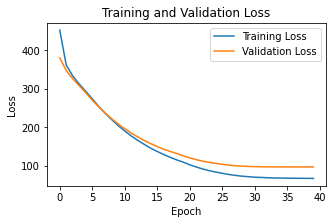

	Layers: 3
        Activation: sigmoid
        Regularisation: l1
        Epochs: 40
        Learning Rate: 0.01
        Test Loss: 74.62799072265625
        Test RMSE: 8.503830909729004





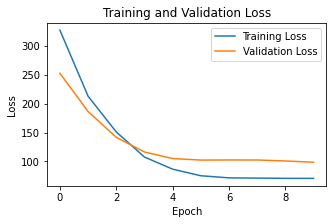

	Layers: 3
        Activation: sigmoid
        Regularisation: l1
        Epochs: 10
        Learning Rate: 0.03
        Test Loss: 78.2804946899414
        Test RMSE: 8.557838439941406





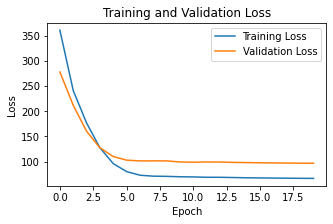

	Layers: 3
        Activation: sigmoid
        Regularisation: l1
        Epochs: 20
        Learning Rate: 0.03
        Test Loss: 74.55242919921875
        Test RMSE: 8.483735084533691





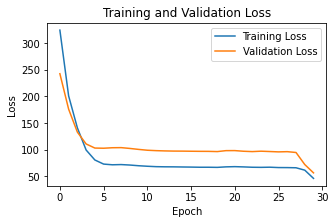

	Layers: 3
        Activation: sigmoid
        Regularisation: l1
        Epochs: 30
        Learning Rate: 0.03
        Test Loss: 42.17509460449219
        Test RMSE: 5.782767295837402





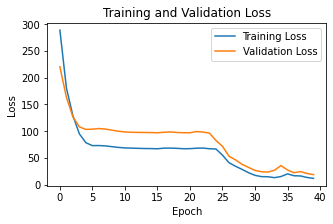

	Layers: 3
        Activation: sigmoid
        Regularisation: l1
        Epochs: 40
        Learning Rate: 0.03
        Test Loss: 9.785333633422852
        Test RMSE: 1.885662317276001





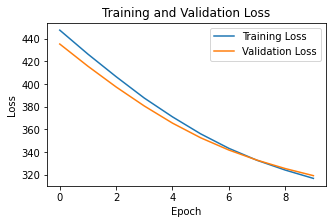

	Layers: 3
        Activation: sigmoid
        Regularisation: l1
        Epochs: 10
        Learning Rate: 0.001
        Test Loss: 336.36279296875
        Test RMSE: 18.034042358398438





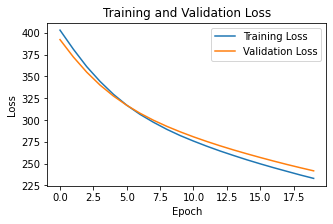

	Layers: 3
        Activation: sigmoid
        Regularisation: l1
        Epochs: 20
        Learning Rate: 0.001
        Test Loss: 251.41383361816406
        Test RMSE: 15.531859397888184





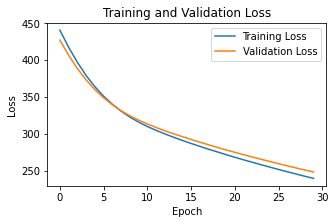

	Layers: 3
        Activation: sigmoid
        Regularisation: l1
        Epochs: 30
        Learning Rate: 0.001
        Test Loss: 258.62994384765625
        Test RMSE: 15.805818557739258





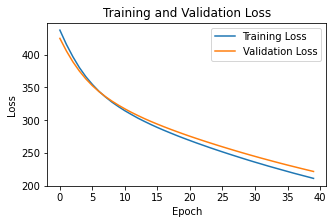

	Layers: 3
        Activation: sigmoid
        Regularisation: l1
        Epochs: 40
        Learning Rate: 0.001
        Test Loss: 229.2382049560547
        Test RMSE: 14.890746116638184





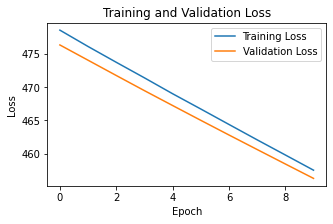

	Layers: 3
        Activation: sigmoid
        Regularisation: l1
        Epochs: 10
        Learning Rate: 0.0001
        Test Loss: 483.7377014160156
        Test RMSE: 21.728796005249023





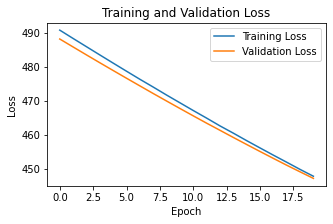

	Layers: 3
        Activation: sigmoid
        Regularisation: l1
        Epochs: 20
        Learning Rate: 0.0001
        Test Loss: 474.01531982421875
        Test RMSE: 21.50510597229004





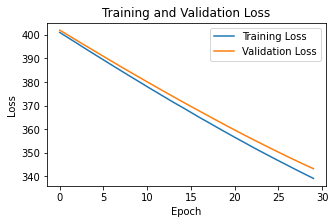

	Layers: 3
        Activation: sigmoid
        Regularisation: l1
        Epochs: 30
        Learning Rate: 0.0001
        Test Loss: 362.41253662109375
        Test RMSE: 18.735769271850586





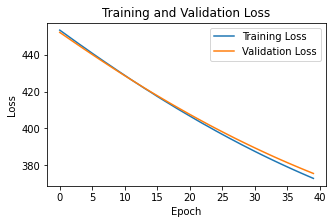

	Layers: 3
        Activation: sigmoid
        Regularisation: l1
        Epochs: 40
        Learning Rate: 0.0001
        Test Loss: 397.4185485839844
        Test RMSE: 19.645048141479492





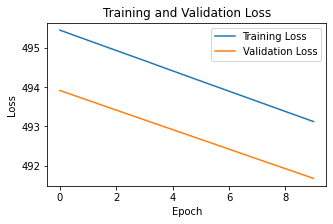

	Layers: 3
        Activation: sigmoid
        Regularisation: l1
        Epochs: 10
        Learning Rate: 1e-05
        Test Loss: 521.5872802734375
        Test RMSE: 22.584903717041016





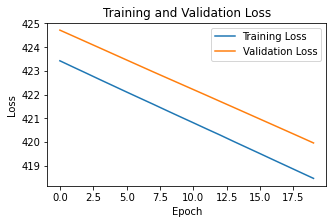

	Layers: 3
        Activation: sigmoid
        Regularisation: l1
        Epochs: 20
        Learning Rate: 1e-05
        Test Loss: 444.97955322265625
        Test RMSE: 20.815547943115234





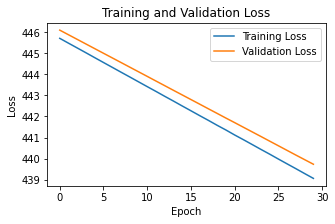

	Layers: 3
        Activation: sigmoid
        Regularisation: l1
        Epochs: 30
        Learning Rate: 1e-05
        Test Loss: 466.1253967285156
        Test RMSE: 21.32065773010254





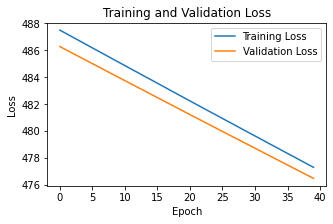

	Layers: 3
        Activation: sigmoid
        Regularisation: l1
        Epochs: 40
        Learning Rate: 1e-05
        Test Loss: 505.3049011230469
        Test RMSE: 22.219423294067383





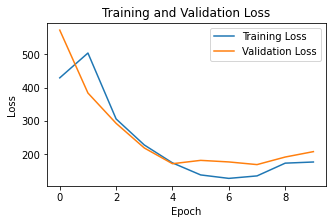

	Layers: 3
        Activation: sigmoid
        Regularisation: l2
        Epochs: 10
        Learning Rate: 1
        Test Loss: 174.65060424804688
        Test RMSE: 9.199403762817383





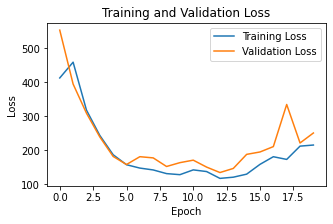

	Layers: 3
        Activation: sigmoid
        Regularisation: l2
        Epochs: 20
        Learning Rate: 1
        Test Loss: 232.3678741455078
        Test RMSE: 8.70223617553711





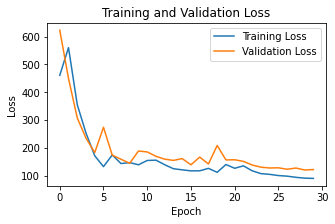

	Layers: 3
        Activation: sigmoid
        Regularisation: l2
        Epochs: 30
        Learning Rate: 1
        Test Loss: 94.7561264038086
        Test RMSE: 8.557793617248535





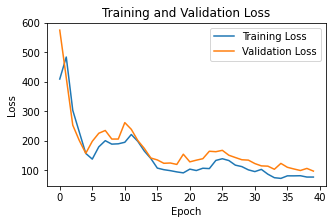

	Layers: 3
        Activation: sigmoid
        Regularisation: l2
        Epochs: 40
        Learning Rate: 1
        Test Loss: 80.93190002441406
        Test RMSE: 8.938247680664062





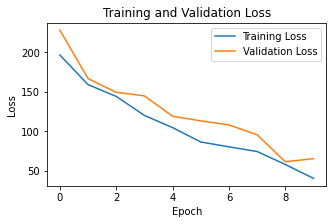

	Layers: 3
        Activation: sigmoid
        Regularisation: l2
        Epochs: 10
        Learning Rate: 0.3
        Test Loss: 47.08552169799805
        Test RMSE: 4.9419846534729





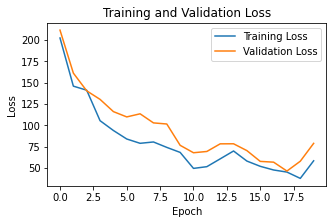

	Layers: 3
        Activation: sigmoid
        Regularisation: l2
        Epochs: 20
        Learning Rate: 0.3
        Test Loss: 63.80990982055664
        Test RMSE: 5.090114116668701





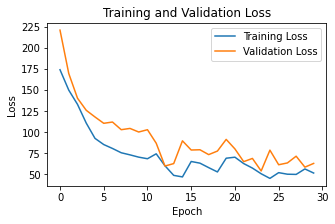

	Layers: 3
        Activation: sigmoid
        Regularisation: l2
        Epochs: 30
        Learning Rate: 0.3
        Test Loss: 54.21288299560547
        Test RMSE: 4.783836841583252





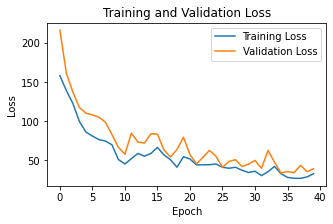

	Layers: 3
        Activation: sigmoid
        Regularisation: l2
        Epochs: 40
        Learning Rate: 0.3
        Test Loss: 28.947246551513672
        Test RMSE: 3.62733793258667





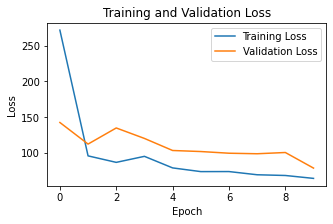

	Layers: 3
        Activation: sigmoid
        Regularisation: l2
        Epochs: 10
        Learning Rate: 0.1
        Test Loss: 60.604923248291016
        Test RMSE: 7.452836990356445





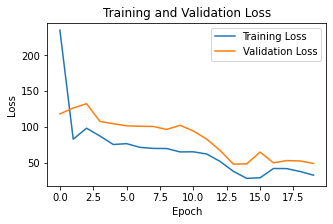

	Layers: 3
        Activation: sigmoid
        Regularisation: l2
        Epochs: 20
        Learning Rate: 0.1
        Test Loss: 32.14079666137695
        Test RMSE: 3.844430685043335





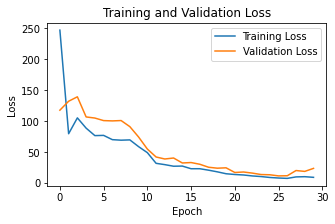

	Layers: 3
        Activation: sigmoid
        Regularisation: l2
        Epochs: 30
        Learning Rate: 0.1
        Test Loss: 16.000661849975586
        Test RMSE: 3.5067317485809326





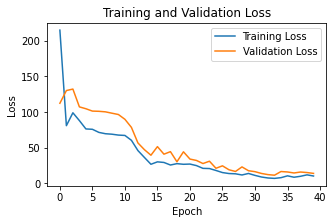

	Layers: 3
        Activation: sigmoid
        Regularisation: l2
        Epochs: 40
        Learning Rate: 0.1
        Test Loss: 9.418103218078613
        Test RMSE: 2.4285991191864014





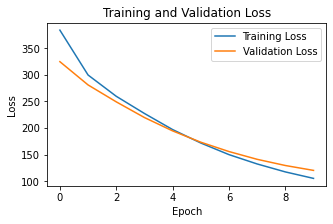

	Layers: 3
        Activation: sigmoid
        Regularisation: l2
        Epochs: 10
        Learning Rate: 0.01
        Test Loss: 112.5541763305664
        Test RMSE: 10.520584106445312





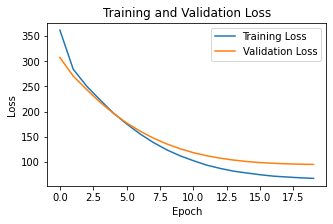

	Layers: 3
        Activation: sigmoid
        Regularisation: l2
        Epochs: 20
        Learning Rate: 0.01
        Test Loss: 76.3337631225586
        Test RMSE: 8.67866039276123





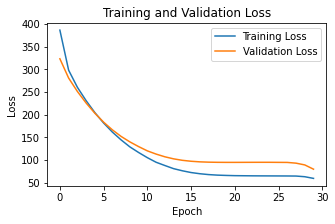

	Layers: 3
        Activation: sigmoid
        Regularisation: l2
        Epochs: 30
        Learning Rate: 0.01
        Test Loss: 61.0870361328125
        Test RMSE: 7.705248832702637





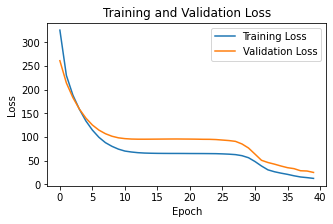

	Layers: 3
        Activation: sigmoid
        Regularisation: l2
        Epochs: 40
        Learning Rate: 0.01
        Test Loss: 14.512809753417969
        Test RMSE: 3.4194817543029785





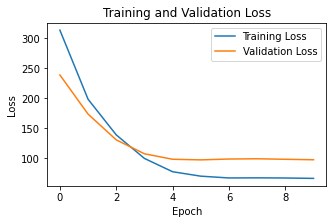

	Layers: 3
        Activation: sigmoid
        Regularisation: l2
        Epochs: 10
        Learning Rate: 0.03
        Test Loss: 73.79708862304688
        Test RMSE: 8.464506149291992





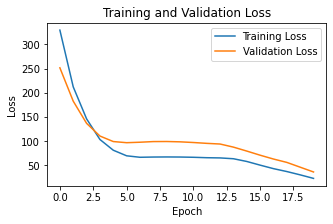

	Layers: 3
        Activation: sigmoid
        Regularisation: l2
        Epochs: 20
        Learning Rate: 0.03
        Test Loss: 23.4727840423584
        Test RMSE: 4.503026008605957





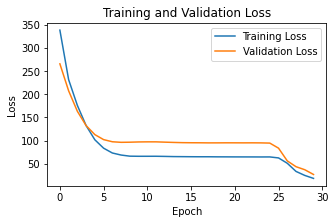

	Layers: 3
        Activation: sigmoid
        Regularisation: l2
        Epochs: 30
        Learning Rate: 0.03
        Test Loss: 16.778833389282227
        Test RMSE: 3.4179952144622803





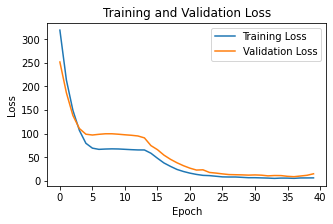

	Layers: 3
        Activation: sigmoid
        Regularisation: l2
        Epochs: 40
        Learning Rate: 0.03
        Test Loss: 10.72128963470459
        Test RMSE: 2.9079055786132812





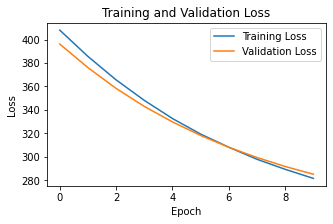

	Layers: 3
        Activation: sigmoid
        Regularisation: l2
        Epochs: 10
        Learning Rate: 0.001
        Test Loss: 299.7799072265625
        Test RMSE: 17.266714096069336





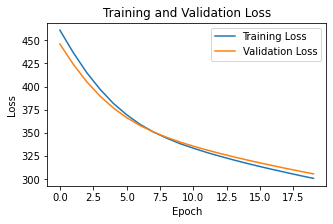

	Layers: 3
        Activation: sigmoid
        Regularisation: l2
        Epochs: 20
        Learning Rate: 0.001
        Test Loss: 322.2367858886719
        Test RMSE: 17.90438461303711





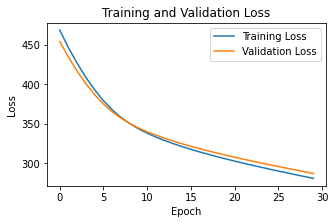

	Layers: 3
        Activation: sigmoid
        Regularisation: l2
        Epochs: 30
        Learning Rate: 0.001
        Test Loss: 302.3518371582031
        Test RMSE: 17.341495513916016





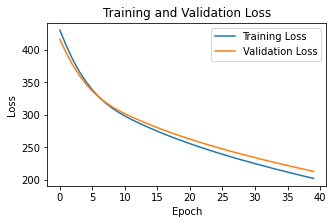

	Layers: 3
        Activation: sigmoid
        Regularisation: l2
        Epochs: 40
        Learning Rate: 0.001
        Test Loss: 219.9796905517578
        Test RMSE: 14.778702735900879





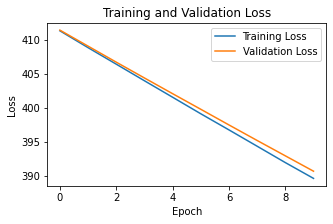

	Layers: 3
        Activation: sigmoid
        Regularisation: l2
        Epochs: 10
        Learning Rate: 0.0001
        Test Loss: 414.1366271972656
        Test RMSE: 20.313175201416016





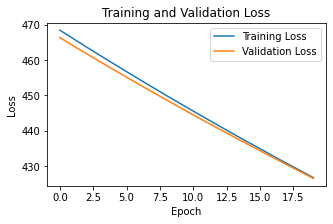

	Layers: 3
        Activation: sigmoid
        Regularisation: l2
        Epochs: 20
        Learning Rate: 0.0001
        Test Loss: 452.6723937988281
        Test RMSE: 21.240493774414062





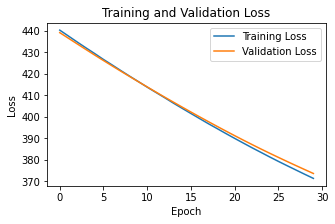

	Layers: 3
        Activation: sigmoid
        Regularisation: l2
        Epochs: 30
        Learning Rate: 0.0001
        Test Loss: 395.9512023925781
        Test RMSE: 19.85970687866211





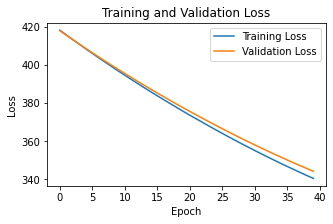

	Layers: 3
        Activation: sigmoid
        Regularisation: l2
        Epochs: 40
        Learning Rate: 0.0001
        Test Loss: 364.20343017578125
        Test RMSE: 19.043310165405273





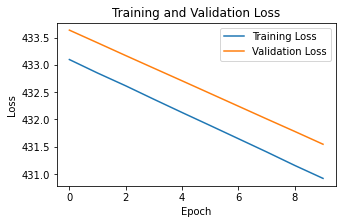

	Layers: 3
        Activation: sigmoid
        Regularisation: l2
        Epochs: 10
        Learning Rate: 1e-05
        Test Loss: 458.1025390625
        Test RMSE: 21.36703872680664





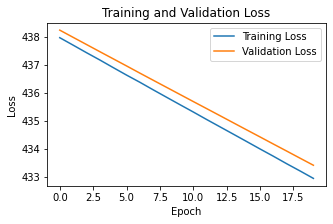

	Layers: 3
        Activation: sigmoid
        Regularisation: l2
        Epochs: 20
        Learning Rate: 1e-05
        Test Loss: 460.00067138671875
        Test RMSE: 21.41181182861328





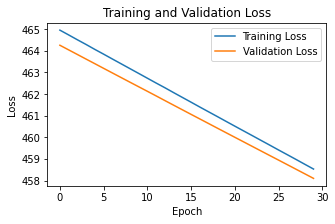

	Layers: 3
        Activation: sigmoid
        Regularisation: l2
        Epochs: 30
        Learning Rate: 1e-05
        Test Loss: 486.3481750488281
        Test RMSE: 22.01829719543457





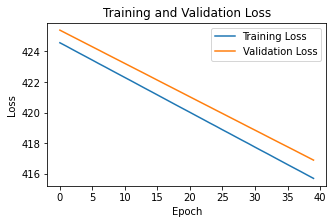

	Layers: 3
        Activation: sigmoid
        Regularisation: l2
        Epochs: 40
        Learning Rate: 1e-05
        Test Loss: 442.3618469238281
        Test RMSE: 20.996295928955078





In [28]:
# Visualising Training and Test Loss for all 576 Models
for i in range(576):
  history = models['History'][i].history
  performance = models['Performance'][i]
  plt.figure(figsize = (5,3))
  plt.title('Training and Validation Loss')
  plt.plot(history['loss'])
  plt.plot(history['val_loss'])
  plt.xlabel('Epoch')
  plt.ylabel('Loss')
  plt.legend(['Training Loss', 'Validation Loss'])
  plt.show()
  print(
      f"""\tLayers: {models['Layer'][i]}
        Activation: {models['Activation'][i]}
        Regularisation: {models['Regulariser'][i]}
        Epochs: {models['Epochs'][i]}
        Learning Rate: {models['Lr'][i]}
        Test Loss: {performance[0]}
        Test RMSE: {performance[1]}""")
  print('\n\n')

In [24]:
# The Loss and RMSE Values of the Best Model
models['Performance'][int(np.argmin(models['Performance'])/2)]

[4.873104095458984, 0.9813826680183411]

	Layers: 1
      	Activation: relu
      	Regularisation: l1
      	Epochs: 30
      	Learning Rate: 0.3
      	Test Loss: 4.873104095458984
      	Test RMSE: 0.9813826680183411


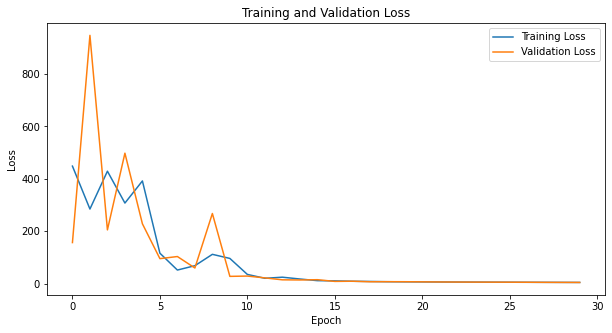

In [29]:
# Plotting Training and Validation Losses for Best Model 
modelx = int(np.argmin(models['Performance'])/2) # Finding index of the the Best Model(modelx)
history = models['History'][modelx].history
performance = models['Performance'][modelx]
print(f"""\tLayers: {models['Layer'][modelx]}
      \tActivation: {models['Activation'][modelx]}
      \tRegularisation: {models['Regulariser'][modelx]}
      \tEpochs: {models['Epochs'][modelx]}
      \tLearning Rate: {models['Lr'][modelx]}
      \tTest Loss: {performance[0]}
      \tTest RMSE: {performance[1]}""")
plt.figure(figsize = (10,5))
plt.title('Training and Validation Loss')
plt.plot(history['loss'])
plt.plot(history['val_loss'])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend(['Training Loss', 'Validation Loss'])
plt.show()